In [1]:
# To run this, save this ipynb file and the excel file in the same location and rename the csv to Soton_Winch_15min_earth_sense
# Below we run the imports
import pandas as pd
from itertools import cycle
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from collections import defaultdict
import numpy as np
import math
from datetime import datetime, timedelta
from numpy import linalg
!pip install cvxpy
import cvxpy as cp
from tqdm import tqdm
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import plotly.express as px
from windrose import WindroseAxes
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [2]:
# In this cell we load the data used in this file
# First we load the 15 min, 1 hour and 24 hour EarthSense data
file_path_15_min_earth_sence = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\Soton_Winch_15min_earth_sense.csv'
file_path_1_hour_earth_sence = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\Soton_Winch_1hour_earth_sense.csv'
file_path_24_hour_earth_sence = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\Soton_Winch_24hour_earth_sense.csv'

data_15 = pd.read_csv(file_path_15_min_earth_sence)
data_1 = pd.read_csv(file_path_1_hour_earth_sence)
data_24 = pd.read_csv(file_path_24_hour_earth_sence)

print(data_15.shape)
print(data_1.shape)
print(data_24.shape)

mega_earth_sense_data = [data_15, data_1, data_24]

# For most of the the project I wrapped all EarthSense data into a single place 
# This splits each dataset up by sensor id
split_per_id_15m = []
split_per_id_1h = []
split_per_id_24h = []

all_splits_per_id = [split_per_id_15m, split_per_id_1h, split_per_id_24h]
    
for i in range(len(mega_earth_sense_data)):
    data = mega_earth_sense_data[i]
    id_col = data.iloc[:, 4]   

    # Group by ID column
    grouped_data = data.groupby(id_col)

    # Iterate over groups
    for group_id, group_data in grouped_data:
        all_splits_per_id[i].append([group_id, group_data])

# Importing data from the non earth sense sensors
file_path_new_forest_totton = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\new_forest_totton_data.csv'
file_path_Winch_st_georges = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\Winchester St Georges Street.csv'
file_path_AURN = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\AURN data.csv'
file_path_New_Forest_Fawley = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\New_Forest_Fawley.csv'
file_path_Eastleigh_Southampton_Road = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\Eastleigh_Southampton_Road.csv'

data_nft = pd.read_csv(file_path_new_forest_totton)
data_wst = pd.read_csv(file_path_Winch_st_georges)
data_aurn = pd.read_csv(file_path_AURN)
data_New_Forest_Fawley = pd.read_csv(file_path_New_Forest_Fawley)
data_Eastleigh_Southampton_Road = pd.read_csv(file_path_Eastleigh_Southampton_Road)

print(data_nft.shape)
print(data_wst.shape)
print(data_aurn.shape)
print(data_New_Forest_Fawley.shape)
print(data_Eastleigh_Southampton_Road.shape)

# Below we load the map used to plot the locations of sensors
map_of_hants = mpimg.imread('C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\map_2.png')

# Load in the met office weather data
weather_path = "C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\weather.csv"
weather_data = pd.read_csv(weather_path)

# Here we load the data from 2024 
# This was used to assess the impact of the St Marrys factory fire
AURN_post_fire_path = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\Aurn_feb_mar.csv'
AURN_post_fire = pd.read_csv(AURN_post_fire_path)

# Earth sence 2024 data
file_path_15_min_earth_sence_24 = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\SouthamptonCC_15min_2024-03-26_1223.csv'
file_path_1_hour_earth_sence_24 = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\SouthamptonCC_1hour_2024-03-26_1235.csv'
file_path_24_hour_earth_sence_24 = 'C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\SouthamptonCC_24hour_2024-03-26_1237.csv'

data_15_24 = pd.read_csv(file_path_15_min_earth_sence_24)
data_1_24 = pd.read_csv(file_path_1_hour_earth_sence_24)
data_24_24 = pd.read_csv(file_path_24_hour_earth_sence_24)

print(data_15_24.shape)
print(data_1_24.shape)
print(data_24_24.shape)

mega_earth_sense_data_2024 = [data_15_24, data_1_24, data_24_24]

split_per_id_15m_2024 = []
split_per_id_1h_2024 = []
split_per_id_24h_2024 = []

all_splits_per_id_2024 = [split_per_id_15m_2024, split_per_id_1h_2024, split_per_id_24h_2024]
    
for i in range(len(mega_earth_sense_data_2024)):
    data = mega_earth_sense_data_2024[i]
    id_col = data.iloc[:, 4]   

    # Group by ID column
    grouped_data = data.groupby(id_col)

    # Iterate over groups
    for group_id, group_data in grouped_data:
        all_splits_per_id_2024[i].append([group_id, group_data])

C:\Users\olive\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py:3442: DtypeWarning: Columns (21) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


(444088, 23)
(175302, 26)
(7290, 21)


C:\Users\olive\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py:3442: DtypeWarning: Columns (3,4,5,6,7,8,9,10,11,12,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


(9497, 5)
(35043, 41)
(10834, 46)
(9697, 4)
(9697, 6)
(147820, 21)
(36954, 21)
(1548, 21)


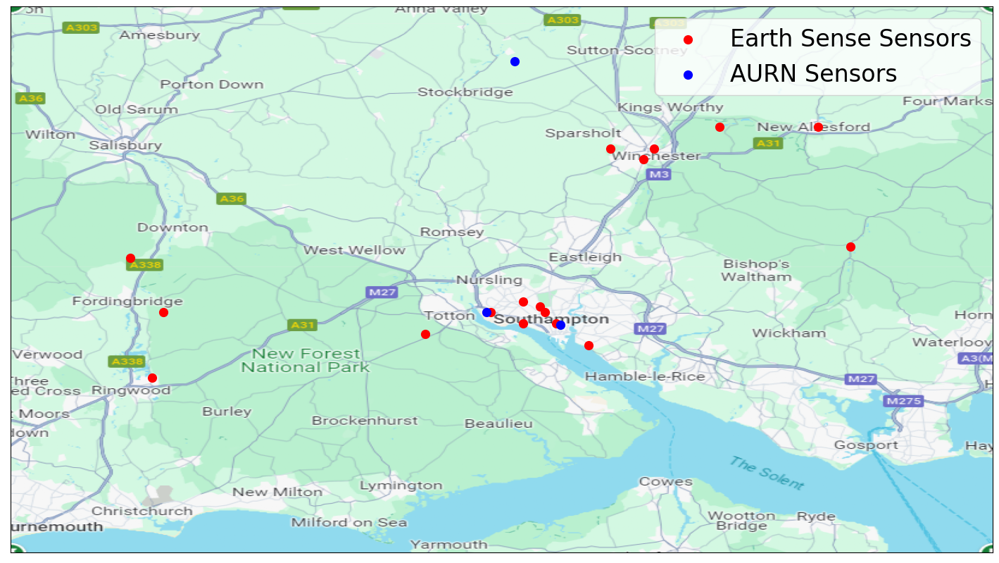

In [35]:
# Plotting location of sensors

# First we use the recorded sensor locations from the EarthSense sensors
# This locaion data was sometimes inconsitent

# List of EarthSense IDs
ids = [386,1090,1123,1314,1382,1130,1098,1293,1070,1071,1168,1328,1170,1136,1396,1391,1392] # For neat map 1398 (the indore sensor) isn't included
unique_values = []
full_list = []

lat = data_24.iloc[:, 6]
long = data_24.iloc[:, 7]

# Below we scrape the location data for each sensor
for j in ids:
    for i in range(len(lat)):
        la = lat[i]
        lo = long[i]
        if data_24.iloc[:, 4][i] == j:
            try:
                if not math.isnan(la) or not math.isnan(lo): 
                
                    if (j,round(lo,2),round(la,2)) not in unique_values:
                        unique_values.append((j,round(lo,2),round(la,2)))
            except Exception as e:
                print(lo)

    new_list = []
    for i in range(len(unique_values)):
        if unique_values[i][0] == j:
            new_list.append((unique_values[i][1], unique_values[i][2]))
    full_list.append([j, new_list])

# We plot the locations of these sensors, using their gps coordinates onto a map of Hampshire which is loaded above

plt.figure(figsize=(18, 12))

img = map_of_hants

# Plot the image
plt.imshow(img, extent=[-1.9, -1, 50.7, 51.2])

size = 72

counter = 0
for sublist in full_list:
    
    # Sensor 386 didn't have reliable location data since it was moved in the study
    # Below we manually code its possition
    if sublist[0] == 386:
        x, y = -1.43, 50.91
        plt.scatter(x, y, color='red', label = 'Earth Sense Sensors', s=size)
#         plt.text(x, y, '386', color='black', fontsize=12, ha='center', va='center', fontweight='bold') 
    # Sensor 1391 also didn't have reliable location data
    if sublist[0] == 1391:
        x, y = -1.35, 51.07
        plt.scatter(x, y, color='red', s=size)
#         plt.text(x, y, '1391', color='black', fontsize=12, ha='center', va='center', fontweight='bold')  # Add ID text
    
    if sublist[1]:  # Check if sublist contains location data
        x = [point[0] for point in sublist[1] if point[1]<52]
        y = [point[1] for point in sublist[1] if point[1]<52]
        if len(x) > 1:
            x = sum(x)/2
            y = sum(y)/2
        plt.scatter(x, y, color='red', s=size)
#         try:
#             plt.text(x[0], y[0], sublist[0], color='black', fontsize=12, ha='center', va='center', fontweight='bold')  # Add ID text
#         except:
#             plt.text(x, y, sublist[0], color='black', fontsize=12, ha='center', va='center', fontweight='bold')
    counter += 1

# Next we add the non EarthSense sensor locations manually
plt.scatter(-1.438228, 51.149617,  color='blue', label='AURN Sensors', s=size)
plt.scatter(-1.463484, 50.920265,  color='blue', s=size)
plt.scatter(-1.395757, 50.908173,  color='blue', s=size)
# plt.scatter(-1.314130, 51.062940, color='green', edgecolor='black', label='Winchester St George\'s St')
# plt.scatter(-1.5, 50.91,  color='purple', edgecolor='black', label='New Forest - Totton')
# plt.scatter(-1.35, 50.83,  color='yellow', edgecolor='black', label='New Forest - Fawley')
# plt.scatter(-1.35, 50.97,  color='pink', edgecolor='black', label='Eastleigh - Southampton Road')
# plt.tick_params(axis='both', which='major', labelsize=14)  # Major ticks

plt.legend(fontsize=24)  # Increase legend text size (adjust number as needed)

plt.xticks([])  # Remove x-axis ticks
plt.yticks([])  # Remove y-axis ticks

plt.tick_params(axis='both', which='major', labelsize=16)  # Larger tick label size

# Show plot
# plt.xlabel('Longnitude')
# plt.ylabel('Latitude')
# plt.title('Location of sensors')
# plt.grid(True)
plt.savefig(r'C:\Users\olive\OneDrive\Documents\Soton\Air Quality\images\map.svg', format='svg')
plt.savefig(r'C:\Users\olive\OneDrive\Documents\Soton\Air Quality\images\map.tiff', format='tiff', dpi=300)  # Save as TIFF with 300 DPI resolution


plt.show()


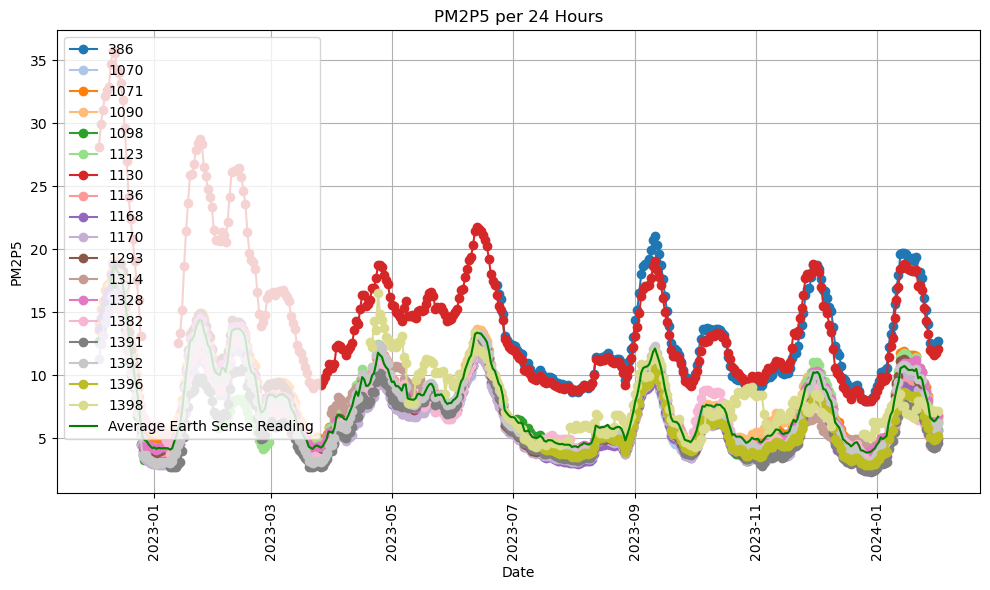

In [4]:
# Now we plot all the data onto a signle graph for innitail investigation
plt.figure(figsize=(10, 6))    

# The following few lines are used a lot so I warped it in a function
def get_date(date_str):
    try:
        date = datetime.strptime(date_str, "%d/%m/%Y")
    except ValueError:
        date = datetime.strptime(date_str, "%Y-%m-%d")
    return date

# Calculating the average of all the earth sense 24-hour data
all_dates = []
for date_str in data_24.iloc[:, 1]:
    date = get_date(date_str)
    all_dates.append(date)
all_dates = sorted(list(set(all_dates)))

date_values = defaultdict(list)

for j in range(18):
    for index, row in all_splits_per_id[2][j][1].iterrows():
        date_str = row[1]  
        date = get_date(date_str)
        
        # The 17th sensor had corrupted data in May and June and hence we remove those months for that sensor here
        if j==16 and date.year == 2023 and (date.month == 5 or date.month == 6):
            continue
            
        if date in all_dates:
            date_values[date].append(row[12])  

average_values = {}
for date, values in date_values.items():
    count = sum(1 for value in values if not np.isnan(value))
    if count >= 8:
        average_values[date] = np.nanmean(values)

average_values = dict(sorted(average_values.items()))

dates_to_plot = list(average_values.keys())
average_values_to_plot = list(average_values.values())

# We use a moving average here but it is perhaps best not to since this risks lossing some important information
moving_avg_all_es = np.convolve(average_values_to_plot, np.ones(15)/15, mode='valid')
dates_es = dates_to_plot[7:len(moving_avg_all_es)+7] 

def plot_es_data(split):
    colors = cycle(plt.cm.tab20.colors)
    for j in range(18):
        color = next(colors)
        dates = []
        values = []
        if j != 16:
            for date_str in all_splits_per_id[split][j][1].iloc[:, 1]:
                date = get_date(date_str)
                dates.append(date)
            values = all_splits_per_id[split][j][1].iloc[:, 12]
        else:
            date_strs = list(all_splits_per_id[split][j][1].iloc[:, 1])
            for d in range(len(date_strs)):
                date = get_date(date_strs[d])
                if date.year == 2023 and (date.month == 5 or date.month == 6):
                        continue
                dates.append(date)
                values.append(all_splits_per_id[split][j][1].iloc[d, 12])
 
        moving_avg = np.convolve(values, np.ones(15)/15, mode='valid')
        # Adjust dates to match the length of the moving average
        dates = dates[7:len(moving_avg)+7]
            
        try:
            plt.plot(dates, moving_avg, marker='o', linestyle='-', color=color, label=all_splits_per_id[split][j][0])
        except ValueError:
            pass

plot_es_data(2)
plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')


plt.title('PM2P5 per 24 Hours')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()



In [5]:
# Findind differences in varriance
# This cell was used to show that the inter-day variance of readings is higher than the inter-sensor readings on any given day

# We only consider the sensors which were shown to be reliable
ids_of_intrest = [1070, 1071, 1098, 1123, 1136, 1168, 1170, 1293, 1328, 1382, 1391, 1392]

inter_day_var_and_range_per_sensor = []
for i in range(18):
    sens = all_splits_per_id[2][i][0]
    if sens in ids_of_intrest:
        va = round(all_splits_per_id[2][i][1].iloc[:,12].var(), 2)
        ra = round(all_splits_per_id[2][i][1].iloc[:, 12].max() - all_splits_per_id[2][i][1].iloc[:, 12].min(), 2)
        inter_day_var_and_range_per_sensor.append([sens,va,ra])

va_val = [sublist[1] for sublist in inter_day_var_and_range_per_sensor]
ra_val = [sublist[2] for sublist in inter_day_var_and_range_per_sensor]

var_of_sensors_per_day = []
range_of_sensors_per_day = []
for day in range(len(all_dates)):
    value_of_day = []
    for i in range(18):
        sens = all_splits_per_id[2][i][0]
        if sens in ids_of_intrest:
            try: value_of_day.append(all_splits_per_id[2][i][1].iloc[day,12]) 
            except: None
    count = sum(1 for value in value_of_day if not np.isnan(value))
    if count > 8:
        var_of_sensors_per_day.append(pd.Series(value_of_day).var())
        range_of_sensors_per_day.append(pd.Series(value_of_day).max() - pd.Series(value_of_day).min())

print(f'mean var of day values per sensor is {np.mean(va_val)}')
print(f'mean range of day values per sensor is {np.mean(ra_val)}')

print(f'mean var of sensor values per day is {np.mean(var_of_sensors_per_day)}')
print(f'mean range of sensor values per day is {np.mean(range_of_sensors_per_day)}')

mean var of day values per sensor is 24.8425
mean range of day values per sensor is 27.429166666666664
mean var of sensor values per day is 10.483326238492147
mean range of sensor values per day is 9.201025641025641


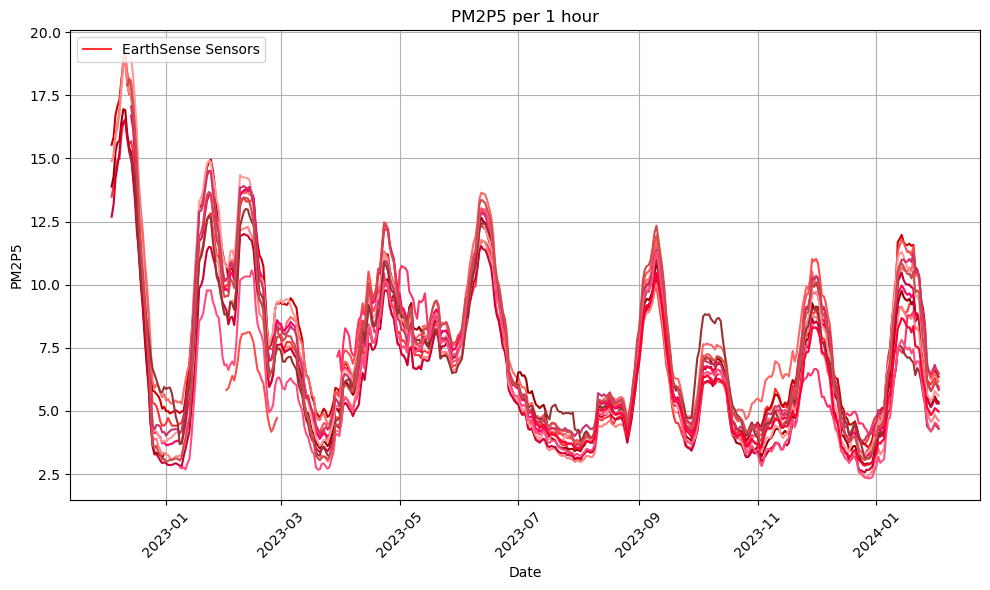

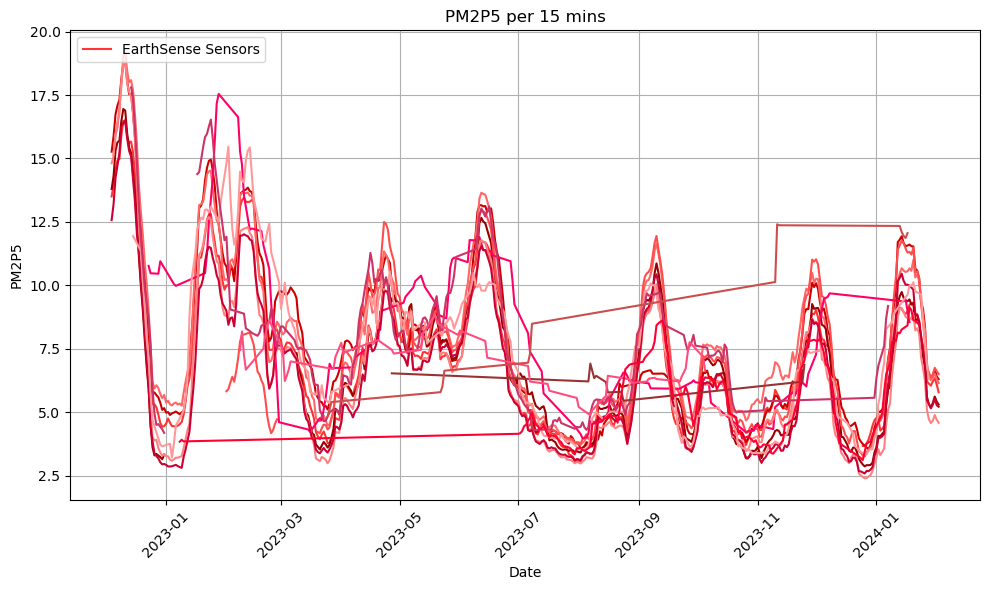

In [6]:
# Considering the 1 hour data
list_of_intrest = [2,3,4,5,7,8,9,10,11,12,13,14,15,16,17]
def plot_es_data(split):
    shades_of_red = [(255, 0, 0), (255, 51, 51), (204, 0, 0), (255, 102, 102), (153, 0, 0), (255, 77, 77), (204, 51, 51), (255, 0, 102), (255, 128, 128), (204, 0, 51), (255, 153, 153), (255, 51, 102), (204, 51, 102), (153, 51, 51), (255, 77, 128), (204, 77, 77), (255, 0, 51)]
    colors = [(r/255, g/255, b/255) for r, g, b in shades_of_red]
    for j in range(17): # 18 for non neat
        color = colors[j]
        dates = []
        values = []
        if j != 16:
            for date_str in all_splits_per_id[split][j][1].iloc[:, 1]:
                date = get_date(date_str)
                dates.append(date)
            values = all_splits_per_id[split][j][1].iloc[:, 12]
        else:
            date_strs = list(all_splits_per_id[split][j][1].iloc[:, 1])
            for d in range(len(date_strs)):
                date = get_date(date_strs[d])
                if date.year == 2023 and (date.month == 5 or date.month == 6):
                        continue
                dates.append(date)
                values.append(all_splits_per_id[split][j][1].iloc[d, 12])

        # Create a DataFrame from dates and values
        df = pd.DataFrame({'Date': dates, 'Value': values})
        # Group by date and calculate the mean value for each date
        grouped = df.groupby('Date')['Value'].mean().reset_index()

        # Calculate the 15-point moving average
        moving_avg = np.convolve(grouped['Value'], np.ones(15)/15, mode='valid')
        # Adjust dates to match the length of the moving average
        dates = grouped['Date'][7:len(moving_avg)+7] 

        try:
            if j == 1:
                plt.plot(dates, moving_avg, color=color, label='EarthSense Sensors') #all_splits_per_id[split][j][0])
            elif j in list_of_intrest:
                plt.plot(dates, moving_avg, color=color) #, label=all_splits_per_id[split][j][0])
        except ValueError:
            pass

plt.figure(figsize=(10, 6))
plot_es_data(1)
plt.title('PM2P5 per 1 hour')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()

# Considering the 15 min data
plt.figure(figsize=(10, 6))
plot_es_data(0)
plt.title('PM2P5 per 15 mins')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()



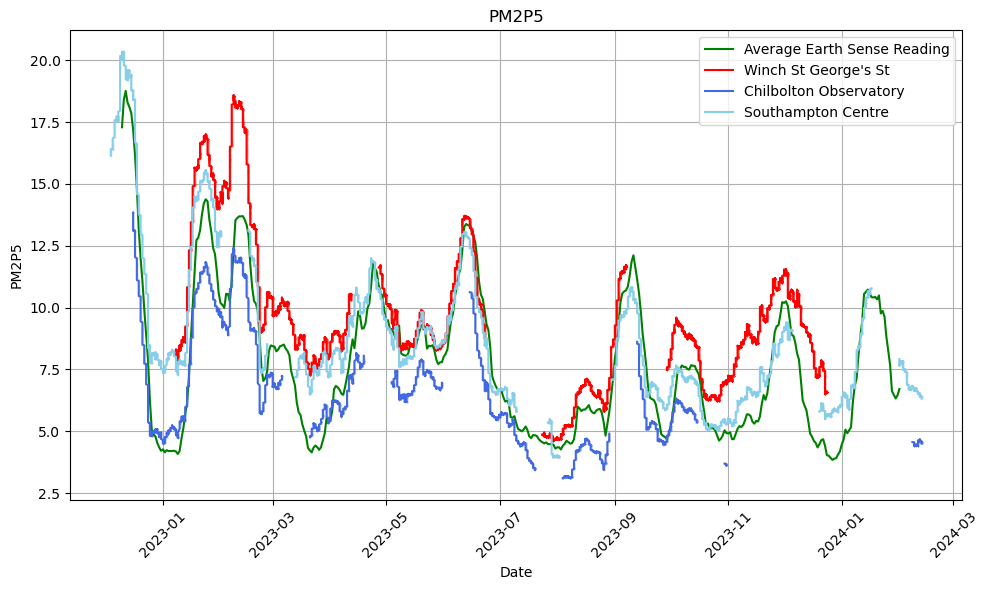

In [7]:
# This cell shows a comparrison of the average EarthSense sensor with the non EarthSense sensors we had PM2.5 data for

plt.figure(figsize=(10, 6))

plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')

# Winch st george data
dates = []
for date_str in data_wst.iloc[3:, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
    
values = data_wst.iloc[3:, 10]
values = pd.to_numeric(values, errors='coerce')

# Calculate the 1440-point moving average (15 day average)
moving_avg = np.convolve(values, np.ones(1440)/1440, mode='valid')
# Adjust dates to match the length of the moving average
dates = dates[719:len(moving_avg)+719] 

plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='red', label='Winch St George\'s St')

# Aurn data
dates = []
for date_str in data_aurn.iloc[10:10834, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
    
values = data_aurn.iloc[10:10834, 4]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
dates = dates[179:len(moving_avg)+179] 
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='royalblue', label='Chilbolton Observatory')

values = data_aurn.iloc[10:10834, 14]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='skyblue', label='Southampton Centre')



plt.title('PM2P5')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper right')  # Add legend
plt.tight_layout()
plt.show()


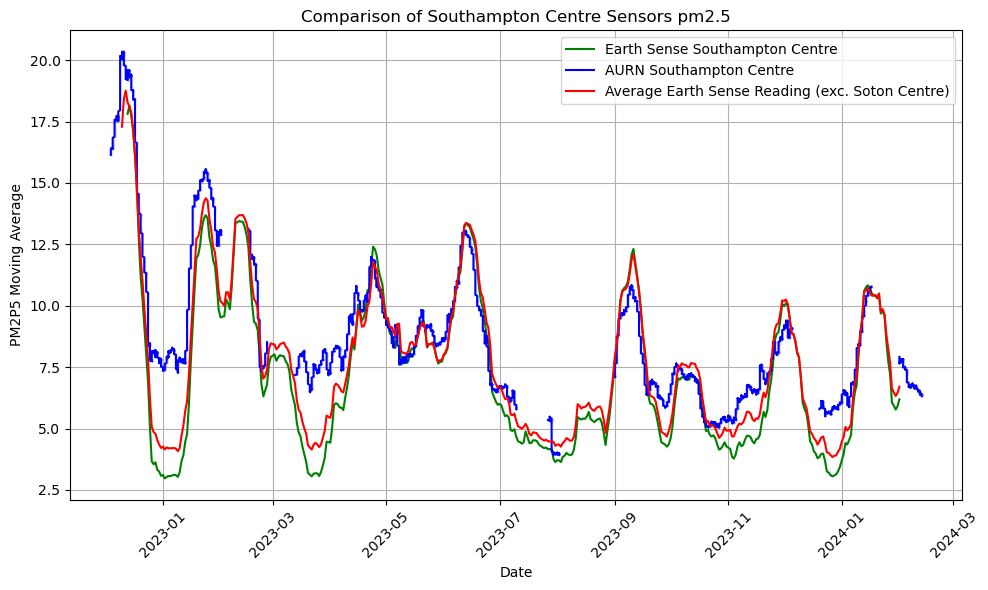

In [8]:
# In order to understand the accuracy of the low cost EarthSense sensors we compare the Soton' centre EarthSense sensor 
# against AURN data from the same location
plt.figure(figsize=(10, 6))

#  Earth Sense SC
dates = []
for date_str in all_splits_per_id[2][-3][1].iloc[:, 3]:
    date = get_date(date_str)
    dates.append(date)

values = all_splits_per_id[2][-3][1].iloc[:, 12]


moving_avg = np.convolve(values, np.ones(15)/15, mode='valid')
dates = dates[7:len(moving_avg)+7] 
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='green', label = 'Earth Sense Southampton Centre')

# Aurn SC data
dates = []
for date_str in data_aurn.iloc[10:10834, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
values = data_aurn.iloc[10:10834, 14]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
dates = dates[179:len(moving_avg)+179] 
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='blue', label='AURN Southampton Centre')

plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='red', label = 'Average Earth Sense Reading (exc. Soton Centre)')

plt.title('Comparison of Southampton Centre Sensors pm2.5')
plt.xlabel('Date')
plt.ylabel('PM2P5 Moving Average')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper right') 
plt.tight_layout()
plt.show()

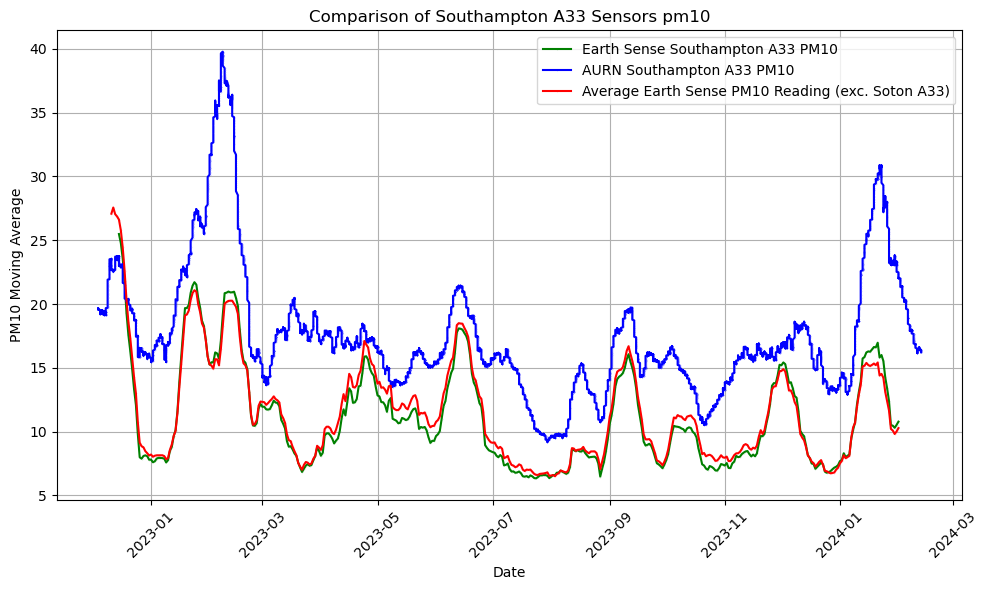

In [9]:
# Looking at accuracy of soton A33 sensor against AURN data using pm10
plt.figure(figsize=(10, 6))

#  Earth Sense S A33
dates = []
for date_str in all_splits_per_id[2][12][1].iloc[:, 3]:
    date = get_date(date_str)
    dates.append(date)

values = all_splits_per_id[2][12][1].iloc[:, 13]


moving_avg = np.convolve(values, np.ones(15)/15, mode='valid')
dates = dates[7:len(moving_avg)+7] 
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='green', label = 'Earth Sense Southampton A33 PM10')

# Aurn S A33 data
dates = []
for date_str in data_aurn.iloc[10:10834, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
values = data_aurn.iloc[10:10834, 8]
values = pd.to_numeric(values, errors='coerce')

def custom_moving_average(values, window_size, min_count=180):
    # Ensure values are a numpy array for easier manipulation
    values = np.array(values)
    n = len(values)
    moving_averages = []

    # Calculate the moving average considering the window size
    for start_index in range(n - window_size + 1):
        end_index = start_index + window_size
        window_values = values[start_index:end_index]

        # Count non-NaN values in the window
        non_nan_values = window_values[~np.isnan(window_values)]
        if len(non_nan_values) >= min_count:
            # Calculate the average if enough non-NaN values
            window_average = np.nanmean(non_nan_values)
            moving_averages.append(window_average)
        else:
            # Append NaN or some placeholder if not enough values
            moving_averages.append(np.nan)

    return np.array(moving_averages)

window_size = 360
moving_avg = custom_moving_average(values, window_size)

dates = dates[179:len(moving_avg)+179] 
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='blue', label='AURN Southampton A33 PM10')

# Calculating the average of all the earth sense 24-hour data pm10
all_dates_pm10 = []
for date_str in data_24.iloc[:, 1]:
    date = get_date(date_str)
    all_dates_pm10.append(date)
all_dates_pm10 = sorted(list(set(all_dates_pm10)))

date_values_pm10 = defaultdict(list)

for j in range(18):
    if j!=12: # For when investigating sensor in Soton a33 sensor
        if j!=16:
            for index, row in all_splits_per_id[2][j][1].iterrows():
                date_str = row[1]  
                date = get_date(date_str)

                if date in all_dates:
                    date_values_pm10[date].append(row[13])  
        else:
            for index, row in all_splits_per_id[2][j][1].iterrows():
                date_str = row[1]  
                date = get_date(date_str)

                if date.year == 2023 and (date.month == 5 or date.month == 6):
                        continue

                else:
                    if date in all_dates:
                        date_values_pm10[date].append(row[13])  

average_values_pm10 = {}
for date, values in date_values_pm10.items():
    count = sum(1 for value in values if not np.isnan(value))
    if count >= 8:
        average_values_pm10[date] = np.nanmean(values)

average_values_pm10 = dict(sorted(average_values_pm10.items()))

dates_to_plot_pm10 = list(average_values_pm10.keys())
average_values_to_plot_pm10 = list(average_values_pm10.values())

moving_avg_all_es_pm10 = np.convolve(average_values_to_plot_pm10, np.ones(15)/15, mode='valid')
dates_es_pm10 = dates_to_plot_pm10[7:len(moving_avg_all_es_pm10)+7] 
plt.plot(dates_es_pm10, moving_avg_all_es_pm10, marker='.', markersize=.1, linestyle='-', color='red', label = 'Average Earth Sense PM10 Reading (exc. Soton A33)')

plt.title('Comparison of Southampton A33 Sensors pm10')
plt.xlabel('Date')
plt.ylabel('PM10 Moving Average')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper right') 
plt.tight_layout()
plt.show()

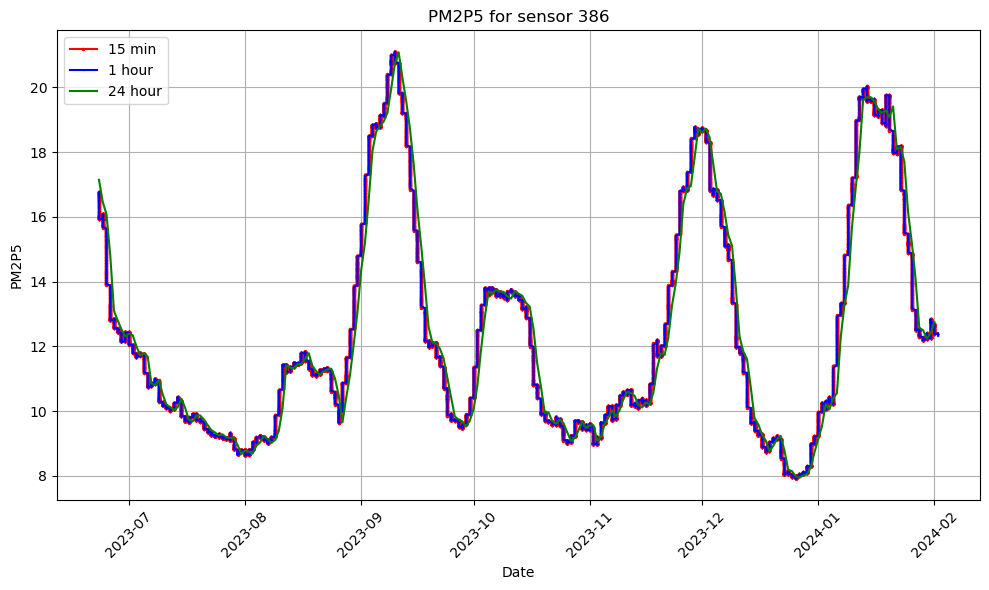

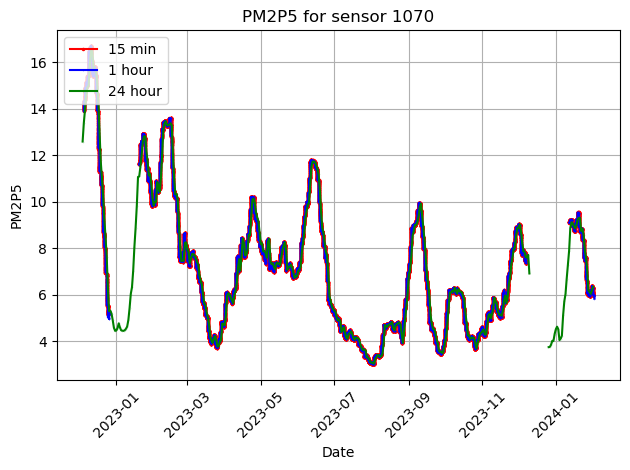

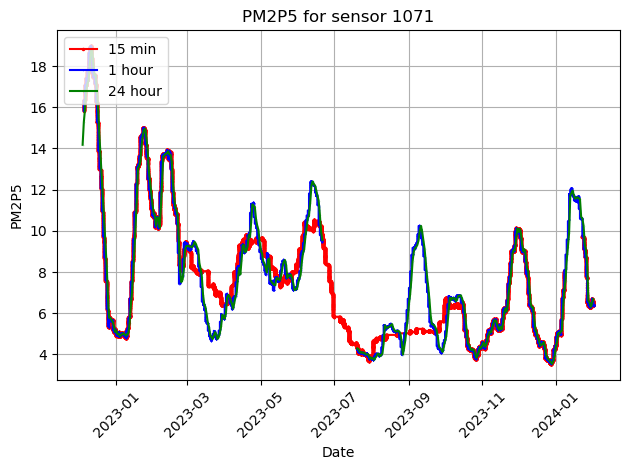

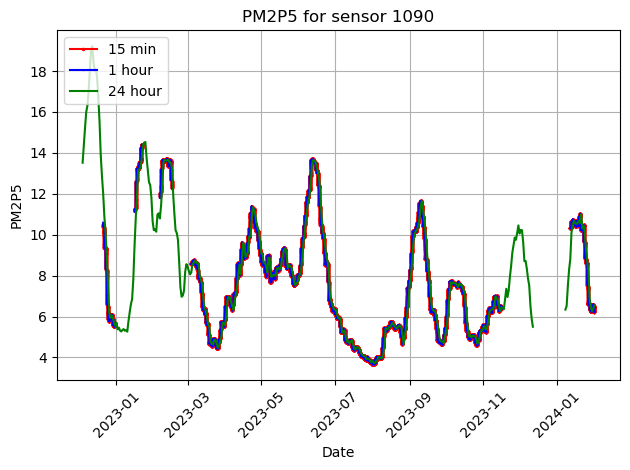

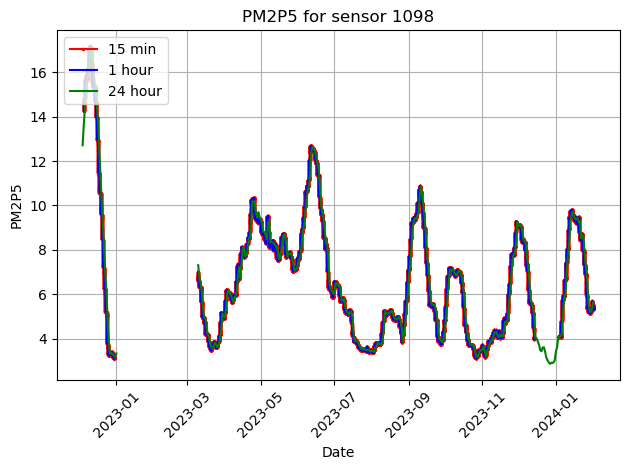

...

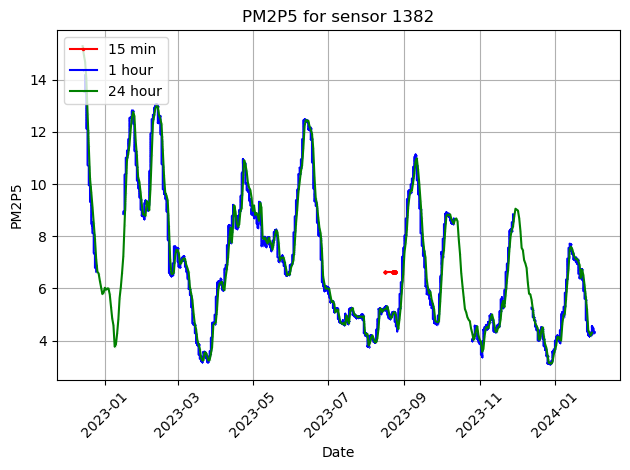

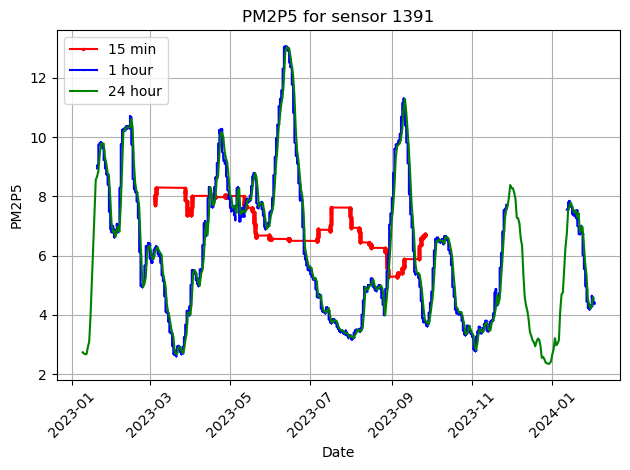

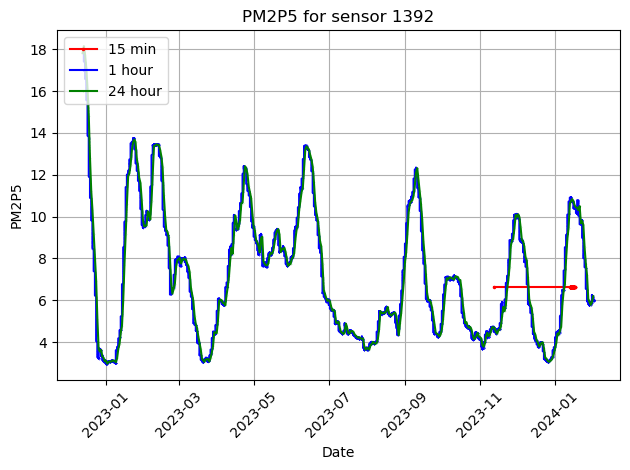

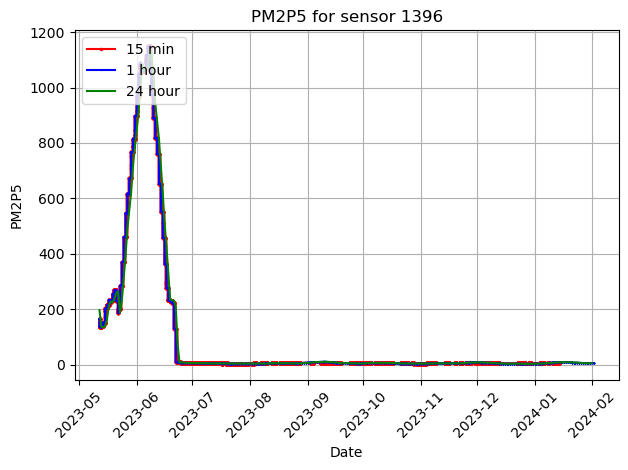

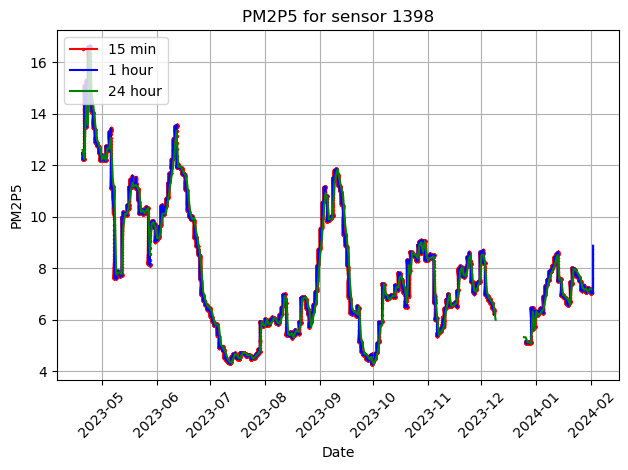

In [10]:
# Investigatng sensors individualy 
plt.figure(figsize=(10, 6))    

sensor_indx = 15 #1392
for j in range(18):
    if j!=11:
        sensor_indx = j

        colors = ['red', 'blue', 'green']
        mvs = [1440, 360, 15]
        labels = ['15 min', '1 hour', '24 hour']
        markersizes = [3, .2, .1]
        for i in range(3):

            dates = []

            for date_str in all_splits_per_id[i][sensor_indx][1].iloc[:, 1]:
                date = get_date(date_str)
                dates.append(date)

            values = all_splits_per_id[i][sensor_indx][1].iloc[:, 12]
            moving_avg = np.convolve(values, np.ones(mvs[i])/mvs[i], mode='valid')

            t = int((mvs[i]+1)/2 -1)
            dates = dates[t:len(moving_avg)+t] 

            plt.plot(dates, moving_avg, marker='.', markersize=markersizes[i], linestyle='-', color=colors[i], label=labels[i])



        plt.title('PM2P5 for sensor ' + str(all_splits_per_id[2][sensor_indx][0]))
        plt.xlabel('Date')
        plt.ylabel('PM2P5')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.grid(True)
        plt.legend(loc='upper left')  # Add legend
        plt.tight_layout()
        plt.show()



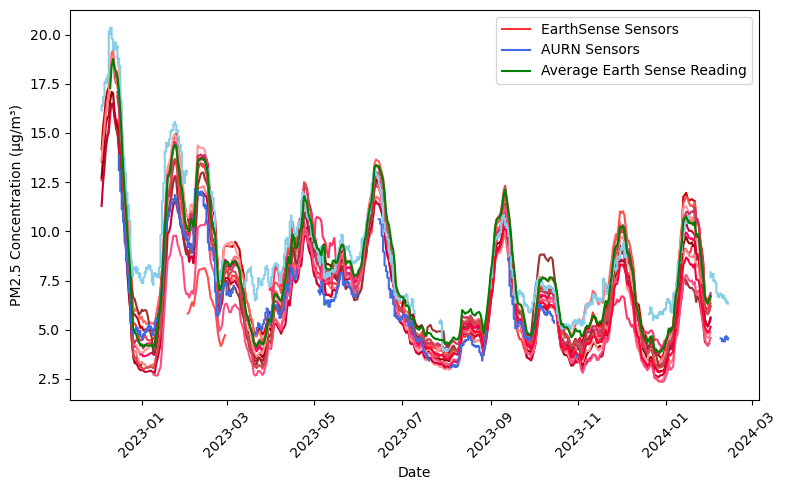

In [11]:
# The following plots all sensors onto the same plot

plt.figure(figsize=(8, 5))    

plot_es_data(2)

# # Winch st george data
# dates = []
# for date_str in data_wst.iloc[3:, 0]:
#     date = datetime.strptime(date_str, "%d/%m/%Y")
#     dates.append(date)
    
# values = data_wst.iloc[3:, 10]
# values = pd.to_numeric(values, errors='coerce')

# # Calculate the 1440-point moving average (15 day average)
# moving_avg = np.convolve(values, np.ones(1440)/1440, mode='valid')
# # Adjust dates to match the length of the moving average
# dates = dates[719:len(moving_avg)+719] 

# plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='red', label='Winch St George\'s St')

# # Eastleigh Southampton Road
# dates = []
# for date_str in data_Eastleigh_Southampton_Road.iloc[1:, 0]:
#     date = datetime.strptime(date_str, "%d/%m/%Y")
#     dates.append(date)
    
# values = data_Eastleigh_Southampton_Road.iloc[1:, 4]
# values = pd.to_numeric(values, errors='coerce')

# # Calculate the 360-point moving average (15 day average)
# moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
# # Adjust dates to match the length of the moving average
# dates = dates[179:len(moving_avg)+179] 

# plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='purple', label='Eastleigh Southampton Road')


# Aurn data
dates = []
for date_str in data_aurn.iloc[10:10834, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
    

values = data_aurn.iloc[10:10834, 4]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
dates = dates[179:len(moving_avg)+179] 
plt.plot(dates, moving_avg, color='royalblue', label='AURN Sensors') #'Chilbolton Observatory')

values = data_aurn.iloc[10:10834, 14]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
plt.plot(dates, moving_avg, color='skyblue') #, label='Southampton Centre')

plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')

# # Plots line on dates of forest fire
# plt.axvline(x=dates[4664], color='r', linestyle=':', label = 'Forest fire')
# plt.axvline(x=dates[6684], color='r', linestyle='--', label = 'Sahara desert dust event')


# plt.title('PM2P5 per 24 Hours')
plt.xlabel('Date')
plt.ylabel('PM2.5 Concentration (µg/m³)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
# plt.grid(True)
plt.subplots_adjust(right=0.7)
plt.legend() #loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.savefig(r'C:\Users\olive\OneDrive\Documents\Soton\Air Quality\images\timeseires.svg', format='svg')

plt.show()



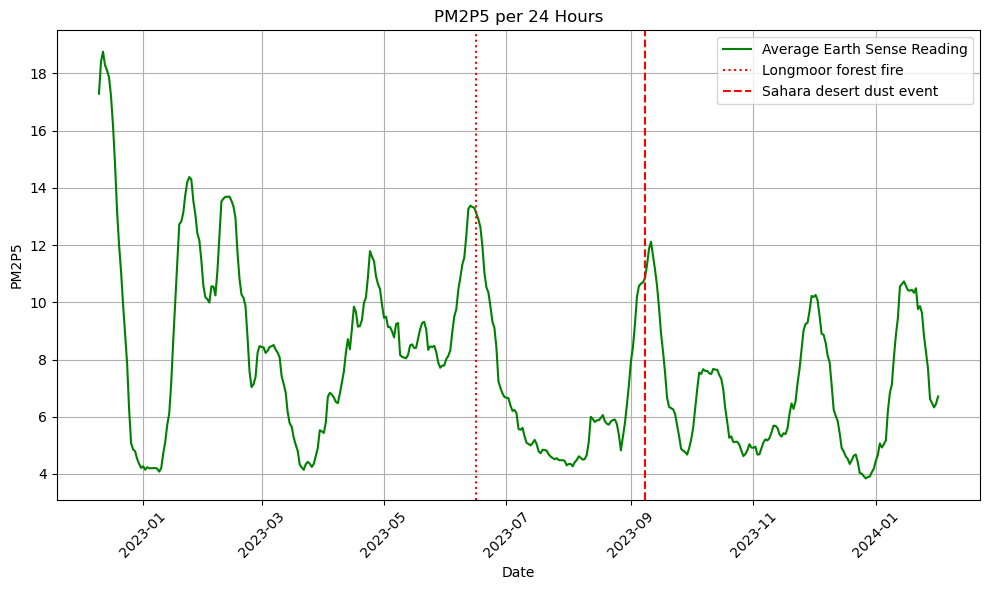

In [12]:
plt.figure(figsize=(10, 6))    
plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')

plt.axvline(x=dates[4664], color='r', linestyle=':', label = 'Longmoor forest fire')
plt.axvline(x=dates[6684], color='r', linestyle='--', label = 'Sahara desert dust event')

plt.title('PM2P5 per 24 Hours')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

Correlation coefficient: 0.621046315363185
Mean Euclidean distance between the time series: 0.24274319534605515


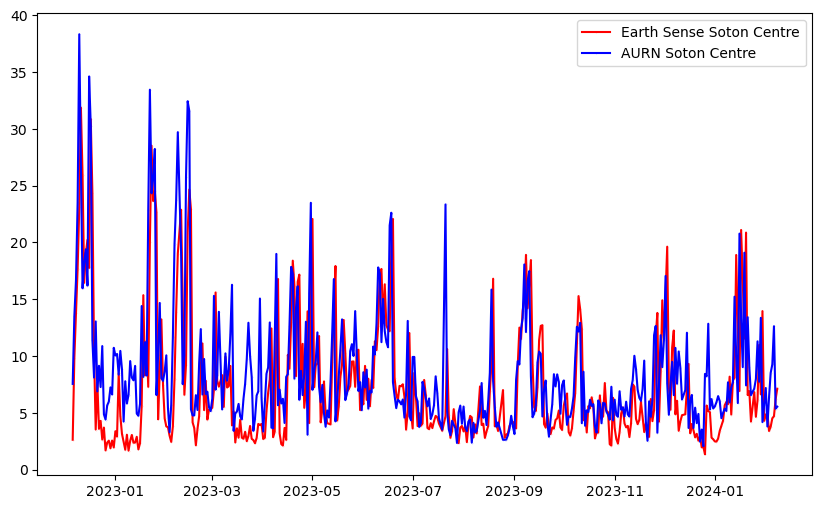

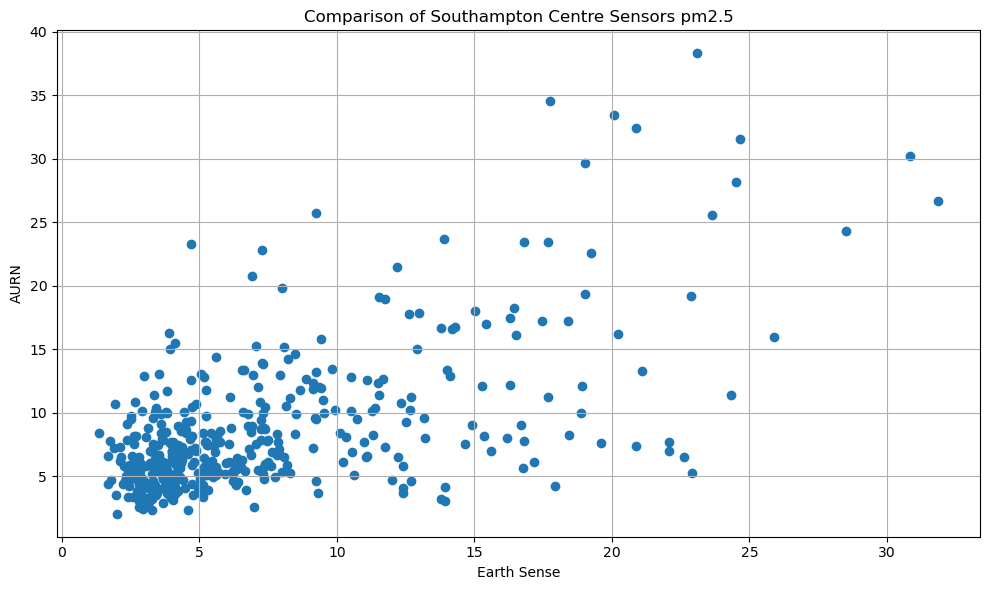

In [13]:
# Looking at accuracy of soton centre sensor against AURN data
plt.figure(figsize=(10, 6))

#  Earth Sense SC
dates_ES = []
for date_str in all_splits_per_id[2][-3][1].iloc[:, 3]:
    date = get_date(date_str)
    dates_ES.append(date)

values_ES = list(all_splits_per_id[2][-3][1].iloc[:, 12])

# Aurn SC data
dates_AURN = []
for date_str in data_aurn.iloc[10:10834, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates_AURN.append(date)
    
timestamps = [date.timestamp() for date in dates_AURN]
reshaped_array = np.reshape(timestamps, (int(len(dates_AURN)/24), 24))
averages = np.mean(reshaped_array, axis=1)
dates_AURN = [datetime.fromtimestamp(avg) for avg in averages]

values_AURN = data_aurn.iloc[10:10834, 14]
values_AURN = pd.to_numeric(values, errors='coerce')
values_AURN = list(values_AURN)
reshaped_array = np.reshape(values_AURN, (int(len(values_AURN)/24), 24))
averages = np.mean(reshaped_array, axis=1)
values_AURN = averages.tolist()

x_ES = []
y_AURN = []
dates_both = []


for i in range(len(dates_ES)):
    if dates_ES[i] in dates_AURN:
        xes = values_ES[i]
        ind = dates_AURN.index(dates_ES[i])
        ya = values_AURN[ind]
        if not np.isnan(xes) and not np.isnan(ya):
            x_ES.append(xes)
            y_AURN.append(ya)
            dates_both.append(dates_ES[i])
        
x_ES = np.array(x_ES)
y_AURN = np.array(y_AURN)
dates_both=np.array(dates_both)

# Calculate correlation coefficient
correlation_coef = np.corrcoef(x_ES, y_AURN)[0, 1]

print("Correlation coefficient:", correlation_coef)

euclidean_distance = np.linalg.norm(x_ES - y_AURN)/len(x_ES)

print("Mean Euclidean distance between the time series:", euclidean_distance)

plt.plot(dates_both, x_ES, marker='.', markersize=.1, linestyle='-', color='red', label = 'Earth Sense Soton Centre')
plt.plot(dates_both, y_AURN, marker='.', markersize=.1, linestyle='-', color='blue', label = 'AURN Soton Centre')
plt.legend()
# print(x_ES)
# print(y_AURN)


plt.figure(figsize=(10, 6))
plt.scatter(x_ES, y_AURN)
plt.title('Comparison of Southampton Centre Sensors pm2.5')
plt.xlabel('Earth Sense')
plt.ylabel('AURN')
plt.grid(True)
plt.tight_layout()
plt.show()

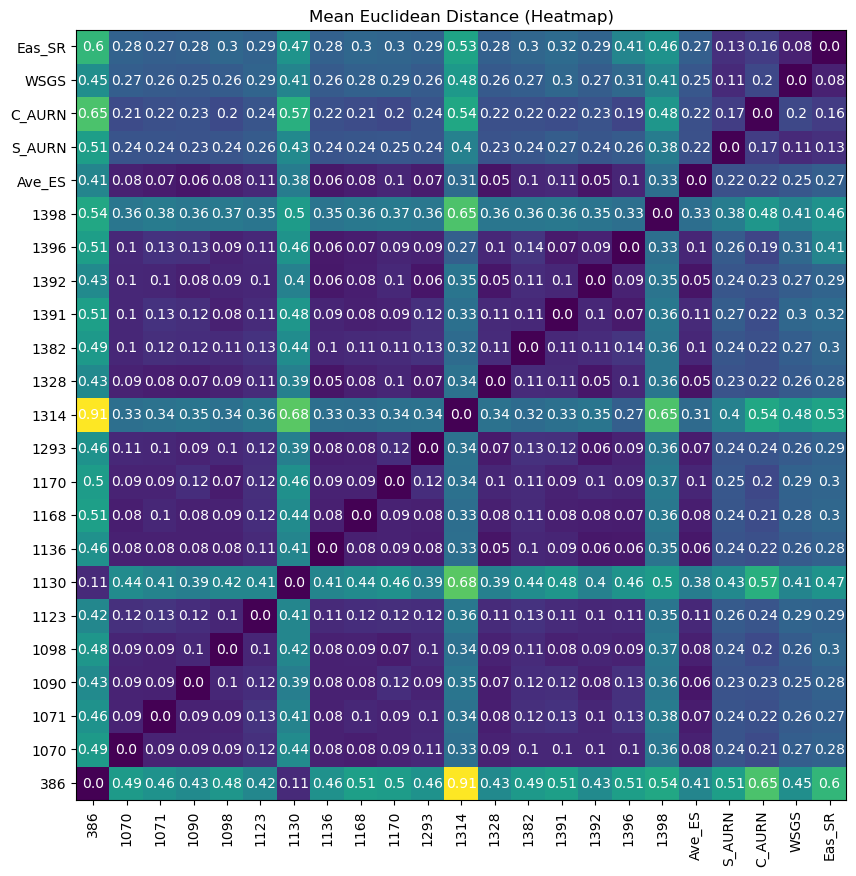

In [14]:
# The following cell was used to display the correlation between the diffrent timeseries recorded by different sensors

values_AURN_Soton = values_AURN

# Aurn Chilbolten data
values_AURN_Chilbolten = data_aurn.iloc[10:10834, 4]
values_AURN_Chilbolten = pd.to_numeric(values_AURN_Chilbolten, errors='coerce')
values_AURN_Chilbolten = list(values_AURN_Chilbolten)
reshaped_array = np.reshape(values_AURN_Chilbolten, (int(len(values_AURN_Chilbolten)/24), 24))
averages = np.mean(reshaped_array, axis=1)
values_AURN_Chilbolten = averages.tolist()

# Winch st george data
wsgs_dates = []
for date_str in data_wst.iloc[3:, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    wsgs_dates.append(date)
timestamps = [date.timestamp() for date in wsgs_dates]
reshaped_array = np.reshape(timestamps, (int(len(wsgs_dates)/(24*4)), 96))
averages = np.mean(reshaped_array, axis=1)
wsgs_dates = [datetime.fromtimestamp(avg) for avg in averages]    

wsgs_values = data_wst.iloc[3:, 10]
wsgs_values = pd.to_numeric(wsgs_values, errors='coerce')
wsgs_values = list(wsgs_values)
reshaped_array = np.reshape(wsgs_values, (int(len(wsgs_values)/(24*4)), 96))
averages = np.mean(reshaped_array, axis=1)
wsgs_values = averages.tolist()

# Eastleigh Southampton Road
esr_dates = []
for date_str in data_Eastleigh_Southampton_Road.iloc[1:, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    esr_dates.append(date)
timestamps = [date.timestamp() for date in esr_dates]
reshaped_array = np.reshape(timestamps, (int(len(esr_dates)/(24)), 24))
averages = np.mean(reshaped_array, axis=1)
esr_dates = [datetime.fromtimestamp(avg) for avg in averages]    

esr_values = data_Eastleigh_Southampton_Road.iloc[1:, 4]
esr_values = pd.to_numeric(esr_values, errors='coerce')
esr_values = list(esr_values)
reshaped_array = np.reshape(esr_values, (int(len(esr_values)/(24)), 24))
averages = np.mean(reshaped_array, axis=1)
esr_values = averages.tolist()

# Data labels
labels = []
for j in range(18):
    labels.append(all_splits_per_id[2][j][0])
labels.extend(['Ave_ES', 'S_AURN', 'C_AURN', 'WSGS', 'Eas_SR'])

def calc_mean_ed_and_cor(x_df_dates, x_df_values, y_df_dates, y_df_values, i, j):
    
    dates_x = []
    values_x = []
    if i != 16 and i < 18:
        for date_str in x_df_dates:
            date = get_date(date_str)
            dates_x.append(date)
        values_x = x_df_values.tolist()
    elif i == 16:
        date_strs = list(x_df_dates)
        x_df_values=x_df_values.tolist()
        for d in range(len(date_strs)):
            date = get_date(date_strs[d])

            if date.year == 2023 and (date.month == 5 or date.month == 6):
                    continue
            dates_x.append(date)
            values_x.append(x_df_values[d])
    else:
        dates_x = x_df_dates
        values_x = x_df_values

    dates_y = []
    values_y = []
    if j != 16 and j < 18:
        for date_str in y_df_dates:
            date = get_date(date_str)
            dates_y.append(date)
        values_y = y_df_values.tolist()
    elif j == 16:
        date_strs = list(y_df_dates)
        y_df_values=y_df_values.tolist()
        for d in range(len(date_strs)):
            date = get_date(date_strs[d])

            if date.year == 2023 and (date.month == 5 or date.month == 6):
                    continue
            dates_y.append(date)
            values_y.append(y_df_values[d])
    else:
        dates_y = y_df_dates
        values_y = y_df_values

            
    x_ = []
    y_ = []
    dates_both = []
    

    for i in range(len(dates_x)):
        if dates_x[i] in dates_y:
            xes = values_x[i]
            ind = dates_y.index(dates_x[i])
            ya = values_y[ind]
            if not np.isnan(xes) and not np.isnan(ya):
                x_.append(xes)
                y_.append(ya)
                dates_both.append(dates_x[i])

    x_ = np.array(x_)
    y_ = np.array(y_)
    dates_both=np.array(dates_both)

    # Calculate correlation coefficient
    correlation_coef = np.corrcoef(x_, y_)[0, 1]
    euclidean_distance = np.linalg.norm(x_ - y_)/len(x_)
    
    return correlation_coef, euclidean_distance

num = 23

# Generate multiplication table data
table_data = np.zeros((num, num))
for i in range(num):
    for j in range(num):
        
        if i < 18:
            x_df_dates = all_splits_per_id[2][i][1].iloc[:, 3]
            x_df_values = all_splits_per_id[2][i][1].iloc[:, 12]
        else:
            if i == 18:
                x_df_dates, x_df_values = dates_to_plot, average_values_to_plot
            if i == 19:
                x_df_dates = dates_AURN
                x_df_values = values_AURN_Soton
            if i == 20:
                x_df_dates = dates_AURN
                x_df_values = values_AURN_Chilbolten
            if i == 21:
                x_df_dates, x_df_values = wsgs_dates, wsgs_values
            if i == 22:
                x_df_dates, x_df_values = esr_dates, esr_values
        if j < 18:
            y_df_dates = all_splits_per_id[2][j][1].iloc[:, 3]
            y_df_values = all_splits_per_id[2][j][1].iloc[:, 12]
        else:
            if j == 18:
                y_df_dates, y_df_values = dates_to_plot, average_values_to_plot
            if j == 19:
                y_df_dates = dates_AURN
                y_df_values = values_AURN_Soton
            if j == 20:
                y_df_dates = dates_AURN
                y_df_values = values_AURN_Chilbolten
            if j == 21:
                y_df_dates, y_df_values =  wsgs_dates, wsgs_values
            if j == 22:
                y_df_dates, y_df_values =  esr_dates, esr_values
                
        try: 
            table_data[i, j] = calc_mean_ed_and_cor(x_df_dates, x_df_values, y_df_dates, y_df_values, i, j)[1]
        except:
            print(i, j)

# Plot heatmap
plt.figure(figsize=(12, 10))
plt.imshow(table_data, cmap='viridis', interpolation='nearest')

# Add annotations
for i in range(num):
    for j in range(num):
        plt.text(j, i, str(round(table_data[i, j],2)), ha='center', va='center', color='white')

plt.title('Correlation Coefficient (Heatmap)')
plt.title('Mean Euclidean Distance (Heatmap)')
plt.xticks(np.arange(0, num), labels)
plt.xticks(rotation=90)
plt.yticks(np.arange(0, num), labels)
plt.gca().invert_yaxis()  # Flip y-axis
plt.show()

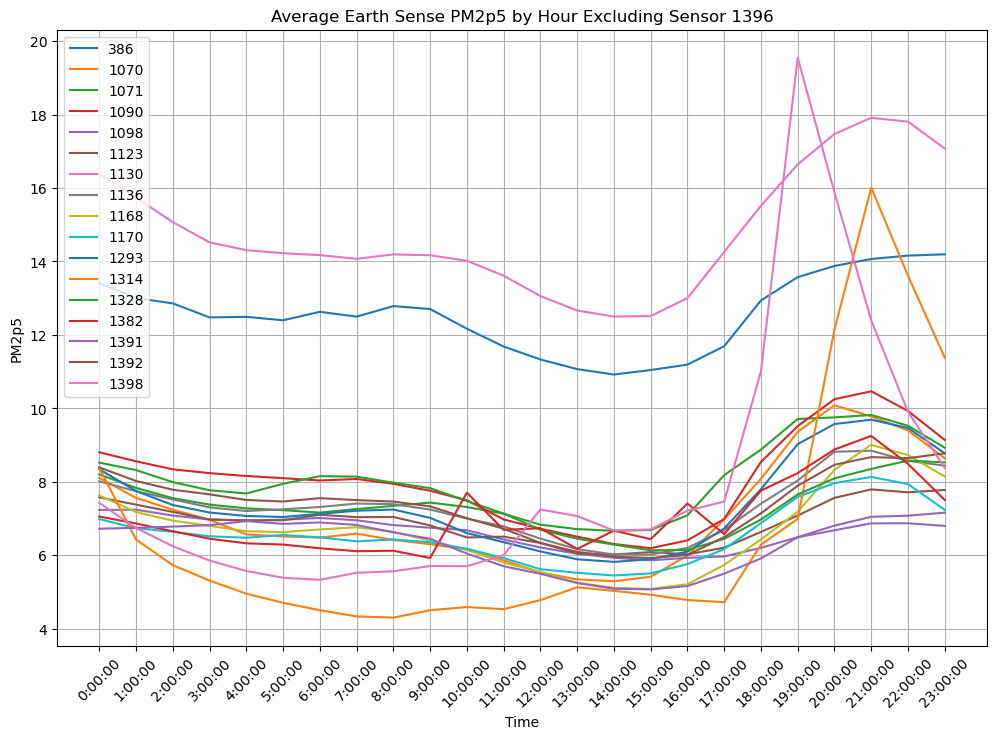

In [15]:
# Plot to show the average reading by time of day

# This data was calculated in Excel and coppied over
data = {
    386: [13.41301255, 13.00150628, 12.85732218, 12.47481172, 12.49104603, 12.3974477, 12.62707113, 12.49715481, 12.78276151, 12.70317992, 12.16598326, 11.68205021, 11.32979079, 11.06766667, 10.91975, 11.04225, 11.18891667, 11.69175, 12.93725, 13.573125, 13.87641667, 14.0665, 14.15841667, 14.19372385],
    1070: [8.106071429, 7.560286396, 7.24071599, 6.964210526, 6.565861244, 6.510071942, 6.481151079, 6.586682692, 6.415710843, 6.29964455, 6.158824885, 5.860091954, 5.532614679, 5.340821918, 5.291853547, 5.413340961, 5.990781609, 6.975638051, 8.078306265, 9.359209302, 10.08177156, 9.77969555, 9.398341232, 8.638309524],
    1071: [8.199458824, 7.832023529, 7.552941176, 7.377623529, 7.275341176, 7.226211765, 7.1608, 7.256564706, 7.342141176, 7.433788235, 7.311576471, 7.128705882, 6.830823529, 6.711458824, 6.664470588, 6.686776471, 7.085788235, 8.180705882, 8.874729412, 9.710682353, 9.752141176, 9.818517647, 9.524447059, 8.9276],
    1090: [8.802254902, 8.55729064, 8.337901235, 8.234554455, 8.157736318, 8.098004988, 8.034189526, 8.075112219, 7.944175, 7.753876543, 7.496122931, 6.973100233, 6.720254042, 6.504153132, 6.304511628, 6.191465116, 6.402960373, 6.987777778, 8.540690476, 9.514128878, 10.24896635, 10.46331719, 9.926715328, 9.138536585],
    1098: [7.232015707, 7.239057592, 7.079633508, 6.970942408, 6.942225131, 6.967225131, 7.014225722, 6.950524934, 6.820682415, 6.748802083, 6.680520833, 6.42671875, 6.210755208, 6.039322917, 5.929298701, 5.861558442, 5.928935065, 5.965116883, 6.200859375, 6.490598958, 6.806145833, 7.044895833, 7.076770833, 7.158177083],
    1123: [7.575041096, 7.377123288, 7.178846154, 6.972802198, 6.949203297, 6.951785714, 7.101291209, 7.036253444, 7.039834254, 6.810381471, 6.483638814, 6.504959569, 6.333101604, 6.049171123, 6.018981233, 6.084986595, 6.023458445, 6.205281501, 6.634432432, 7.081226158, 7.561448087, 7.79204918, 7.712896175, 7.775616438],
    1130: [16.38574468, 15.73808057, 15.07087678, 14.51900474, 14.30677804, 14.22365155, 14.17121718, 14.07162291, 14.19122302, 14.16762353, 14.0169213, 13.61311778, 13.05546083, 12.66230415, 12.49909931, 12.51254042, 13.00240185, 14.25844548, 15.51713287, 16.64240654, 17.46960187, 17.91187354, 17.80561033, 17.07562353],
    1136: [8.011111111, 7.741725768, 7.517943262, 7.301489362, 7.203388626, 7.249928741, 7.312488152, 7.407030879, 7.389261905, 7.242529551, 6.99771028, 6.786162791, 6.45144186, 6.163781903, 6.019837963, 6.01855814, 6.198228438, 6.687470726, 7.404028103, 8.035469484, 8.816235294, 8.845294118, 8.568376471, 8.43787234],
    1168: [7.627751756, 7.174366197, 6.939929577, 6.800517647, 6.652541176, 6.628282353, 6.702169811, 6.759453682, 6.6385, 6.394504717, 6.144885321, 5.800297483, 5.543963554, 5.251571754, 5.111731207, 5.081070615, 5.20856492, 5.735802752, 6.428819444, 7.183125, 8.324570766, 9.005594406, 8.728111888, 8.142517483],
    1170: [6.983465116, 6.734918415, 6.636588785, 6.514379391, 6.47556338, 6.549764706, 6.485966981, 6.377028302, 6.426745283, 6.35212963, 6.174703196, 5.919840183, 5.618952164, 5.521298405, 5.447220957, 5.506241458, 5.758398169, 6.165091743, 6.873464203, 7.587598152, 7.963302326, 8.131302326, 7.937883721, 7.233976744],
    1293: [8.339548694, 7.746935867, 7.366674584, 7.161377672, 7.067703349, 7.039903614, 7.127142857, 7.210748792, 7.24326087, 7.016745843, 6.602079439, 6.353901869, 6.10255814, 5.888255814, 5.818321678, 5.890722611, 6.099042056, 6.728364486, 7.797441315, 9.025070423, 9.571482353, 9.690117925, 9.464704492, 8.774869359],
    1314: [8.378719512, 6.425337423, 5.729202454, 5.308527607, 4.952638037, 4.703680982, 4.501840491, 4.332822086, 4.3, 4.501890244, 4.588109756, 4.530182927, 4.777300613, 5.126708075, 5.029254658, 4.92308642, 4.779444444, 4.720613497, 6.28808642, 6.988231707, 12.14388889, 16.01147239, 13.61054878, 11.37902439],
    1328: [8.521635071, 8.317582938, 7.989170616, 7.768720379, 7.681312649, 7.943866348, 8.152139423, 8.139495192, 7.975917874, 7.825829384, 7.476121495, 7.134162791, 6.693457077, 6.449095128, 6.289489559, 6.134046512, 6.142116279, 6.444439252, 6.970327103, 7.653691589, 8.093231132, 8.350141844, 8.574539007, 8.528199052],
    1382: [7.053154206, 6.862716628, 6.651995305, 6.448896714, 6.323270588, 6.289388235, 6.1892, 6.108329412, 6.121741176, 5.923808411, 7.702767442, 6.690979021, 6.733240093, 6.171906977, 6.669211137, 6.435986079, 7.407006961, 6.574733179, 7.758813953, 8.236302326, 8.879160839, 9.247016317, 8.488228438, 7.50296729],
    1391: [6.721186869, 6.745714286, 6.777582697, 6.818820513, 6.927369792, 6.852454308, 6.891968504, 6.823412073, 6.621157895, 6.447885117, 6.044914425, 5.699761905, 5.492141176, 5.241662763, 5.08588785, 5.067488263, 5.159740566, 5.496650718, 5.912397094, 6.488762136, 6.678875306, 6.867616708, 6.869207921, 6.797293233],
    1392: [8.391162791, 8.020186047, 7.784209302, 7.656627907, 7.504232558, 7.463232558, 7.553116279, 7.500604651, 7.459465116, 7.330651163, 7.006418605, 6.71937355, 6.335684455, 6.089651972, 5.959837587, 5.924976852, 6.006226852, 6.493781903, 7.140278422, 7.892459397, 8.463201856, 8.671415313, 8.642018561, 8.775046512],
    1398: [7.425016611, 6.741229236, 6.243687708, 5.853754153, 5.570332226, 5.385083056, 5.330564784, 5.521362126, 5.562292359, 5.704883721, 5.699534884, 6.001727575, 7.244333333, 7.065366667, 6.670364238, 6.70192691, 7.214385382, 7.459635762, 11.00465347, 19.54956954, 15.87811258, 12.3939404, 9.907152318, 8.374385382]
}
# 1396: [163.9533688, 150.5800355, 119.6438652, 141.5417314, 150.610922, 155.2803534, 149.9910915, 156.8057951, 157.2821908, 118.1072085, 35.37730769, 14.62870748, 6.192094595, 6.025134228, 5.910668896, 5.739194631, 5.193120805, 11.5503367, 31.48431507, 57.26608247, 76.6919244, 122.3561458, 135.1154545, 156.9685563],
    
# Plotting
plt.figure(figsize=(12, 8))

for id, values in data.items():
    plt.plot(range(24), values, label=str(id))

plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.title('Average Earth Sense PM2p5 by Hour Excluding Sensor 1396')
plt.xticks(range(24), [f'{i}:00:00' for i in range(24)])
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


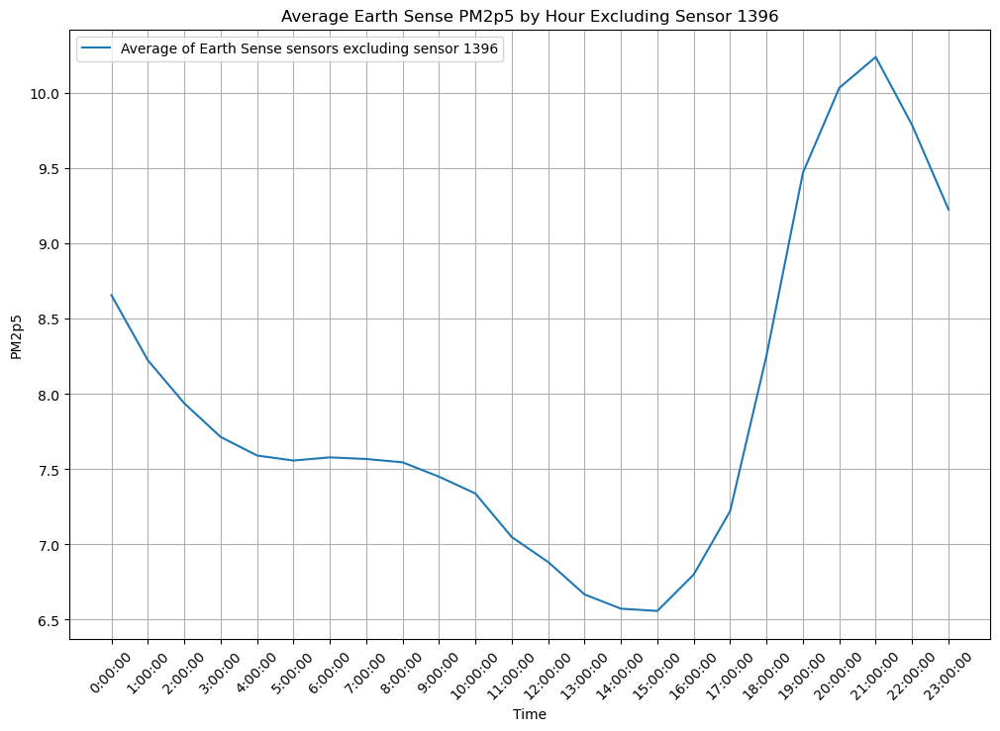

In [16]:
averages = [8.656844172, 8.224475359, 7.93854243, 7.714532995, 7.590973154, 7.5576461, 7.578620184, 7.567894289, 7.545580629, 7.450479654, 7.338284314, 7.048537322, 6.882698421, 6.667305776, 6.572301285, 6.557471874, 6.799788018, 7.221841152, 8.256571197, 9.471273938, 10.03579723, 10.24063298, 9.787880542, 9.226690517]
# Plotting
plt.figure(figsize=(12, 8))
plt.plot(range(24), averages, label='Average of Earth Sense sensors excluding sensor 1396')
plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.title('Average Earth Sense PM2p5 by Hour Excluding Sensor 1396')
plt.xticks(range(24), [f'{i}:00:00' for i in range(24)])
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


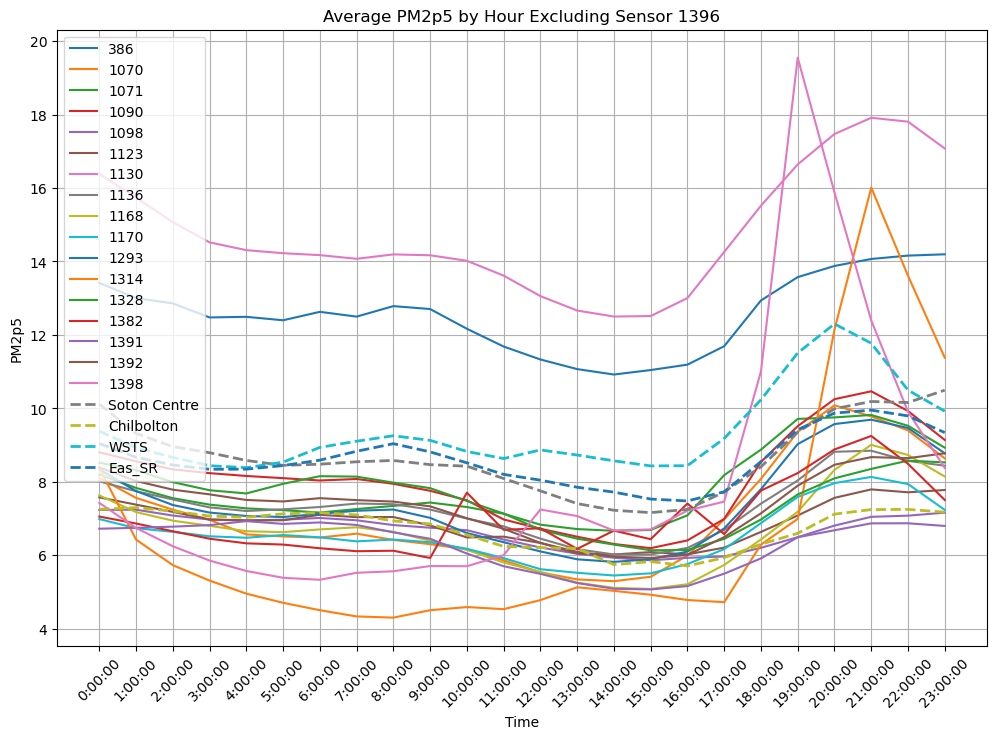

In [17]:
# Here we include the non EarthSense sensors as well 

new_data_2 = {
    "Soton Centre": [10.11666297, 9.317895787, 8.957332594, 8.790949002, 8.58032816, 8.445691796, 8.478425721, 8.543895787, 8.579509978, 8.466455556, 8.423399554, 8.089150224, 7.75144, 7.405866962, 7.223441242, 7.159643016, 7.247046667, 7.721498891, 8.407720621, 9.350161863, 9.988126386, 10.18587361, 10.15755654, 10.49298448],
    "Chilbolton": [7.248281501, 7.295378016, 7.200879357, 7.065957105, 7.032631016, 7.125842246, 7.158657754, 7.097425134, 6.934657754, 6.85172118, 6.554487871, 6.239072193, 6.204895442, 6.185687166, 5.743639037, 5.82636828, 5.708595174, 5.932654155, 6.298903485, 6.596549598, 7.11822252, 7.242343164, 7.24752815, 7.17080429],
    "WSTS": [9.376164384, 8.929041096, 8.663013699, 8.437087912, 8.383287671, 8.533424658, 8.936164384, 9.104109589, 9.252328767, 9.12739726, 8.824793388, 8.631955923, 8.86630137, 8.727945205, 8.570136986, 8.431232877, 8.437260274, 9.180547945, 10.23315068, 11.50794521, 12.29890411, 11.77205479, 10.49452055, 9.92109589],
    "Eas_SR": [9.041724138, 8.667820069, 8.456401384, 8.339930556, 8.343103448, 8.44083045, 8.588235294, 8.830103806, 9.036805556, 8.813541667, 8.514982578, 8.201048951, 8.043205575, 7.85087108, 7.717586207, 7.52862069, 7.47716263, 7.727241379, 8.548788927, 9.419723183, 9.869444444, 9.95017301, 9.793425606, 9.338541667]

}

# Plotting
plt.figure(figsize=(12, 8))

for id, values in data.items():
    plt.plot(range(24), values, label=str(id))

# Plot the new data
for id, values in new_data_2.items():
    plt.plot(range(24), values, label=id, linestyle='--', linewidth=2)

plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.title('Average PM2p5 by Hour Excluding Sensor 1396')
plt.xticks(range(24), [f'{i}:00:00' for i in range(24)])
plt.xticks(rotation=45)
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


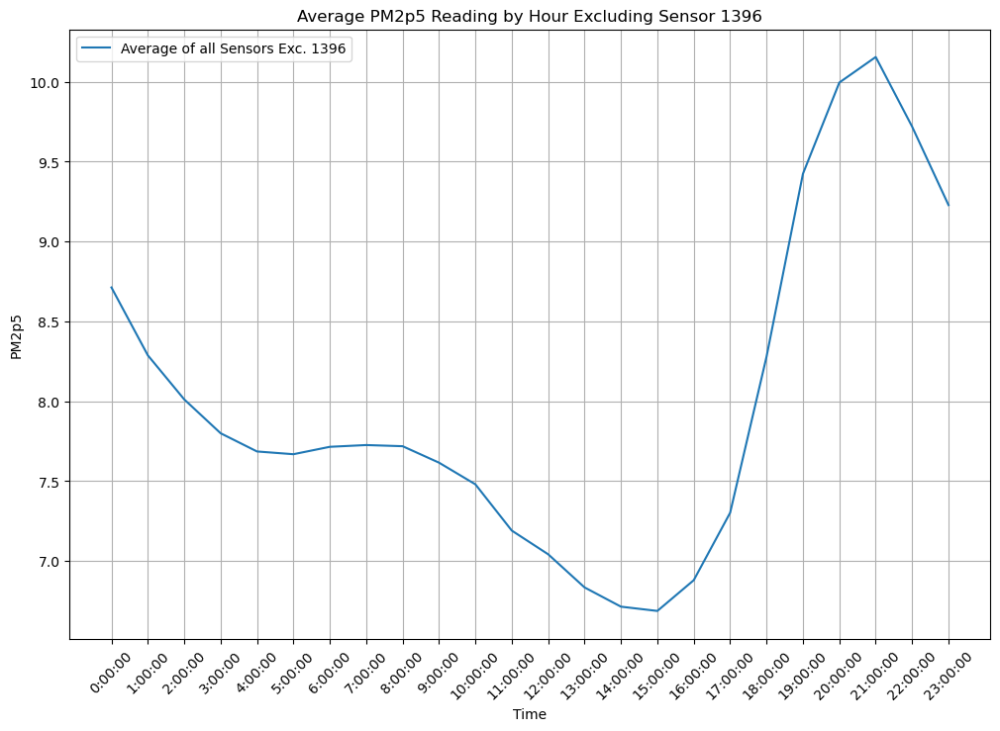

In [18]:
averages = [8.711865901, 8.28696267, 8.011088017, 7.799094547, 7.685042567, 7.667893945, 7.714191728, 7.725225582, 7.718008226, 7.615108085, 7.479452225, 7.189826751, 7.041510264, 6.834027076, 6.713520253, 6.68680413, 6.879355289, 7.301582951, 8.27858448, 9.423144609, 9.994440493, 10.15434311, 9.718428575, 9.227484053]
plt.figure(figsize=(12, 8))
plt.plot(range(24), averages, label="Average of all Sensors Exc. 1396")
plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.title('Average PM2p5 Reading by Hour Excluding Sensor 1396')
plt.xticks(range(24), [f'{i}:00:00' for i in range(24)])
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

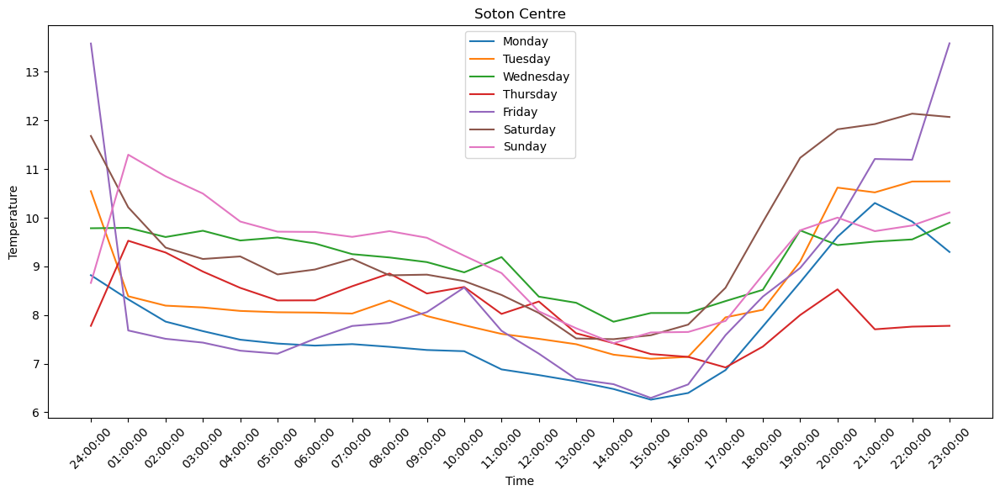

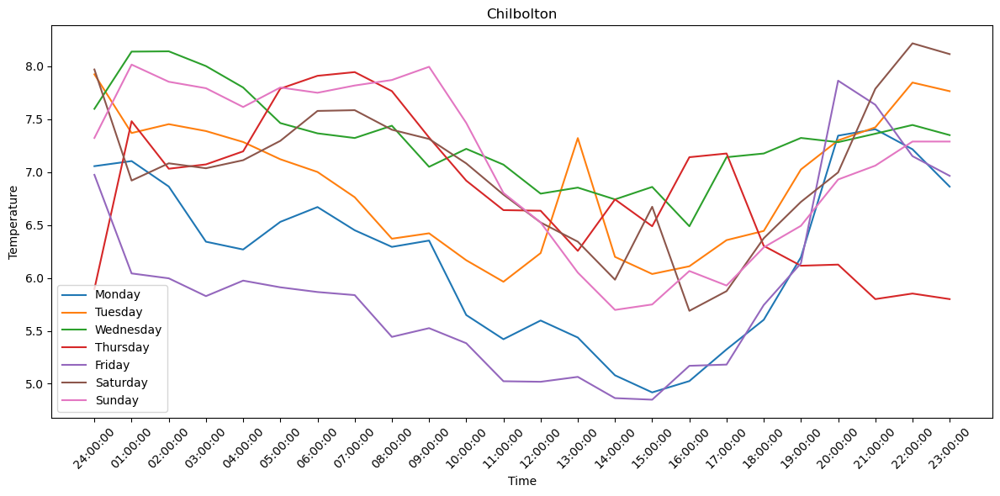

In [19]:

# Data
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
times = ['24:00:00', '01:00:00', '02:00:00', '03:00:00', '04:00:00', '05:00:00', '06:00:00', '07:00:00', '08:00:00', '09:00:00', '10:00:00', '11:00:00', '12:00:00', '13:00:00', '14:00:00', '15:00:00', '16:00:00', '17:00:00', '18:00:00', '19:00:00', '20:00:00', '21:00:00', '22:00:00', '23:00:00']
soton_centre = [
    [8.819, 10.54613846, 9.784421875, 7.77865625, 13.58201563, 11.68160938, 8.661107692],
    [8.322907692, 8.386738462, 9.792640625, 9.5275625, 7.682875, 10.21492188, 11.2968],
    [7.865415385, 8.193830769, 9.60428125, 9.285875, 7.5118125, 9.387234375, 10.85226154],
    [7.669415385, 8.156369231, 9.733203125, 8.894125, 7.433671875, 9.152828125, 10.4978],
    [7.493892308, 8.084923077, 9.53278125, 8.55915625, 7.267484375, 9.205125, 9.922676923],
    [7.414107692, 8.057753846, 9.59465625, 8.300484375, 7.205515625, 8.835578125, 9.714107692],
    [7.371938462, 8.050830769, 9.471609375, 8.302640625, 7.51221875, 8.93615625, 9.708338462],
    [7.402415385, 8.031307692, 9.252, 8.59265625, 7.775578125, 9.155046875, 9.607492308],
    [7.346846154, 8.297246154, 9.1838125, 8.853984375, 7.838703125, 8.816703125, 9.725046154],
    [7.281661538, 7.979723077, 9.088703125, 8.443444444, 8.060140625, 8.83078125, 9.588953846],
    [7.256907692, 7.790338462, 8.877984375, 8.577213115, 8.56615625, 8.698109375, 9.219969231],
    [6.882830769, 7.612765625, 9.191322581, 8.023516129, 7.676234375, 8.413234375, 8.863292308],
    [6.76590625, 7.511261538, 8.37825, 8.278328125, 7.206328125, 8.0431875, 8.075507692],
    [6.637584615, 7.400646154, 8.252171875, 7.62603125, 6.6849375, 7.5185, 7.728246154],
    [6.479676923, 7.185492308, 7.86296875, 7.421921875, 6.57875, 7.50409375, 7.421921875],
    [6.260215385, 7.101676923, 8.04171875, 7.19821875, 6.29609375, 7.585140625, 7.641861538],
    [6.397738462, 7.140461538, 8.042428571, 7.14003125, 6.57396875, 7.803671875, 7.652061538],
    [6.868323077, 7.953184615, 8.287171875, 6.923, 7.586234375, 8.561015625, 7.878815385],
    [7.766, 8.108107692, 8.518625, 7.351875, 8.379328125, 9.91234375, 8.825938462],
    [8.674184615, 9.102046154, 9.7401875, 8.0004375, 8.967828125, 11.23275, 9.742015385],
    [9.609276923, 10.61944615, 9.43875, 8.528609375, 9.895375, 11.8183125, 10.00293846],
    [10.30338462, 10.52146154, 9.509578125, 7.707171875, 11.2084375, 11.92589063, 9.724676923],
    [9.921615385, 10.745, 9.554921875, 7.76209375, 11.19257813, 12.14, 9.841061538],
    [9.296830769, 10.74863077, 9.8971875, 7.77865625, 13.58609375, 12.07185938, 10.10889231]
]

chilbolton = [
    [7.05537037, 7.922796296, 7.596596154, 5.895358491, 6.973566038, 7.968603774, 7.321777778],
    [7.103381818, 7.368301887, 8.137226415, 7.479807692, 6.042188679, 6.919396226, 8.0145],
    [6.862854545, 7.451981481, 8.14, 7.031038462, 5.995867925, 7.082150943, 7.8525],
    [6.341740741, 7.386888889, 8.000641509, 7.071865385, 5.827679245, 7.035490566, 7.791425926],
    [6.268018182, 7.283462963, 7.798169811, 7.195211538, 5.974150943, 7.111603774, 7.614018519],
    [6.5292, 7.1205, 7.462245283, 7.787615385, 5.911, 7.294396226, 7.798351852],
    [6.668981818, 7.000333333, 7.365132075, 7.908711538, 5.866433962, 7.576981132, 7.748518519],
    [6.449872727, 6.761907407, 7.321188679, 7.943596154, 5.837433962, 7.584075472, 7.817055556],
    [6.292872727, 6.370074074, 7.437264151, 7.764, 5.442735849, 7.399415094, 7.86912963],
    [6.352545455, 6.421203704, 7.049173077, 7.325865385, 5.525132075, 7.312207547, 7.994],
    [5.649074074, 6.166611111, 7.218754717, 6.918313725, 5.382807692, 7.081301887, 7.463425926],
    [5.420709091, 5.963518519, 7.069584906, 6.640057692, 5.023849057, 6.786660377, 6.802148148],
    [5.5974, 6.234296296, 6.795679245, 6.634313725, 5.018735849, 6.523425926, 6.523425926],
    [5.436545455, 7.320481481, 6.852788462, 6.254924528, 5.065018868, 6.342150943, 6.049907407],
    [5.079745455, 6.198481481, 6.741288462, 6.741288462, 4.864245283, 5.983037736, 5.6975],
    [4.918351852, 6.036888889, 6.859173077, 6.48775, 4.84954717, 6.671867925, 5.749055556],
    [5.025388889, 6.109796296, 6.48775, 7.139961538, 5.169603774, 5.688830189, 6.064907407],
    [5.324537037, 6.356537037, 7.139961538, 7.174865385, 5.181150943, 5.874867925, 5.927666667],
    [5.604092593, 6.4435, 7.174865385, 6.302490566, 5.743584906, 6.374188679, 6.288037037],
    [6.195037037, 7.024018519, 7.321788462, 6.114735849, 6.137962264, 6.717754717, 6.491962963],
    [7.343185185, 7.298722222, 7.281826923, 6.125471698, 7.862698113, 6.996226415, 6.929166667],
    [7.404425926, 7.421851852, 7.361711538, 5.799584906, 7.635283019, 7.785773585, 7.060203704],
    [7.214814815, 7.845055556, 7.444269231, 5.852169811, 7.149792453, 8.215566038, 7.287740741],
    [6.861981481, 7.763425926, 7.348576923, 5.799584906, 6.963830189, 8.113698113, 7.287740741]
]


# Transpose the data
soton_centre_transposed = list(map(list, zip(*soton_centre)))
chilbolton_transposed = list(map(list, zip(*chilbolton)))

# Plot for Soton Centre
plt.figure(figsize=(12, 6))
for i, day in enumerate(days):
    plt.plot(times, soton_centre_transposed[i], label=day)
plt.title('Soton Centre')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Plot for Chilbolton
plt.figure(figsize=(12, 6))
for i, day in enumerate(days):
    plt.plot(times, chilbolton_transposed[i], label=day)
plt.title('Chilbolton')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()



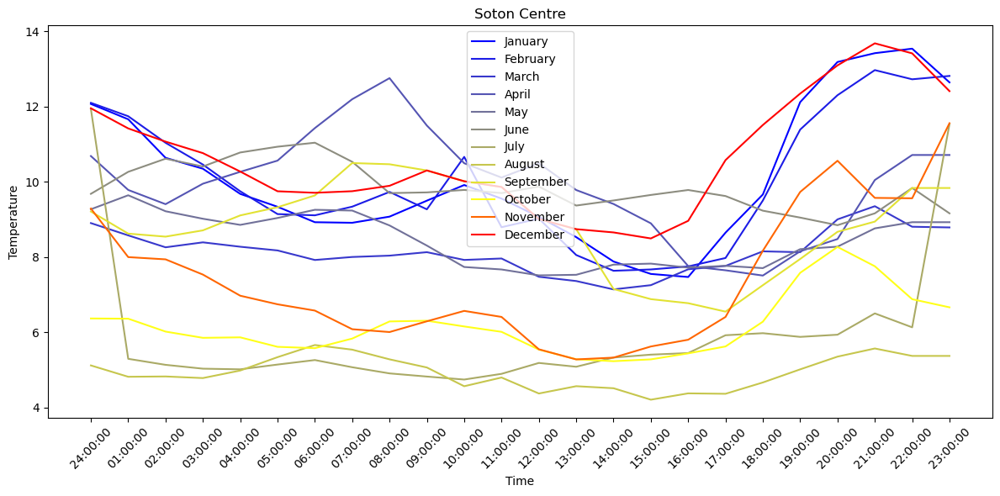

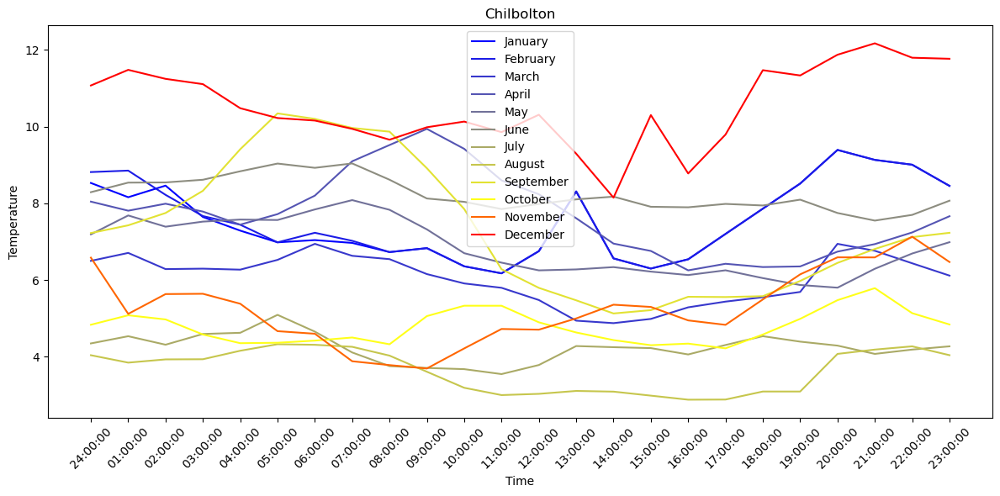

In [20]:


# Labels for the months
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Hours
times = [
    '24:00:00', '01:00:00', '02:00:00', '03:00:00', '04:00:00', '05:00:00', '06:00:00', '07:00:00',
    '08:00:00', '09:00:00', '10:00:00', '11:00:00', '12:00:00', '13:00:00', '14:00:00', '15:00:00',
    '16:00:00', '17:00:00', '18:00:00', '19:00:00', '20:00:00', '21:00:00', '22:00:00', '23:00:00'
]

soton_centre_data = [
    [12.06833871, 12.09814583, 8.902935484, 10.68403333, 9.270451613, 9.6808, 11.93241935, 5.121806452, 9.209933333, 6.369419355, 9.289029412, 11.95304839],
    [11.66090323, 11.74189583, 8.576548387, 9.7839, 9.642419355, 10.26496667, 5.297451613, 4.820580645, 8.623433333, 6.363322581, 7.999441176, 11.41812903],
    [10.63762903, 11.03635417, 8.260064516, 9.4057, 9.217935484, 10.61393333, 5.137741935, 4.828774194, 8.5433, 6.021, 7.939823529, 11.06783871],
    [10.34767742, 10.45839583, 8.391677419, 9.949666667, 9.018548387, 10.4064, 5.035774194, 4.786193548, 8.7099, 5.855193548, 7.535470588, 10.76233871],
    [9.678935484, 9.748479167, 8.275258065, 10.26496667, 8.855774194, 10.7791, 5.018258065, 4.986322581, 9.106933333, 5.868129032, 6.974235294, 10.27317742],
    [9.336967742, 9.142708333, 8.176451613, 10.56293333, 9.039129032, 10.93246667, 5.145322581, 5.341645161, 9.324666667, 5.616258065, 6.745941176, 9.748677419],
    [8.926596774, 9.109708333, 7.92316129, 11.4269, 9.256709677, 11.0386, 5.26483871, 5.66416129, 9.6376, 5.580516129, 6.578882353, 9.708209677],
    [8.91166129, 9.3396875, 8.003, 12.1942, 9.236129032, 10.53153333, 5.073870968, 5.540870968, 10.4985, 5.835354839, 6.084352941, 9.750129032],
    [9.074887097, 9.7313125, 8.038645161, 12.75396667, 8.840580645, 9.6997, 4.910322581, 5.283806452, 10.46626667, 6.290354839, 6.008676471, 9.894274194],
    [9.499064516, 9.269, 8.130709677, 11.49453333, 8.305774194, 9.718666667, 4.826354839, 5.06716129, 10.30169355, 6.309387097, 6.294382353, 10.30169355],
    [9.914854839, 10.66239583, 7.924645161, 10.49366667, 7.736677419, 9.783833333, 4.746966667, 4.569275862, 10.01480645, 6.157258065, 6.570558824, 10.01480645],
    [9.554580645, 8.793702128, 7.962612903, 10.11246667, 7.671258065, 9.700533333, 4.898666667, 4.800724138, 9.862065574, 6.014258065, 6.410352941, 9.862065574],
    [9.068016129, 9.02225, 7.477266667, 10.49366667, 7.514451613, 9.872733333, 5.187903226, 4.37616129, 9.012919355, 5.542451613, 5.550735294, 9.012919355],
    [8.530580645, 8.0553125, 7.363806452, 9.781466667, 7.529806452, 9.368733333, 5.086774194, 4.570193548, 8.742032258, 5.285967742, 5.281705882, 8.742032258],
    [7.88233871, 7.636625, 7.141709677, 9.411266667, 7.799741935, 9.503966667, 5.330935484, 4.516129032, 7.1526, 5.234419355, 5.329470588, 8.655290323],
    [7.552564516, 7.6715, 7.254354839, 8.897066667, 7.826451613, 9.6508, 5.408580645, 4.211806452, 6.8829, 5.282967742, 5.625147059, 8.495532258],
    [7.470967213, 7.752104167, 7.675677419, 7.761066667, 7.720032258, 9.7823, 5.450387097, 4.379967742, 6.7752, 5.44216129, 5.804647059, 8.963080645],
    [8.649241935, 7.9756875, 7.765548387, 7.649366667, 7.767709677, 9.6219, 5.923741935, 4.368548387, 6.551133333, 5.626064516, 6.409647059, 10.57596774],
    [9.662612903, 9.502875, 8.152806452, 7.5094, 7.706967742, 9.2327, 5.978419355, 4.669032258, 7.253166667, 6.283548387, 8.168705882, 11.50912903],
    [12.11703226, 11.38764583, 8.129903226, 8.153366667, 8.210580645, 9.049566667, 5.880225806, 5.017516129, 7.949733333, 7.58216129, 9.730235294, 12.34367742],
    [13.18324194, 12.30060417, 9.001967742, 8.479566667, 8.27683871, 8.847566667, 5.938096774, 5.355322581, 8.671433333, 8.269967742, 10.55911765, 13.09312903],
    [13.41720968, 12.967375, 9.351870968, 10.04726667, 8.763, 9.161966667, 6.504096774, 5.572193548, 8.942733333, 7.756451613, 9.572764706, 13.67898387],
    [13.53696774, 12.72360417, 8.806322581, 10.71226667, 8.927322581, 9.8357, 6.134354839, 5.374419355, 9.8357, 6.881548387, 9.562352941, 13.41225806],
    [12.64119355, 12.81254167, 8.788032258, 10.71226667, 8.927322581, 9.161966667, 11.53535484, 5.374419355, 9.8357, 6.665483871, 11.55679412, 12.40874194]
]

# Data for Chilbolton
chilbolton_data = [
    [8.529078947, 8.813916667, 6.498741935, 8.043166667, 7.189645161, 8.2893, 4.346419355, 4.039, 7.2241, 4.833387097, 6.582363636, 11.07129032],
    [8.158051282, 8.85187234, 6.706066667, 7.8067, 7.682612903, 8.5386, 4.534387097, 3.84583871, 7.425366667, 5.080580645, 5.116583333, 11.47829032],
    [8.460263158, 8.219638298, 6.284258065, 7.988966667, 7.389741935, 8.544033333, 4.312967742, 3.930322581, 7.746866667, 4.971870968, 5.632833333, 11.24390323],
    [7.64274359, 7.66706383, 6.295548387, 7.783833333, 7.52216129, 8.613366667, 4.592935484, 3.934225806, 8.324766667, 4.579354839, 5.64075, 11.10613333],
    [7.287128205, 7.441382979, 6.269903226, 7.4434, 7.575354839, 8.834166667, 4.623419355, 4.155419355, 9.4082, 4.352548387, 5.381333333, 10.47858065],
    [6.981717949, 6.981717949, 6.524645161, 7.716966667, 7.563903226, 9.035533333, 5.091451613, 4.325967742, 10.34363333, 4.364064516, 4.666083333, 10.22216129],
    [7.040410256, 7.231042553, 6.942322581, 8.199766667, 7.839387097, 8.9245, 4.653806452, 4.310645161, 10.1996, 4.419580645, 4.599, 10.15680645],
    [6.966717949, 7.021702128, 6.630354839, 9.095133333, 8.082774194, 9.038566667, 4.110612903, 4.258225806, 9.963033333, 4.500935484, 3.881833333, 9.940677419],
    [6.72774359, 6.72774359, 6.543645161, 9.5189, 7.83016129, 8.614, 3.755354839, 4.028419355, 9.867233333, 4.324419355, 3.781416667, 9.657580645],
    [6.830487179, 6.830487179, 6.154193548, 9.939533333, 7.319741935, 8.125, 3.707387097, 3.608516129, 8.91437931, 5.058709677, 3.692916667, 9.981774194],
    [6.357076923, 6.357076923, 5.910032258, 9.41937931, 6.698935484, 8.037766667, 3.676166667, 3.190096774, 7.850733333, 5.329366667, 4.215833333, 10.13019355],
    [6.173846154, 6.173846154, 5.796516129, 8.597433333, 6.452297872, 7.8499, 3.547096774, 2.99983871, 6.2807, 5.328677419, 4.723, 9.854709677],
    [6.751974359, 6.751974359, 5.477774194, 8.235866667, 6.251021277, 7.981482759, 3.783774194, 3.03183871, 5.7948, 4.896516129, 4.705166667, 10.30816129],
    [8.308641026, 8.308641026, 4.93983871, 7.6101, 6.275935484, 8.102133333, 4.277935484, 3.10783871, 5.470166667, 4.631903226, 4.997909091, 9.293193548],
    [6.562717949, 6.562717949, 4.875225806, 6.948933333, 6.335967742, 8.172966667, 4.248354839, 3.089709677, 5.127433333, 4.433193548, 5.356, 8.146741935],
    [6.298447368, 6.298447368, 4.985516129, 6.757233333, 6.218806452, 7.908866667, 4.224709677, 2.985387097, 5.213966667, 4.299967742, 5.297909091, 10.29873333],
    [6.539868421, 6.539868421, 5.287548387, 6.2517, 6.129064516, 7.895466667, 4.058935484, 2.879677419, 5.562133333, 4.34116129, 4.946454545, 8.777419355],
    [7.200736842, 7.200736842, 5.436806452, 6.423066667, 6.253, 7.983566667, 4.305354839, 2.883451613, 5.555733333, 4.218709677, 4.830727273, 9.791612903],
    [7.859421053, 7.859421053, 5.55083871, 6.337333333, 6.049193548, 7.9426, 4.535193548, 3.092677419, 5.577833333, 4.577774194, 5.493272727, 11.46983871],
    [8.514236842, 8.514236842, 5.688548387, 6.3538, 5.869709677, 8.094433333, 4.392870968, 3.092677419, 5.974933333, 4.987096774, 6.147, 11.33229032],
    [9.390605263, 9.390605263, 6.942322581, 6.739666667, 5.799612903, 7.746833333, 4.289451613, 4.073322581, 6.4457, 5.474, 6.590909091, 11.87241935],
    [9.131105263, 9.131105263, 6.762096774, 6.9356, 6.292709677, 7.548666667, 4.073322581, 4.185935484, 6.808266667, 5.787516129, 6.588909091, 12.17016129],
    [9.005684211, 9.005684211, 6.435645161, 7.2398, 6.690483871, 7.697366667, 4.185935484, 4.270451613, 7.117966667, 5.135354839, 7.129090909, 11.79477419],
    [8.453368421, 8.453368421, 6.114645161, 7.6628, 6.985645161, 8.067666667, 4.270451613, 4.03983871, 7.230366667, 4.840290323, 6.468818182, 11.76745161]
]

# Transpose the data
soton_centre_transposed = list(map(list, zip(*soton_centre_data)))
chilbolton_transposed = list(map(list, zip(*chilbolton_data)))

color_list = ['#0000FF', '#1C1CE6', '#3838CC', '#5555B3', '#717199', '#8D8D80', '#AAAA66', '#C6C64D', '#E2E233', '#FFFF19', '#FF6600', '#FF0000']


# Plot for Soton Centre
plt.figure(figsize=(12, 6))
for i, month in enumerate(months):
    plt.plot(times, soton_centre_transposed[i], color = color_list[i], label=month)
plt.title('Soton Centre')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Plot for Chilbolton
plt.figure(figsize=(12, 6))
for i, month in enumerate(months):
    plt.plot(times, chilbolton_transposed[i], color = color_list[i], label=month)
plt.title('Chilbolton')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()



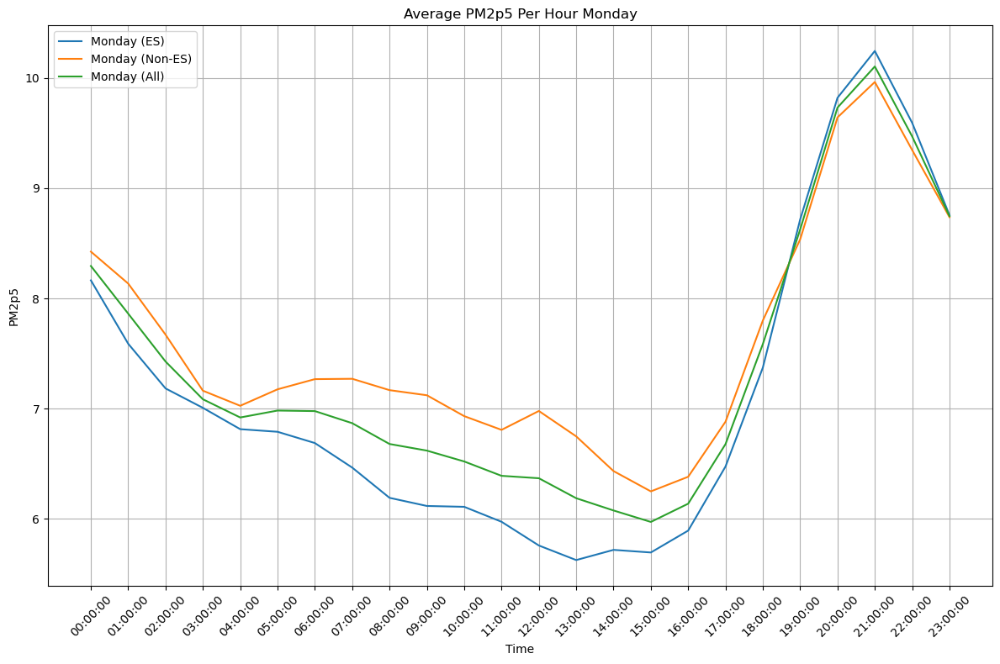

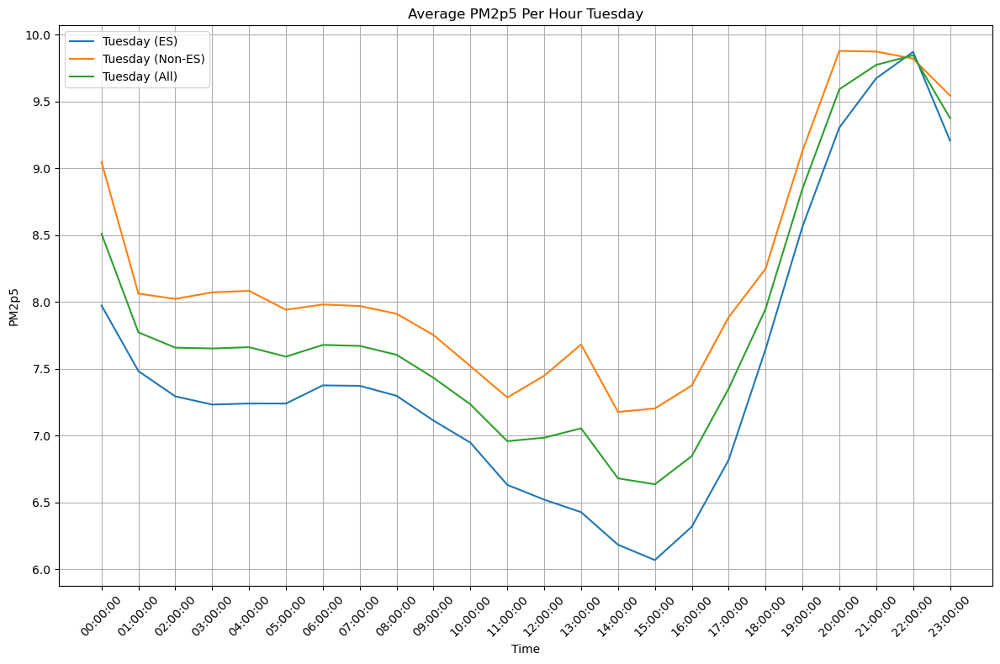

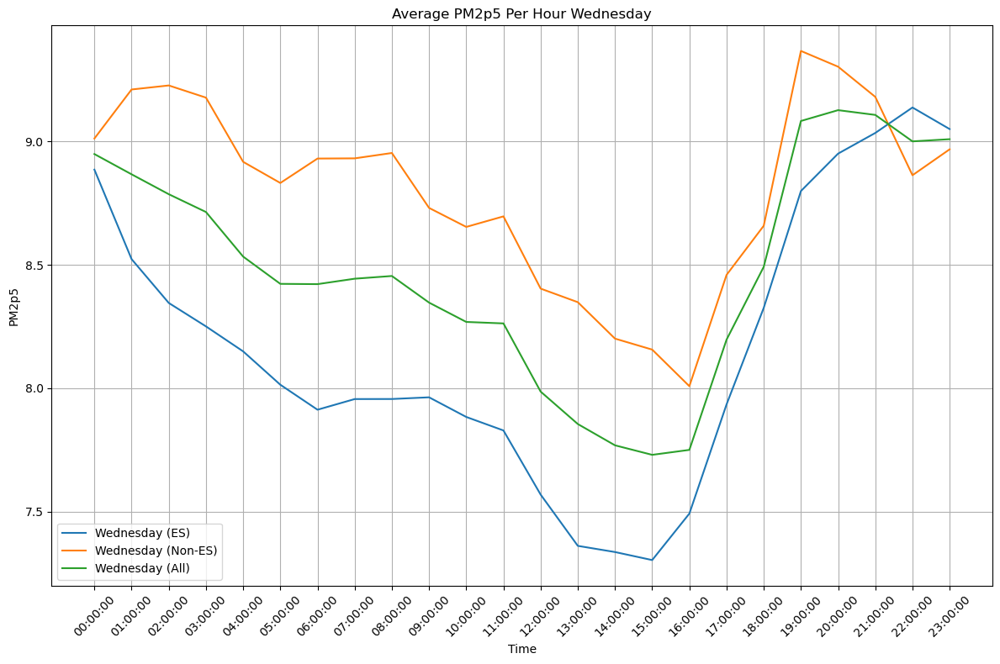

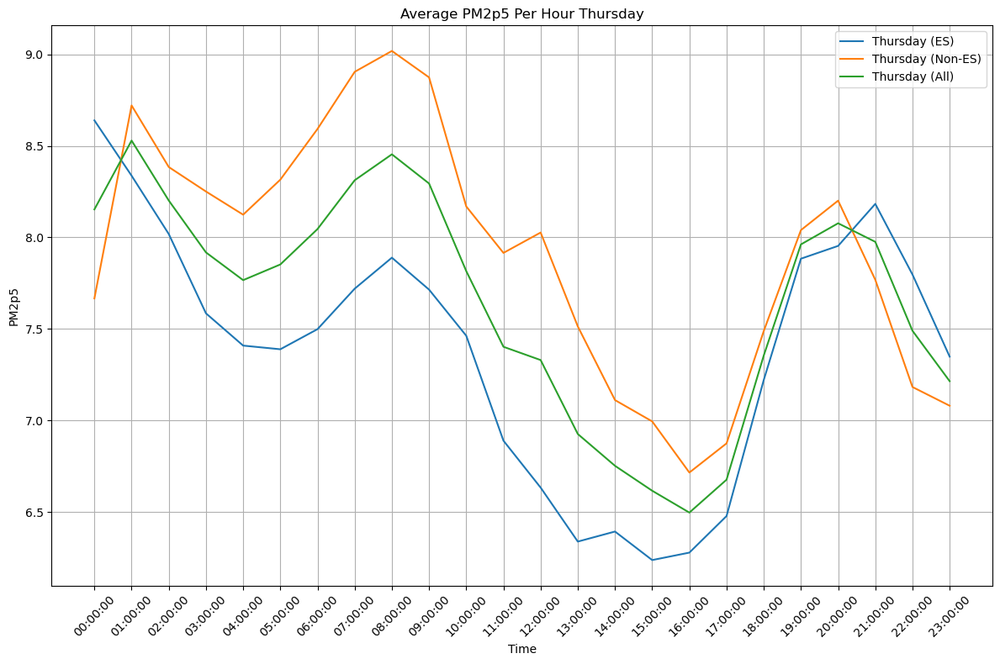

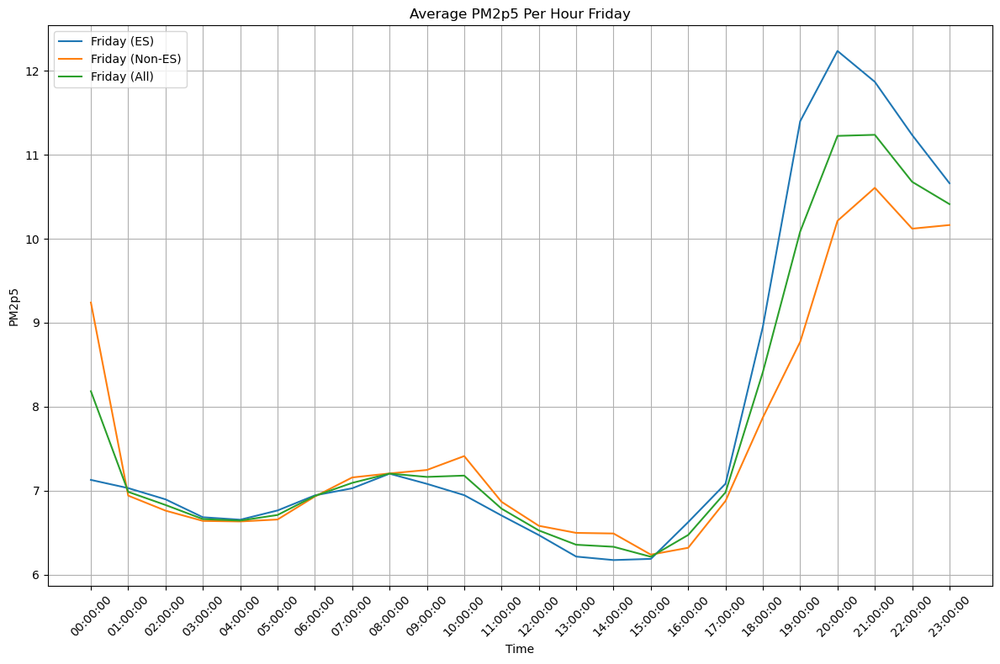

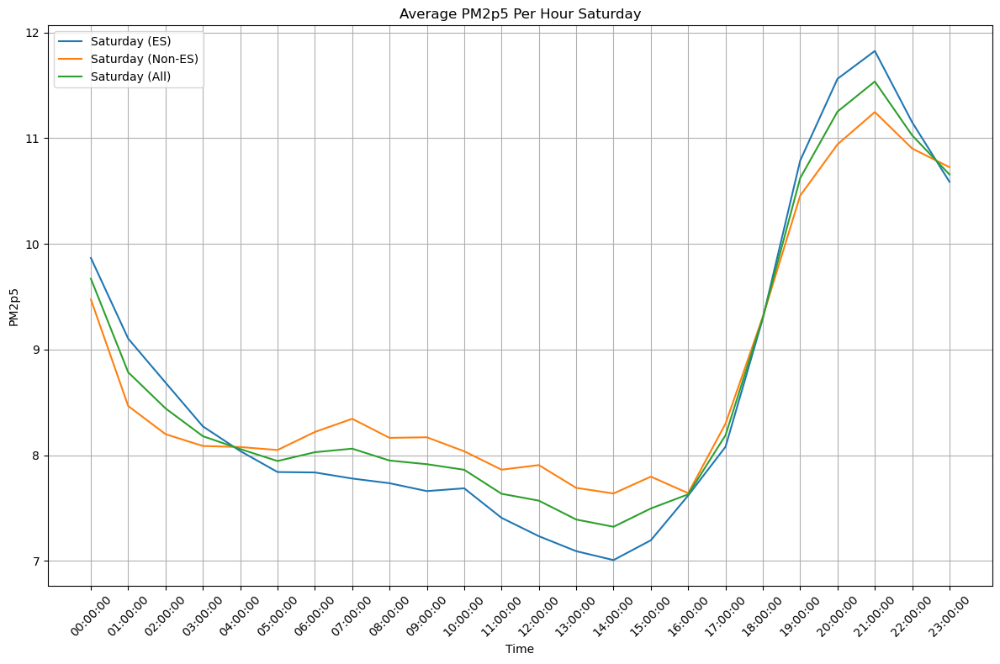

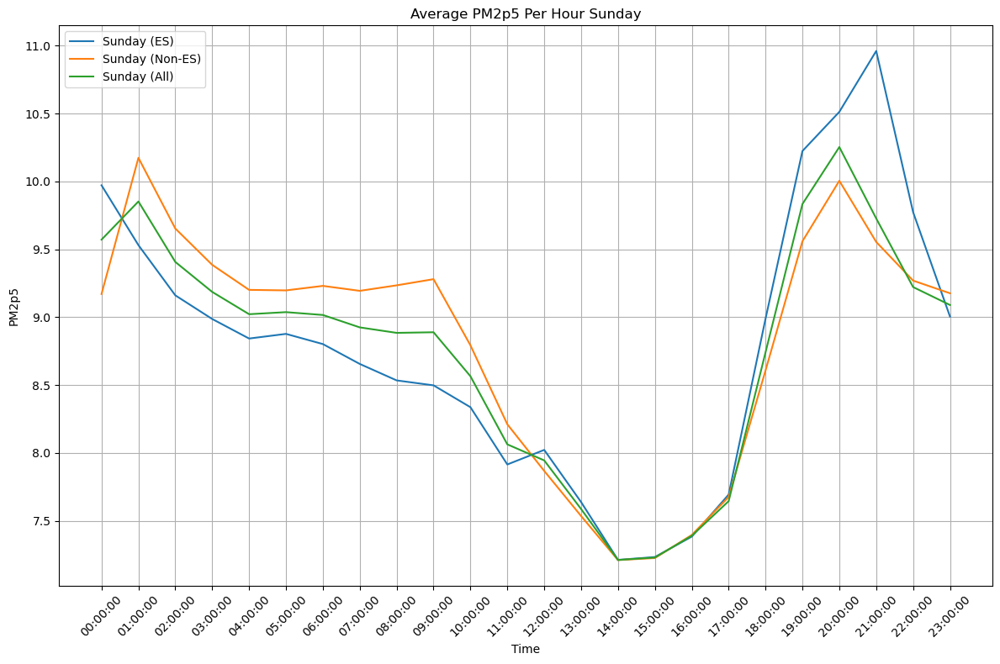

In [21]:


# Data
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
times = ['00:00:00', '01:00:00', '02:00:00', '03:00:00', '04:00:00', '05:00:00', '06:00:00', '07:00:00', '08:00:00', '09:00:00', '10:00:00', '11:00:00', '12:00:00', '13:00:00', '14:00:00', '15:00:00', '16:00:00', '17:00:00', '18:00:00', '19:00:00', '20:00:00', '21:00:00', '22:00:00', '23:00:00']
ave_es_data = [
    [8.163735887, 7.588327087, 7.182962212, 7.00681901, 6.813286138, 6.789600794, 6.687301392, 6.464672942, 6.190255682, 6.116473612, 6.108704897, 5.97297053, 5.757694791, 5.625510846, 5.717979732, 5.69434783, 5.892877632, 6.474335927, 7.371963301, 8.716523419, 9.820296239, 10.24525566, 9.592856499, 8.755000898],
    [7.973862503, 7.482765605, 7.293673323, 7.232521923, 7.240360152, 7.240188491, 7.376131835, 7.372799227, 7.297903363, 7.11244957, 6.947425745, 6.631534947, 6.521026865, 6.427521848, 6.183663298, 6.069066368, 6.318407948, 6.818718918, 7.646243329, 8.563614504, 9.304760406, 9.673766851, 9.870905685, 9.20745949],
    [8.886061941, 8.523254543, 8.345632086, 8.250702132, 8.1493836, 8.014188984, 7.912864245, 7.956081545, 7.956309934, 7.963180345, 7.88354049, 7.828819658, 7.568917706, 7.361047842, 7.336007331, 7.303449262, 7.491839823, 7.934405747, 8.325790539, 8.799360812, 8.950977332, 9.034763759, 9.137944287, 9.050430679],
    [8.639268846, 8.337138369, 8.018472038, 7.585413971, 7.409188149, 7.389148023, 7.499009254, 7.720121364, 7.889458818, 7.71491289, 7.462981166, 6.889961127, 6.633674869, 6.338740801, 6.393639352, 6.237800019, 6.278509856, 6.478331369, 7.221149635, 7.883807863, 7.953671335, 8.18323248, 7.797234896, 7.3489242],
    [7.127268117, 7.029461034, 6.895429027, 6.68231582, 6.652914766, 6.76313764, 6.94281586, 7.02727392, 7.201070512, 7.080420634, 6.945709559, 6.703090704, 6.469727053, 6.213690719, 6.172208971, 6.186312259, 6.623970642, 7.081830368, 8.951393055, 11.40023465, 12.23763879, 11.86956962, 11.2361305, 10.6615141],
    [9.866392505, 9.102777688, 8.686478221, 8.272372651, 8.039152114, 7.84042177, 7.836496634, 7.778973925, 7.7345683, 7.659995331, 7.686468162, 7.407018416, 7.23320278, 7.091458661, 7.007327026, 7.194492793, 7.618277274, 8.079308532, 9.294832081, 10.78752424, 11.56169457, 11.82531339, 11.15044706, 10.58676955],
    [9.971361094, 9.530455005, 9.160521303, 8.986220511, 8.842264494, 8.876531145, 8.801491657, 8.655142969, 8.533744173, 8.497376389, 8.33633761, 7.914416965, 8.021742108, 7.637462071, 7.211469556, 7.23248863, 7.383003385, 7.692633072, 8.989293244, 10.22367295, 10.5122347, 10.96100386, 9.773308483, 9.003839714]
]
ave_non_es_data = [
    [8.424149098, 8.134404196, 7.670801515, 7.162532811, 7.025444522, 7.174852564, 7.267325991, 7.270474242, 7.167345907, 7.121017716, 6.931641358, 6.806949184, 6.978313622, 6.748107459, 6.433108741, 6.248785233, 6.381266809, 6.881113628, 7.79916548, 8.535573884, 9.642327113, 9.963661206, 9.346117759, 8.736911776],
    [9.046055176, 8.062417296, 8.022802802, 8.071951425, 8.08337227, 7.94195, 7.981157265, 7.969693495, 7.911702896, 7.752552517, 7.519944729, 7.285363945, 7.448359022, 7.682042545, 7.177350237, 7.20307963, 7.375566714, 7.885932858, 8.248292308, 9.130002327, 9.878011254, 9.873892925, 9.820403134, 9.544083001],
    [9.01226242, 9.210917218, 9.227260417, 9.177948211, 8.917688815, 8.831947947, 8.93099715, 8.931768021, 8.953499909, 8.730894631, 8.653880979, 8.696584547, 8.403809748, 8.34876883, 8.201098558, 8.156547276, 8.008296703, 8.459364984, 8.658567308, 9.367133013, 9.303333333, 9.18097476, 8.863352163, 8.968459936],
    [7.666979272, 8.720886218, 8.384483974, 8.250842949, 8.12421234, 8.315584535, 8.592566106, 8.904552083, 9.018494792, 8.874064815, 8.169240654, 7.91547232, 8.026758234, 7.513844234, 7.111612807, 6.995175481, 6.71583613, 6.875203798, 7.488386732, 8.03991833, 8.20098687, 7.768626784, 7.183021491, 7.080716059],
    [9.240322093, 6.939764816, 6.761014248, 6.638661756, 6.63214767, 6.655344952, 6.929422699, 7.156420696, 7.204069402, 7.245411413, 7.411092556, 6.86636768, 6.580309786, 6.495979046, 6.488850992, 6.237008512, 6.318530585, 6.876468183, 7.870618446, 8.771481412, 10.21390899, 10.60736197, 10.12037353, 10.1637567],
    [9.473788998, 8.465125265, 8.198609209, 8.086971615, 8.07689036, 8.048773502, 8.219603486, 8.344290782, 8.16386633, 8.169297548, 8.036887087, 7.86276685, 7.906081976, 7.690569545, 7.637537418, 7.796727209, 7.640449406, 8.298018875, 9.309933887, 10.45577721, 10.94106425, 11.2471573, 10.90217586, 10.72547429],
    [9.170395786, 10.17357799, 9.652687808, 9.38524512, 9.200753826, 9.196920477, 9.230115849, 9.193648656, 9.234222117, 9.279695307, 8.792421027, 8.210649963, 7.866940137, 7.534698986, 7.210105515, 7.225117019, 7.395121724, 7.675273891, 8.607488688, 9.558967625, 10.00456963, 9.553741597, 9.268975207, 9.175764475]
]
ave_all_data = [
    [8.293942493, 7.861365641, 7.426881863, 7.08467591, 6.91936533, 6.982226679, 6.977313691, 6.867573592, 6.678800795, 6.618745664, 6.520173128, 6.389959857, 6.368004206, 6.186809153, 6.075544237, 5.971566531, 6.137072221, 6.677724777, 7.58556439, 8.626048651, 9.731311676, 10.10445844, 9.469487129, 8.745956337],
    [8.509958839, 7.77259145, 7.658238062, 7.652236674, 7.661866211, 7.591069245, 7.67864455, 7.671246361, 7.60480313, 7.432501043, 7.233685237, 6.958449446, 6.984692944, 7.054782196, 6.680506768, 6.636072999, 6.846987331, 7.352325888, 7.947267818, 8.846808415, 9.59138583, 9.773829888, 9.845654409, 9.375771245],
    [8.94916218, 8.867085881, 8.786446252, 8.714325172, 8.533536208, 8.423068465, 8.421930697, 8.443924783, 8.454904921, 8.347037488, 8.268710735, 8.262702103, 7.986363727, 7.854908336, 7.768552944, 7.729998269, 7.750068263, 8.196885365, 8.492178923, 9.083246912, 9.127155333, 9.107869259, 9.000648225, 9.009445307],
    [8.153124059, 8.529012293, 8.201478006, 7.91812846, 7.766700245, 7.852366279, 8.04578768, 8.312336724, 8.453976805, 8.294488852, 7.81611091, 7.402716723, 7.330216551, 6.926292517, 6.752626079, 6.61648775, 6.497172993, 6.676767583, 7.354768184, 7.961863096, 8.077329102, 7.975929632, 7.490128193, 7.214820129],
    [8.183795105, 6.984612925, 6.828221637, 6.660488788, 6.642531218, 6.709241296, 6.936119279, 7.091847308, 7.202569957, 7.162916023, 7.178401058, 6.784729192, 6.52501842, 6.354834883, 6.330529981, 6.211660386, 6.471250613, 6.979149275, 8.411005751, 10.08585803, 11.22577389, 11.23846579, 10.67825201, 10.4126354],
    [9.670090751, 8.783951476, 8.442543715, 8.179672133, 8.058021237, 7.944597636, 8.02805006, 8.061632354, 7.949217315, 7.914646439, 7.861677625, 7.634892633, 7.569642378, 7.391014103, 7.322432222, 7.495610001, 7.62936334, 8.188663704, 9.302382984, 10.62165073, 11.25137941, 11.53623535, 11.02631146, 10.65612192],
    [9.57087844, 9.852016496, 9.406604556, 9.185732815, 9.02150916, 9.036725811, 9.015803753, 8.924395812, 8.883983145, 8.888535848, 8.564379319, 8.062533464, 7.944341123, 7.586080528, 7.210787536, 7.228802825, 7.389062554, 7.644328114, 8.741391658, 9.83333256, 10.25309716, 9.726742713, 9.221426707, 9.089248595]
]


for i in range(len(days)):
    plt.figure(figsize=(12, 8))
    plt.plot(times, ave_es_data[i], label=f'{days[i]} (ES)')
    plt.plot(times, ave_non_es_data[i], label=f'{days[i]} (Non-ES)')
    plt.plot(times, ave_all_data[i], label=f'{days[i]} (All)')
    plt.title(f'Average PM2p5 Per Hour {days[i]}')
    plt.xlabel('Time')
    plt.ylabel('PM2p5')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()




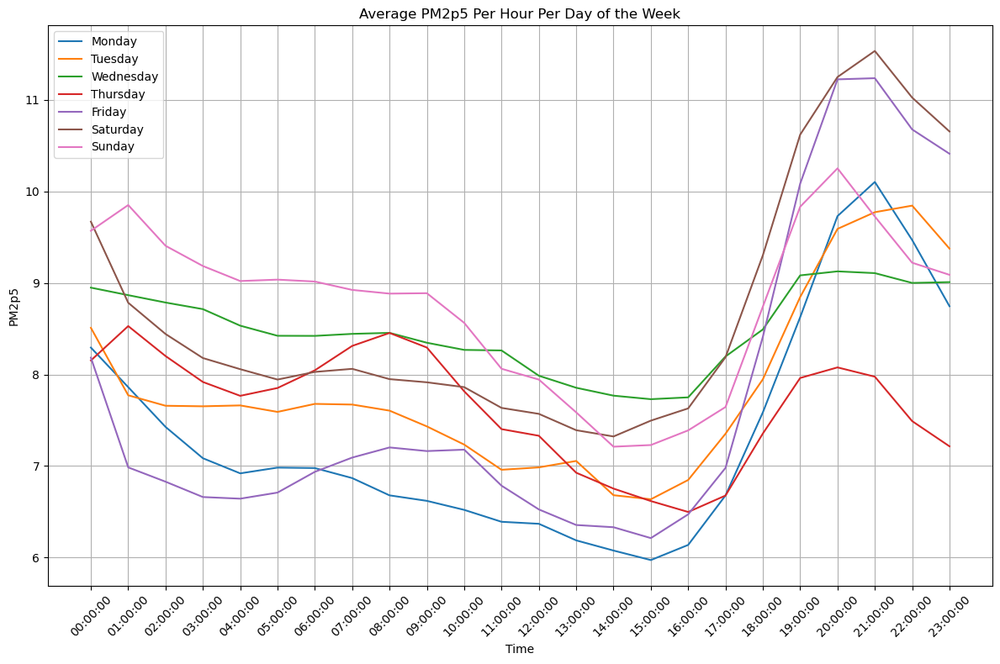

In [22]:
plt.figure(figsize=(12, 8))
for i in range(len(days)):
    plt.plot(times, ave_all_data[i], label=f'{days[i]}')
plt.title('Average PM2p5 Per Hour Per Day of the Week')
plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

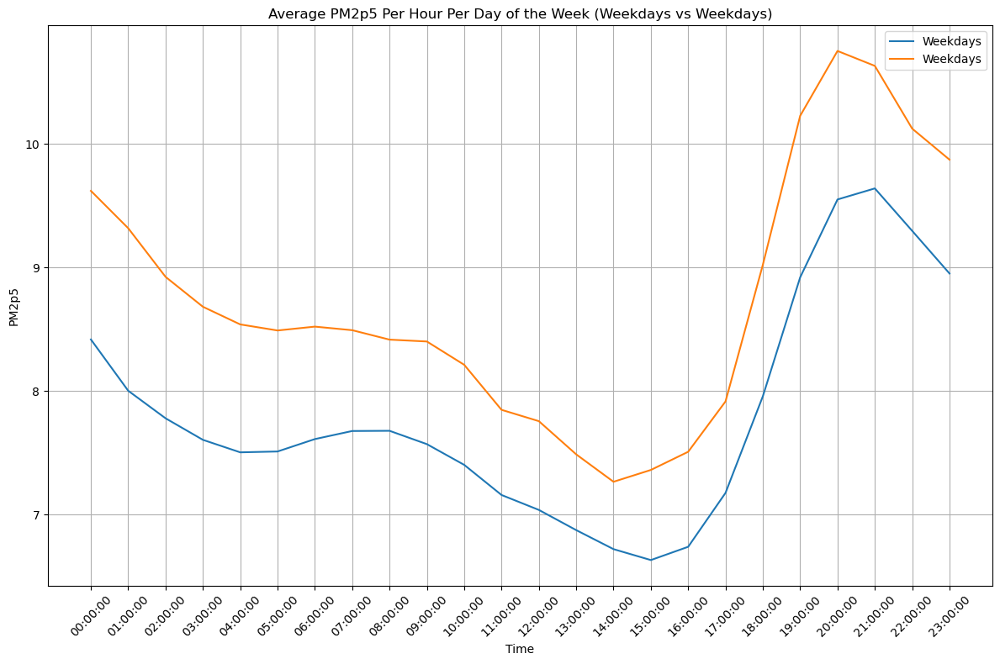

In [23]:
weekdays = []
weekends = []

for j in range(7):
    if j < 5:
        weekdays.append(ave_all_data[j])
    else: weekends.append(ave_all_data[j])

averages_weekdays = [sum(sublist) / len(sublist) for sublist in zip(*weekdays)]
averages_weekends = [sum(sublist) / len(sublist) for sublist in zip(*weekends)]

plt.figure(figsize=(12, 8))
plt.plot(times, averages_weekdays, label='Weekdays')
plt.plot(times, averages_weekends, label='Weekdays')
plt.title('Average PM2p5 Per Hour Per Day of the Week (Weekdays vs Weekdays)')
plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

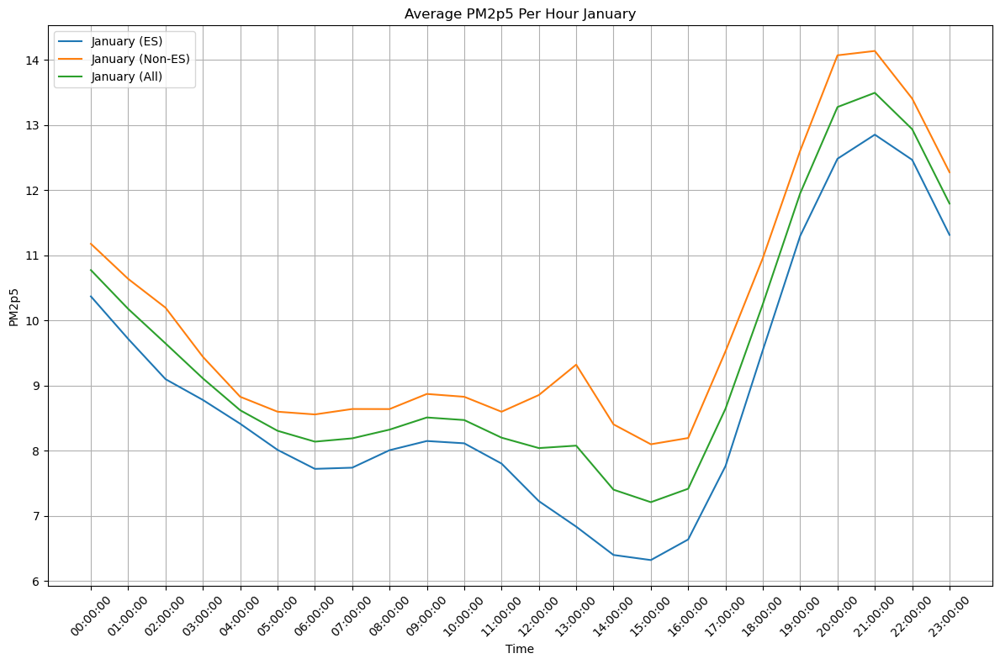

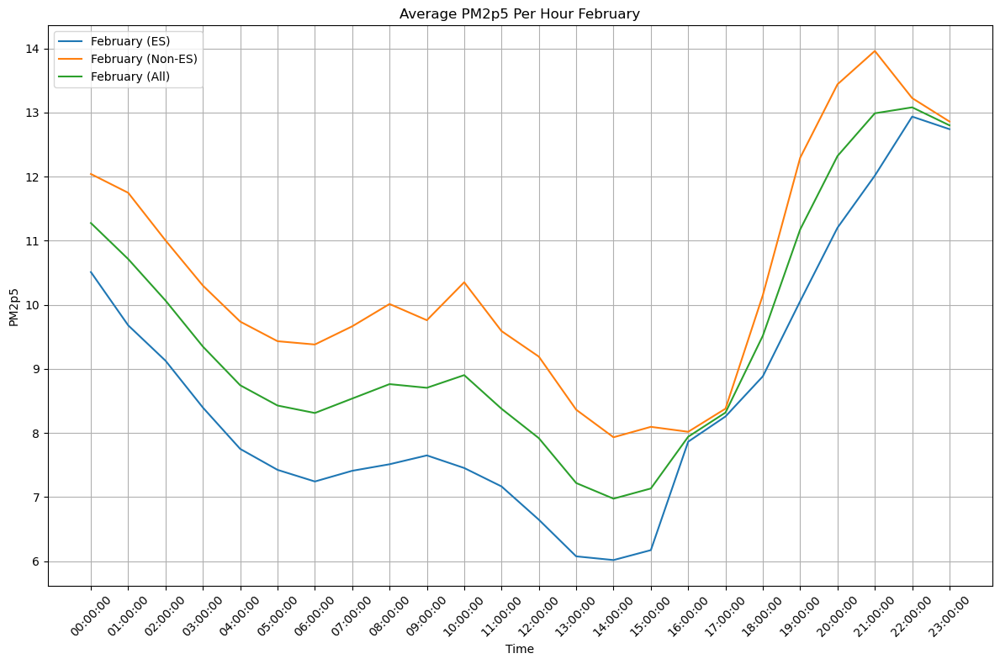

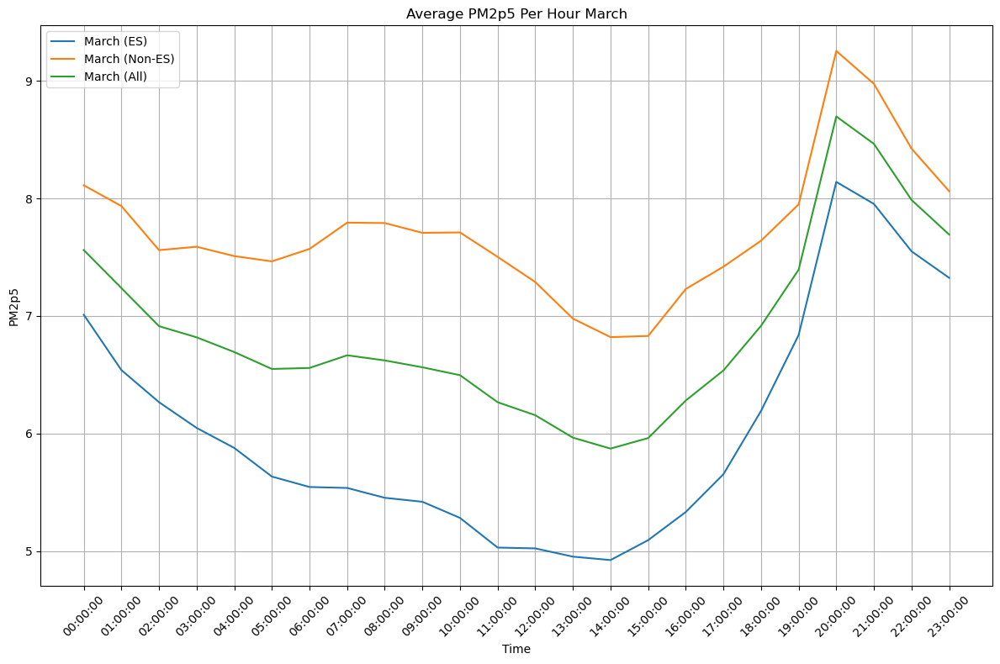

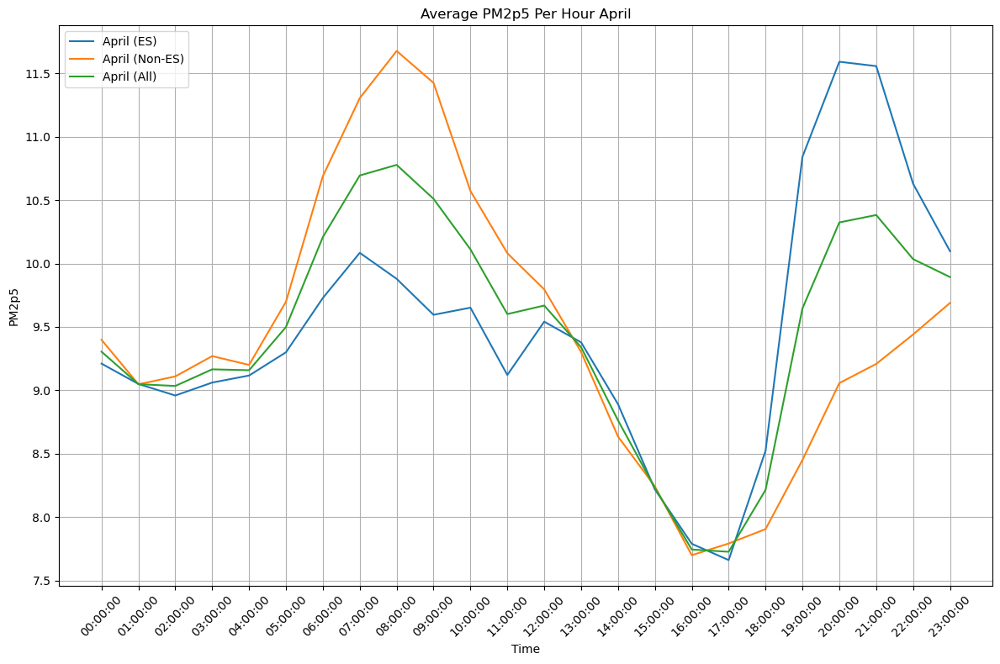

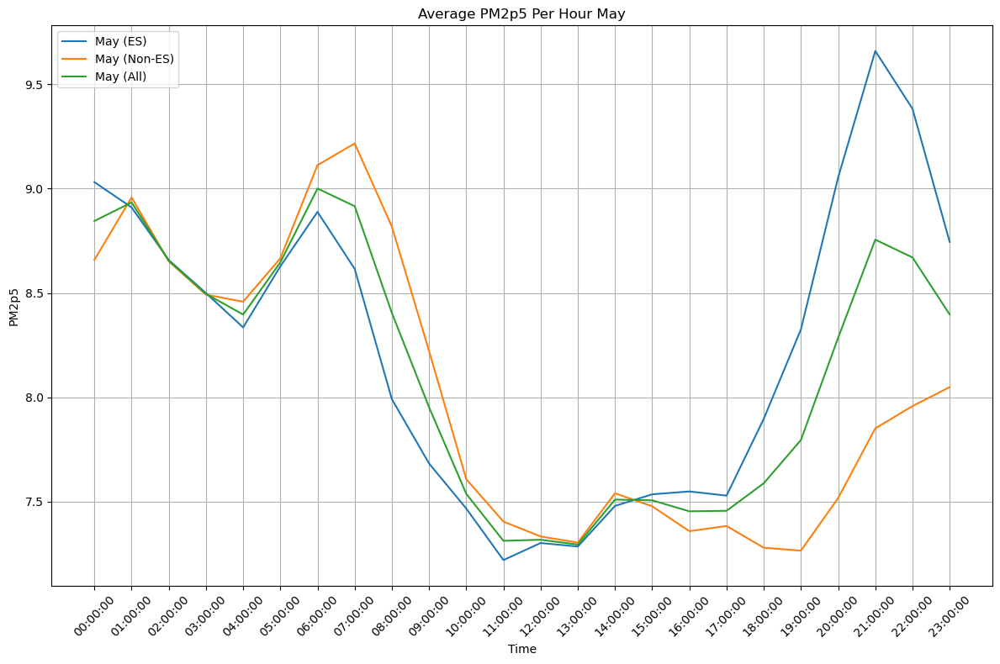

...

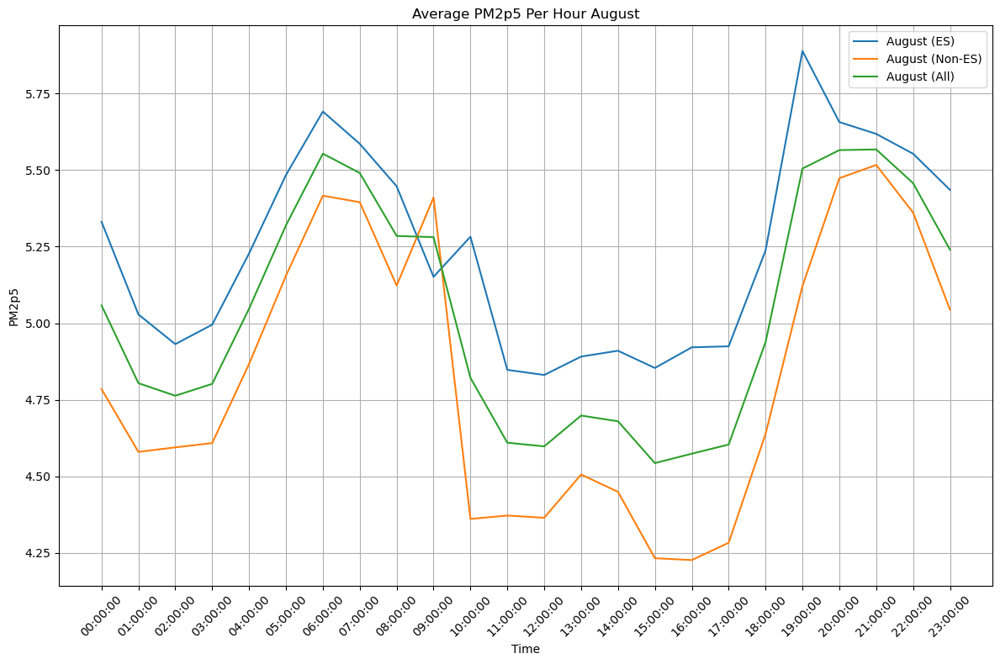

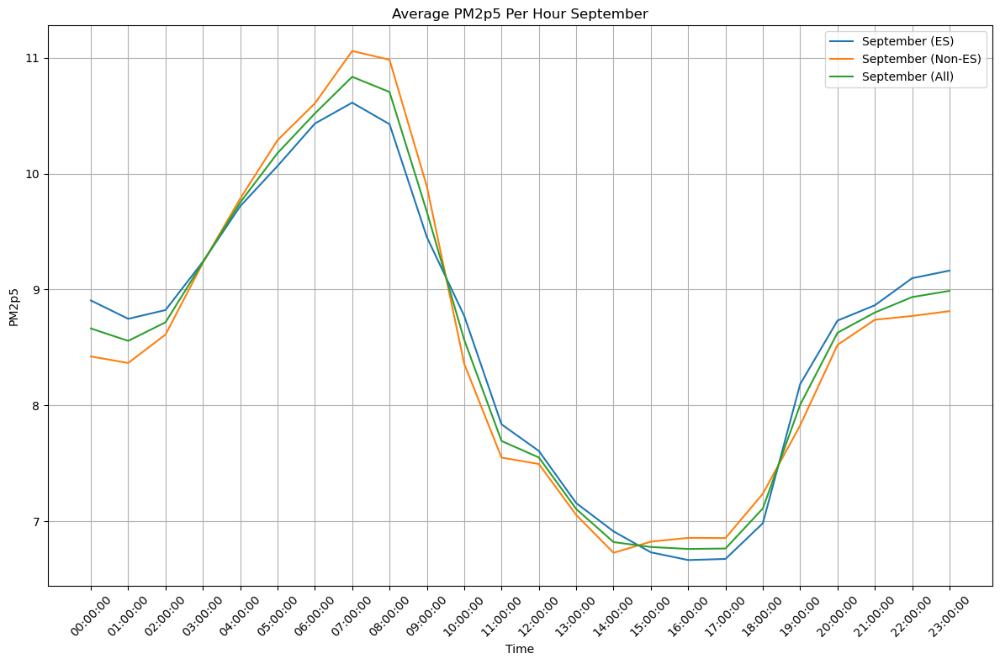

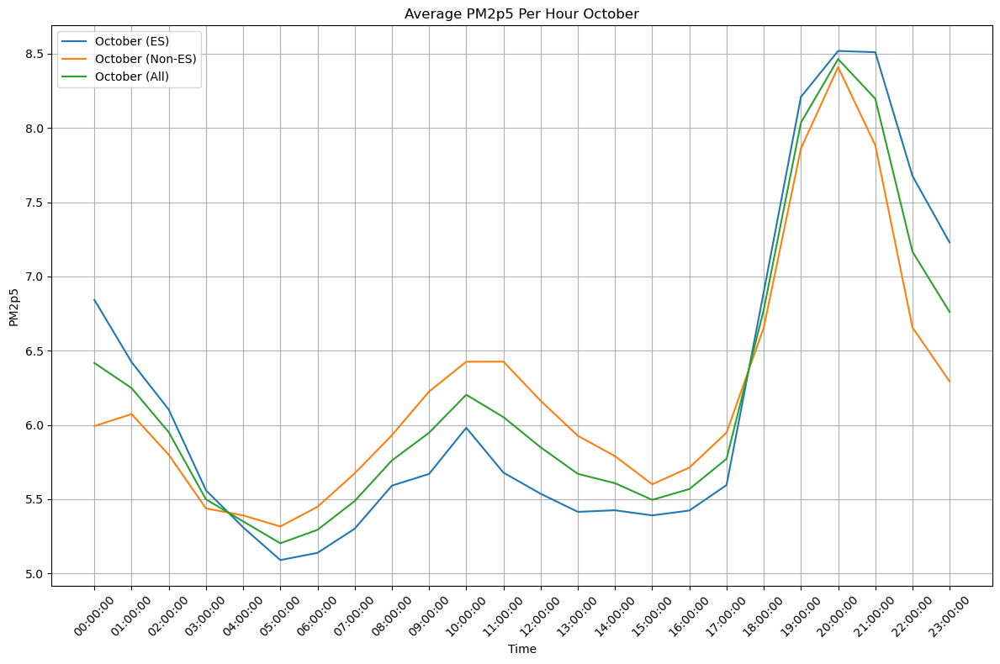

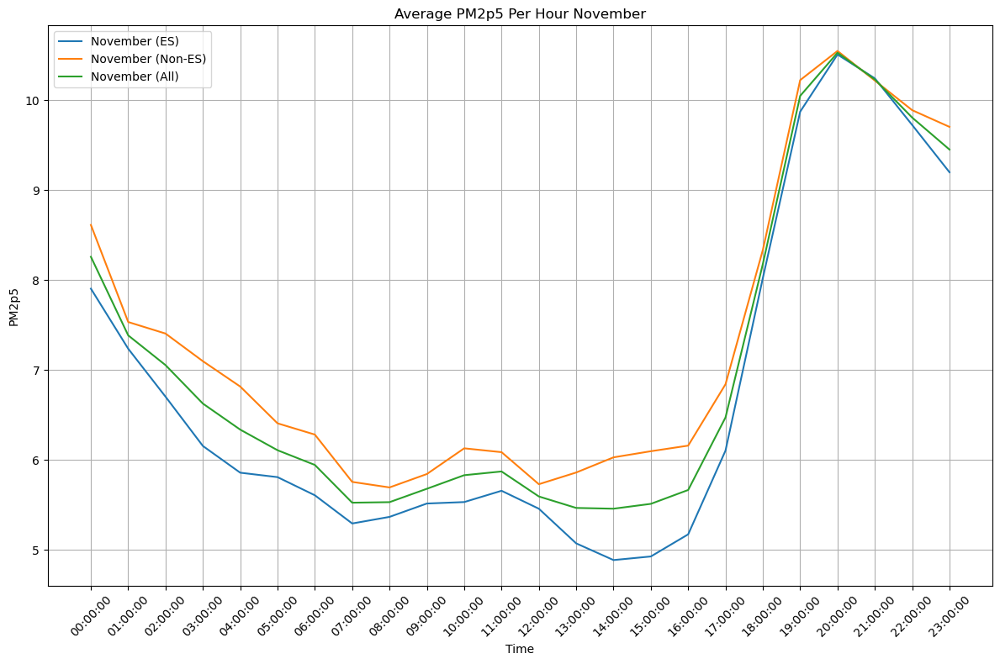

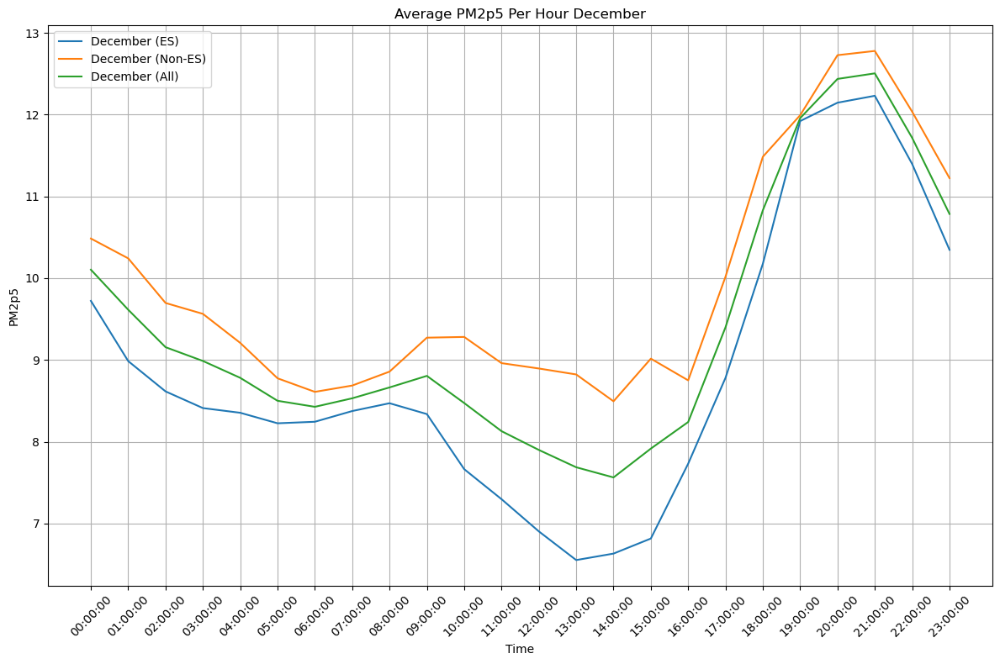

In [24]:
months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
times = ['00:00:00', '01:00:00', '02:00:00', '03:00:00', '04:00:00', '05:00:00', '06:00:00', '07:00:00', '08:00:00', '09:00:00', '10:00:00', '11:00:00', '12:00:00', '13:00:00', '14:00:00', '15:00:00', '16:00:00', '17:00:00', '18:00:00', '19:00:00', '20:00:00', '21:00:00', '22:00:00', '23:00:00']


ave_es_data = [
    [10.37040168, 9.717372514, 9.099958956, 8.78104511, 8.415738501, 8.015138409, 7.723588424, 7.741728835, 8.009796037, 8.151120587, 8.115838174, 7.804771169, 7.228281394, 6.836754507, 6.40205264, 6.323923839, 6.640117939, 7.766320454, 9.546113646, 11.29798968, 12.48289933, 12.85254338, 12.46629447, 11.31398723],
    [10.51153461, 9.680082217, 9.127988997, 8.397378959, 7.752121786, 7.425382138, 7.243850254, 7.410881418, 7.512888586, 7.650982159, 7.454492139, 7.166693164, 6.647452747, 6.075880586, 6.017814874, 6.172824148, 7.864892245, 8.258955132, 8.884941265, 10.05727213, 11.20391804, 12.01654257, 12.93750226, 12.74166013],
    [7.010677553, 6.539648118, 6.266469103, 6.047488446, 5.876910883, 5.633484378, 5.544723954, 5.536558865, 5.452807309, 5.418947677, 5.281469732, 5.028998791, 5.022257045, 4.951925861, 4.92282788, 5.09219424, 5.331866155, 5.652931956, 6.191963374, 6.838878752, 8.141525209, 7.953791949, 7.550423212, 7.324576691],
    [9.210125, 9.049666667, 8.958472222, 9.060673611, 9.116229167, 9.299673611, 9.728145833, 10.08434722, 9.879208333, 9.5953125, 9.6515, 9.1205625, 9.541131944, 9.378069444, 8.890455044, 8.217743421, 7.788663377, 7.660236842, 8.52277193, 10.84199781, 11.59189145, 11.55750658, 10.62923136, 10.09730811],
    [9.031293103, 8.90993465, 8.657708565, 8.499475806, 8.334880423, 8.62750139, 8.888578281, 8.615174499, 7.990801585, 7.682705784, 7.466962435, 7.219852382, 7.301607341, 7.284760225, 7.479275634, 7.534909274, 7.548691676, 7.52875288, 7.896701469, 8.325566676, 9.052929868, 9.659889833, 9.382894585, 8.744764545],
    [10.6860878, 10.92817857, 11.04586161, 10.87237054, 10.93247917, 11.14858036, 11.1867753, 10.72068899, 10.38452976, 10.24289583, 10.22374554, 10.17134821, 10.45258929, 10.40551079, 10.45652976, 10.48910863, 10.35568601, 10.32714397, 10.77912835, 10.89761793, 9.899027902, 9.628422247, 9.856874256, 10.15813095],
    [4.863886885, 4.672468166, 4.681716893, 4.511289261, 4.559868421, 4.649028014, 4.653564304, 4.596793294, 4.62349427, 4.812086163, 5.093377547, 5.056080221, 5.238053905, 5.308812606, 5.463915535, 5.575152801, 5.498053905, 5.423547326, 5.594810059, 5.592364177, 5.452219864, 5.297018251, 5.039997878, 5.115671689],
    [5.331270161, 5.028568548, 4.931572581, 4.995342742, 5.228064516, 5.484233871, 5.691330645, 5.585927419, 5.447217742, 5.151491935, 5.282520161, 4.847600806, 4.830887097, 4.890987903, 4.910040323, 4.85375, 4.921209677, 4.924455645, 5.237540323, 5.889254032, 5.657016129, 5.618326613, 5.553387097, 5.435584677],
    [8.905875, 8.7475, 8.823229167, 9.240604167, 9.7195, 10.06635417, 10.43264583, 10.61327083, 10.42714583, 9.452125, 8.773395833, 7.8365625, 7.606958333, 7.157083333, 6.9128125, 6.7320625, 6.6651875, 6.674833333, 6.983104167, 8.183791667, 8.732208333, 8.8643125, 9.098125, 9.163458333],
    [6.842052498, 6.423222644, 6.102975965, 5.559953194, 5.31014358, 5.089988615, 5.138394054, 5.301253637, 5.591021505, 5.669962049, 5.980920304, 5.678883618, 5.536635041, 5.414712207, 5.425268817, 5.390746363, 5.423598988, 5.59514864, 6.89542062, 8.208969007, 8.518355471, 8.509813409, 7.676492274, 7.227774465],
    [7.90412656, 7.236090909, 6.7025918, 6.154865142, 5.857837728, 5.808394001, 5.606567951, 5.293082058, 5.36652139, 5.514994652, 5.531261687, 5.656809499, 5.457198418, 5.071942291, 4.886301744, 4.926407308, 5.1723291, 6.10366934, 8.02230441, 9.872112184, 10.50752498, 10.24255437, 9.72430303, 9.19849481],
    [9.72242106, 8.985634046, 8.615472312, 8.4116427, 8.354198461, 8.225706439, 8.244306844, 8.375286801, 8.470888766, 8.338275174, 7.664724886, 7.297731607, 6.903820133, 6.553325108, 6.632541326, 6.816536908, 7.731857329, 8.781714475, 10.17607173, 11.9206831, 12.14532831, 12.22991063, 11.39556547, 10.34676764]
]

ave_non_es_data = [
    [11.17763384, 10.63857623, 10.19660922, 9.443043562, 8.830085746, 8.600852219, 8.558894817, 8.642255445, 8.641199476, 8.873291425, 8.829891232, 8.600335815, 8.856663496, 9.32275131, 8.406416736, 8.100874929, 8.197160265, 9.527949915, 10.95895756, 12.60558432, 14.07031466, 14.13707272, 13.40669044, 12.27614431],
    [12.04211607, 11.74851796, 11.00497368, 10.30074846, 9.73888262, 9.432879475, 9.381440772, 9.665106066, 10.01339241, 9.760578521, 10.35268868, 9.590928571, 9.192280902, 8.364117063, 7.933853175, 8.096816468, 8.01944246, 8.380588294, 10.15168353, 12.29560317, 13.44151488, 13.96201091, 13.22625, 12.86065278],
    [8.112387097, 7.935602867, 7.560473118, 7.589290323, 7.509677419, 7.46488172, 7.570752688, 7.794451613, 7.790870968, 7.707870968, 7.711021505, 7.503043011, 7.288777061, 6.97755914, 6.82016129, 6.829956989, 7.229677419, 7.419602151, 7.640462366, 7.950236559, 9.255623656, 8.97616129, 8.424741935, 8.061645161],
    [9.397955556, 9.046866667, 9.109333333, 9.2695, 9.200011111, 9.698855556, 10.68944444, 11.30477778, 11.67706667, 11.42524444, 10.57215493, 10.08146092, 9.795693744, 9.301566667, 8.634777778, 8.241411111, 7.6987, 7.790811111, 7.904466667, 8.449611111, 9.056411111, 9.207866667, 9.440133333, 9.688911111],
    [8.658741935, 8.957806452, 8.651483871, 8.492064516, 8.458225806, 8.666064516, 9.112677419, 9.216516129, 8.817666667, 8.221946237, 7.607569892, 7.404139785, 7.332946237, 7.303526882, 7.539860215, 7.477451613, 7.358301075, 7.383247312, 7.278935484, 7.265129032, 7.51683871, 7.851139785, 7.957612903, 8.048946237],
    [9.534477778, 9.784522222, 9.813766667, 9.751033333, 9.918311111, 10.11988889, 10.12936667, 9.965033333, 9.543455556, 9.300666667, 9.268311111, 9.339033333, 9.734738697, 9.312511111, 9.264533333, 9.156, 9.3037, 9.368488889, 9.427744444, 9.450711111, 9.0988, 8.785444444, 8.903866667, 9.1571],
    [7.232731183, 5.04072043, 4.913677419, 5.013333333, 5.135935484, 5.331612903, 5.333096774, 4.966643675, 4.744927703, 4.688666667, 4.611474552, 4.733953667, 5.215491389, 5.282860215, 5.392021505, 5.307870968, 5.193967742, 5.536043011, 5.891634409, 5.94855914, 5.858107527, 5.748924731, 5.351387097, 7.131505376],
    [4.784784946, 4.579666667, 4.594430108, 4.608419355, 4.867139785, 5.155333333, 5.416333333, 5.395397849, 5.122892473, 5.410709677, 4.360651094, 4.371692992, 4.364494624, 4.505580645, 4.449258065, 4.232397849, 4.226333333, 4.282924731, 4.638311828, 5.120967742, 5.473645161, 5.516870968, 5.361290323, 5.044],
    [8.422455556, 8.366266667, 8.612128385, 9.230928775, 9.7856, 10.28943333, 10.60684444, 11.0594, 10.98338889, 9.889670881, 8.359707663, 7.549615709, 7.4943, 7.054811111, 6.727888889, 6.823955556, 6.856888889, 6.855066667, 7.238111111, 7.827666667, 8.522377778, 8.739222222, 8.772088889, 8.813688889],
    [5.992333333, 6.072698925, 5.798698925, 5.437860215, 5.390763441, 5.316021505, 5.448956989, 5.673924731, 5.930731183, 6.224849462, 6.425649104, 6.426139785, 6.162451613, 5.926924731, 5.789741935, 5.600225806, 5.71272043, 5.948258065, 6.655387097, 7.861795699, 8.40927957, 7.882935484, 6.656172043, 6.292247312],
    [8.612686572, 7.533119281, 7.40477451, 7.097629085, 6.815745098, 6.406785948, 6.28151634, 5.755395425, 5.693919935, 5.842988562, 6.128797386, 6.086117647, 5.729745098, 5.859871658, 6.028490196, 6.096574272, 6.158700535, 6.841235888, 8.334548425, 10.22296732, 10.54723113, 10.21778015, 9.888814617, 9.702981878],
    [10.48445699, 10.24208602, 9.696655914, 9.563684229, 9.208650538, 8.775763441, 8.609844086, 8.686989247, 8.85733871, 9.272446237, 9.281397849, 8.960968094, 8.895467742, 8.822763441, 8.494494624, 9.015830466, 8.750596774, 10.01795699, 11.48411828, 11.99252688, 12.72641935, 12.77794086, 12.03513978, 11.22324731]
]

ave_all_data = [
    [10.77401776, 10.17797437, 9.648284091, 9.112044336, 8.622912123, 8.307995314, 8.14124162, 8.19199214, 8.325497756, 8.512206006, 8.472864703, 8.202553492, 8.042472445, 8.079752908, 7.404234688, 7.212399384, 7.418639102, 8.647135185, 10.2525356, 11.951787, 13.27660699, 13.49480805, 12.93649245, 11.79506577],
    [11.27682534, 10.71430009, 10.06648134, 9.349063709, 8.745502203, 8.429130807, 8.312645513, 8.537993742, 8.7631405, 8.70578034, 8.903590411, 8.378810868, 7.919866824, 7.219998825, 6.975834024, 7.134820308, 7.942167353, 8.319771713, 9.518312398, 11.17643765, 12.32271646, 12.98927674, 13.08187613, 12.80115645],
    [7.561532325, 7.237625493, 6.913471111, 6.818389384, 6.693294151, 6.549183049, 6.557738321, 6.665505239, 6.621839138, 6.563409322, 6.496245619, 6.266020901, 6.155517053, 5.9647425, 5.871494585, 5.961075614, 6.280771787, 6.536267053, 6.91621287, 7.394557656, 8.698574432, 8.46497662, 7.987582574, 7.693110926],
    [9.304040278, 9.048266667, 9.033902778, 9.165086806, 9.158120139, 9.499264583, 10.20879514, 10.6945625, 10.7781375, 10.51027847, 10.11182746, 9.60101171, 9.668412844, 9.339818056, 8.762616411, 8.229577266, 7.743681689, 7.725523977, 8.213619298, 9.645804459, 10.32415128, 10.38268662, 10.03468235, 9.893109613],
    [8.845017519, 8.933870551, 8.654596218, 8.495770161, 8.396553115, 8.646782953, 9.00062785, 8.915845314, 8.404234126, 7.95232601, 7.537266164, 7.311996084, 7.317276789, 7.294143553, 7.509567924, 7.506180444, 7.453496376, 7.456000096, 7.587818476, 7.795347854, 8.284884289, 8.755514809, 8.670253744, 8.396855391],
    [10.11028279, 10.3563504, 10.42981414, 10.31170193, 10.42539514, 10.63423462, 10.65807098, 10.34286116, 9.963992659, 9.77178125, 9.746028323, 9.755190774, 10.09366399, 9.85901095, 9.860531548, 9.822554315, 9.829693006, 9.847816431, 10.1034364, 10.17416452, 9.498913951, 9.206933346, 9.380370461, 9.657615476],
    [6.048309034, 4.856594298, 4.797697156, 4.762311297, 4.847901952, 4.990320458, 4.993330539, 4.781718484, 4.684210987, 4.750376415, 4.852426049, 4.895016944, 5.226772647, 5.295836411, 5.42796852, 5.441511885, 5.346010823, 5.479795168, 5.743222234, 5.770461658, 5.655163696, 5.522971491, 5.195692487, 6.123588533],
    [5.058027554, 4.804117608, 4.763001344, 4.801881048, 5.047602151, 5.319783602, 5.553831989, 5.490662634, 5.285055108, 5.281100806, 4.821585628, 4.609646899, 4.59769086, 4.698284274, 4.679649194, 4.543073925, 4.573771505, 4.603690188, 4.937926075, 5.505110887, 5.565330645, 5.56759879, 5.45733871, 5.239792339],
    [8.664165278, 8.556883333, 8.717678776, 9.235766471, 9.75255, 10.17789375, 10.51974514, 10.83633542, 10.70526736, 9.670897941, 8.566551748, 7.693089104, 7.550629167, 7.105947222, 6.820350694, 6.778009028, 6.761038194, 6.76495, 7.110607639, 8.005729167, 8.627293056, 8.801767361, 8.935106944, 8.988573611],
    [6.417192916, 6.247960784, 5.950837445, 5.498906705, 5.35045351, 5.20300506, 5.293675522, 5.487589184, 5.760876344, 5.947405756, 6.203284704, 6.052511701, 5.849543327, 5.670818469, 5.607505376, 5.495486085, 5.568159709, 5.771703352, 6.775403858, 8.035382353, 8.463817521, 8.196374447, 7.166332159, 6.760010888],
    [8.258406566, 7.384605095, 7.053683155, 6.626247114, 6.336791413, 6.107589974, 5.944042146, 5.524238741, 5.530220663, 5.678991607, 5.830029536, 5.871463573, 5.593471758, 5.465906974, 5.45739597, 5.51149079, 5.665514817, 6.472452614, 8.178426418, 10.04753975, 10.52737806, 10.23016726, 9.806558824, 9.450738344],
    [10.10343902, 9.613860034, 9.156064113, 8.987663465, 8.781424499, 8.50073494, 8.427075465, 8.531138024, 8.664113738, 8.805360705, 8.473061368, 8.129349851, 7.899643937, 7.688044274, 7.563517975, 7.916183687, 8.241227051, 9.399835732, 10.830095, 11.95660499, 12.43587383, 12.50392575, 11.71535263, 10.78500748]
]



for i in range(len(months)):
    plt.figure(figsize=(12, 8))
    plt.plot(times, ave_es_data[i], label=f'{months[i]} (ES)')
    plt.plot(times, ave_non_es_data[i], label=f'{months[i]} (Non-ES)')
    plt.plot(times, ave_all_data[i], label=f'{months[i]} (All)')
    plt.title(f'Average PM2p5 Per Hour {months[i]}')
    plt.xlabel('Time')
    plt.ylabel('PM2p5')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

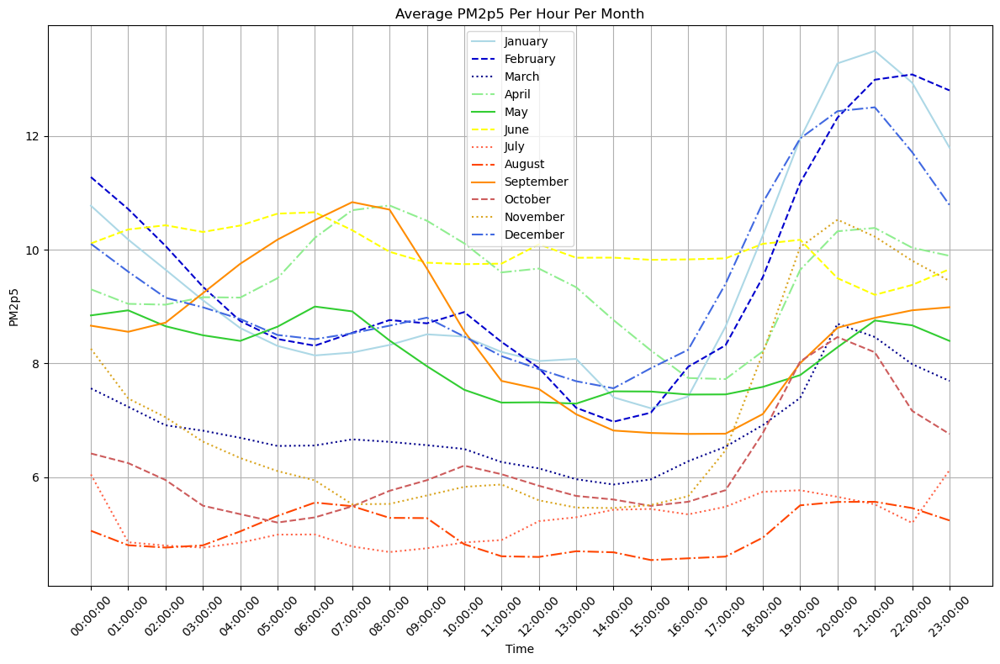

In [25]:
month_colors = ["lightblue", "mediumblue", "darkblue", "lightgreen", "limegreen", "yellow", "tomato", "orangered", "darkorange", "indianred", "goldenrod", "royalblue"]
linestyle = ['-', '--', ':', '-.','-', '--', ':', '-.','-', '--', ':', '-.']

plt.figure(figsize=(12, 8))
for i in range(len(months)):
    plt.plot(times, ave_all_data[i], linestyle=linestyle[i], color = month_colors[i], label=f'{months[i]}')
plt.title('Average PM2p5 Per Hour Per Month')
plt.xlabel('Time')
plt.ylabel('PM2p5')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

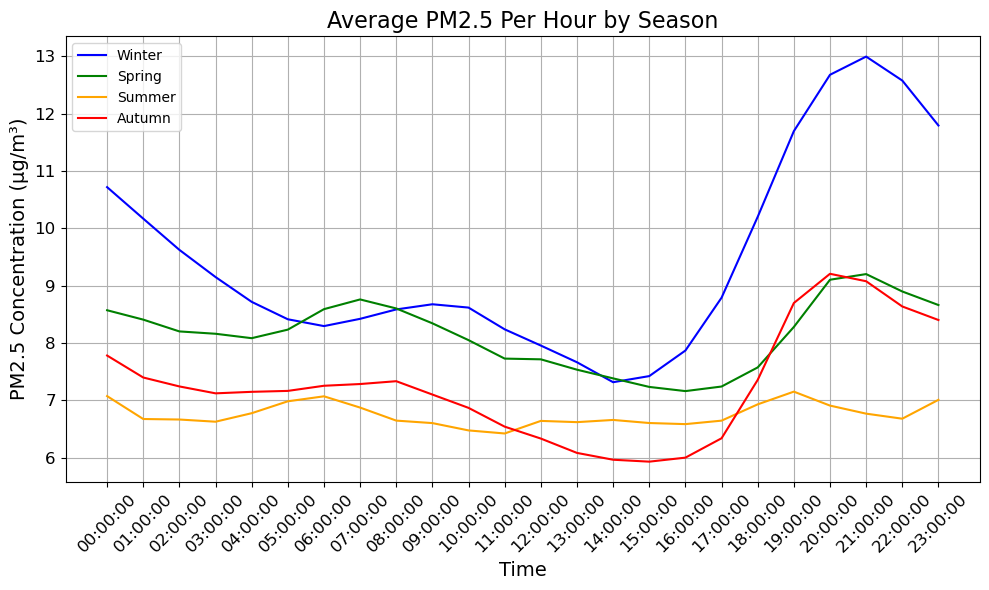

In [26]:
winter = []
spring = []
summer = []
autumn = []

for j in range(12):
    if j < 2:
        winter.append(ave_all_data[j])
    elif j < 5:
        spring.append(ave_all_data[j])
    elif j < 8:
        summer.append(ave_all_data[j])
    elif j < 11:
        autumn.append(ave_all_data[j])
    else: winter.append(ave_all_data[j])

averages_winter = [sum(sublist) / len(sublist) for sublist in zip(*winter)]
averages_spring = [sum(sublist) / len(sublist) for sublist in zip(*spring)]
averages_summer = [sum(sublist) / len(sublist) for sublist in zip(*summer)]
averages_autumn = [sum(sublist) / len(sublist) for sublist in zip(*autumn)]

plt.figure(figsize=(10, 6))  # Smaller figure size

plt.plot(times, averages_winter, label='Winter', color='blue')
plt.plot(times, averages_spring, label='Spring', color='green')
plt.plot(times, averages_summer, label='Summer', color='orange')
plt.plot(times, averages_autumn, label='Autumn', color='red')

# Title and labels with larger font size
plt.title('Average PM2.5 Per Hour by Season', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('PM2.5 Concentration (µg/m³)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels and set font size
plt.yticks(fontsize=12)  # Set font size for y-axis ticks

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(r'C:\Users\olive\OneDrive\Documents\Soton\Air Quality\images\seasons.svg', format='svg')

plt.show()

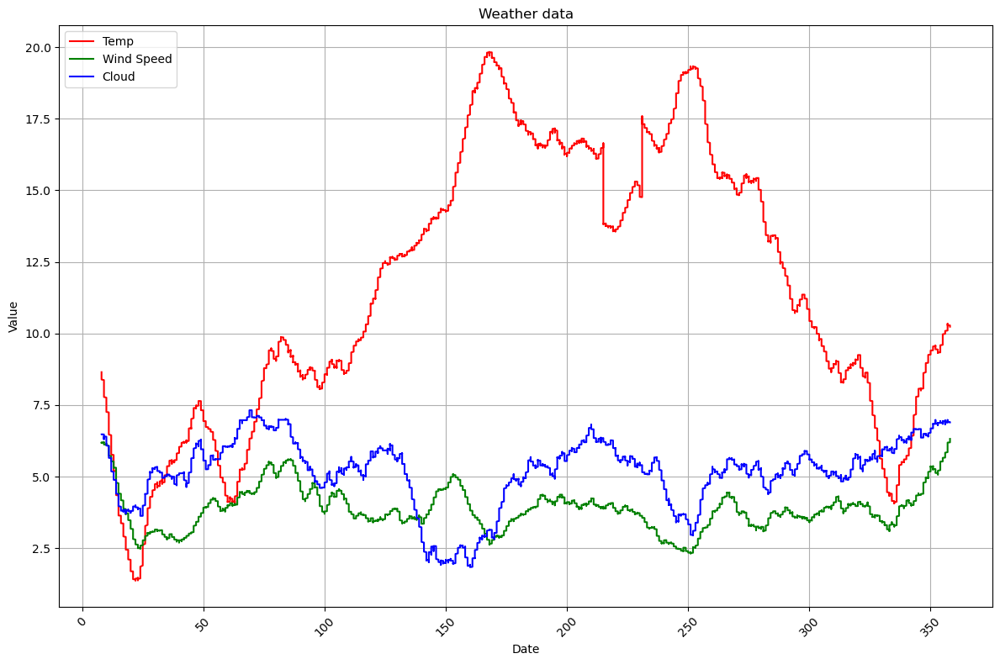

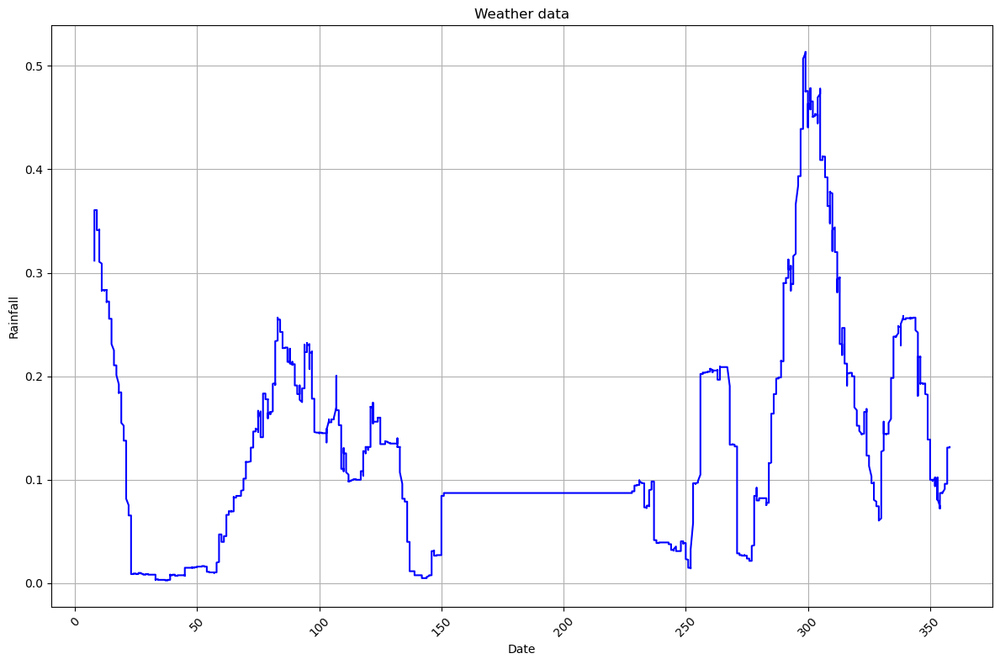

In [27]:
# Wether data investigation
weather_data = pd.read_csv(weather_path)
curupt_rows = [252,2054,5341]
for j in range(len(weather_data)):
    if weather_data.iloc[j, 8] == -999: # or weather_data.iloc[j, 7] == -999
        curupt_rows.append(j)
        
for t in sorted(curupt_rows, reverse=True):
    weather_data = weather_data.drop(t)

moving_avg_temp = np.convolve(weather_data.iloc[:, 4], np.ones(360)/360, mode='valid')
moving_avg_wind = np.convolve(weather_data.iloc[:, 5], np.ones(360)/360, mode='valid')
moving_avg_cloud = np.convolve(weather_data.iloc[:, 8], np.ones(360)/360, mode='valid')
dates = weather_data.iloc[:, 2][179:len(moving_avg_temp)+179] 

plt.figure(figsize=(12, 8))

plt.plot(dates, moving_avg_temp, color='red', label = 'Temp')
plt.plot(dates, moving_avg_wind, color='green', label = 'Wind Speed')
plt.plot(dates, moving_avg_cloud, color='b', label = 'Cloud')

plt.title('Weather data')
plt.xlabel('Date')
plt.ylabel('Value')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()

weather_data = pd.read_csv(weather_path)
curupt_rows = [252,2054]
for j in range(len(weather_data)):
    if weather_data.iloc[j, 8] == -999 or weather_data.iloc[j, 7] == -999:
        curupt_rows.append(j)
        
for t in sorted(curupt_rows, reverse=True):
    weather_data = weather_data.drop(t)

plt.figure(figsize=(12, 8))
moving_avg_rain = np.convolve(weather_data.iloc[:, 7], np.ones(360)/360, mode='valid')
dates = weather_data.iloc[:, 2][179:len(moving_avg_rain)+179] 
plt.plot(dates, moving_avg_rain, color='b')
plt.title('Weather data')
plt.xlabel('Date')
plt.ylabel('Rainfall')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.tight_layout()
plt.show()

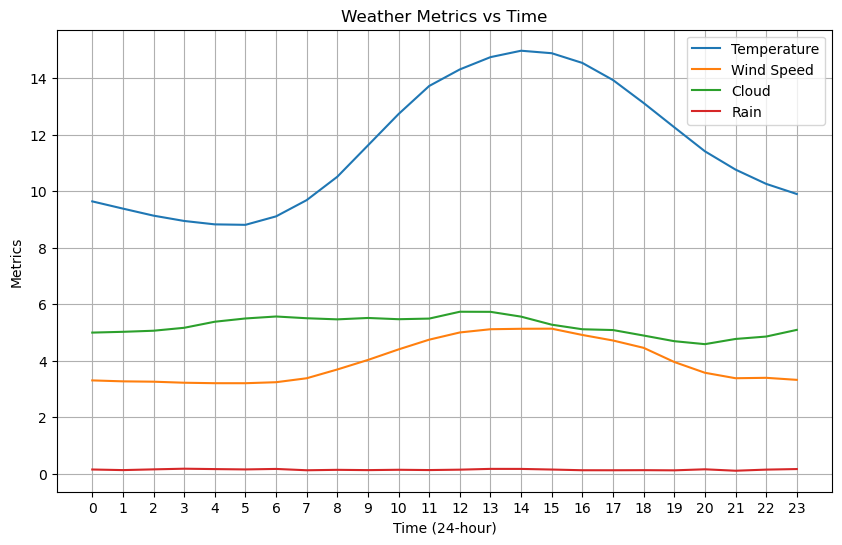

In [28]:
# Again the hour by hour averages of this data was calculated in Excel and then coppied over for easy use
hours = list(range(24))
temp = [9.639726027, 9.384109589, 9.134794521, 8.946575342, 8.826027397, 8.809315068, 9.108767123, 9.684383562, 10.51205479, 11.62136986, 12.73232877, 13.72575342, 14.31208791, 14.74630137, 14.97342466, 14.88493151, 14.54082192, 13.93506849, 13.12273973, 12.26356164, 11.41315068, 10.76465753, 10.25945205, 9.900821918]
wind_speed = [3.301917808, 3.268493151, 3.256438356, 3.219452055, 3.203013699, 3.202465753, 3.237808219, 3.377808219, 3.688767123, 4.02630137, 4.399452055, 4.744383562, 4.999450549, 5.113424658, 5.12967033, 5.132876712, 4.910410959, 4.714794521, 4.455068493, 3.953972603, 3.57260274, 3.37890411, 3.393424658, 3.321643836]
cloud = [4.994505495, 5.021978022, 5.06043956, 5.164383562, 5.379120879, 5.494505495, 5.564383562, 5.502747253, 5.463013699, 5.512396694, 5.468144044, 5.490358127, 5.732782369, 5.729281768, 5.559556787, 5.274238227, 5.112328767, 5.084931507, 4.890410959, 4.690410959, 4.585164835, 4.769230769, 4.854395604, 5.090659341]
rain = [0.147766323, 0.126460481, 0.15257732, 0.175945017, 0.162199313, 0.150515464, 0.167697595, 0.120962199, 0.136082474, 0.125773196, 0.13814433, 0.127835052, 0.142068966, 0.169655172, 0.16838488, 0.146391753, 0.121649485, 0.120962199, 0.124398625, 0.118213058, 0.154639175, 0.104467354, 0.143642612, 0.163573883]

plt.figure(figsize=(10, 6))
plt.plot(hours, temp, label='Temperature')
plt.plot(hours, wind_speed, label='Wind Speed')
plt.plot(hours, cloud, label='Cloud')
plt.plot(hours, rain, label='Rain')
plt.xlabel('Time (24-hour)')
plt.ylabel('Metrics')
plt.title('Weather Metrics vs Time')
plt.legend()
plt.grid(True)
plt.xticks(hours)  # Set x-axis ticks to show every hour
plt.show()


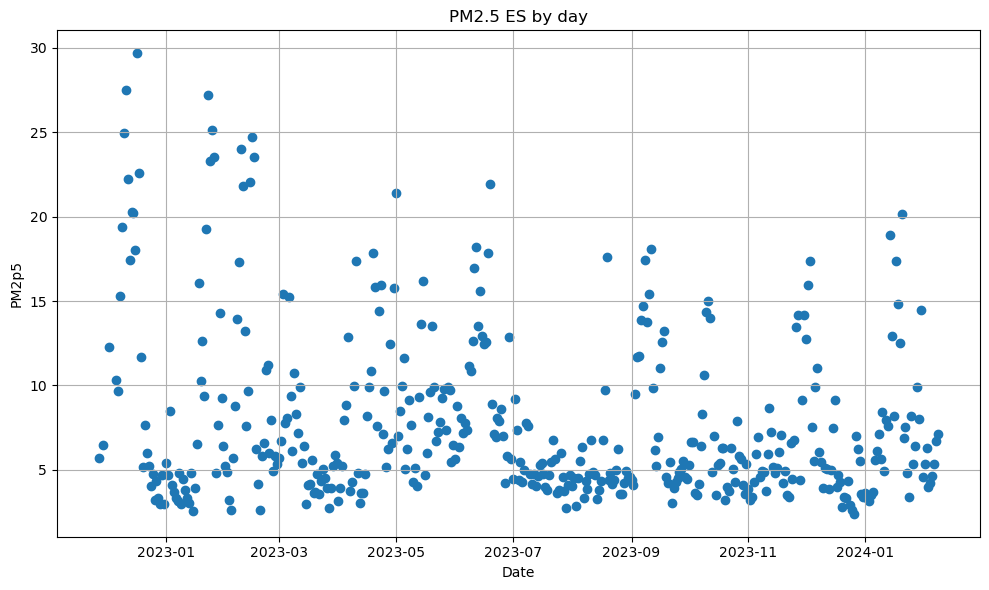


Printing dates of high average PM2.5

[[datetime.datetime(2022, 12, 8, 0, 0), 15.271538461538459], [datetime.datetime(2022, 12, 9, 0, 0), 19.388461538461538], [datetime.datetime(2022, 12, 10, 0, 0), 24.956923076923076], [datetime.datetime(2022, 12, 11, 0, 0), 27.49076923076923], [datetime.datetime(2022, 12, 12, 0, 0), 22.242307692307694], [datetime.datetime(2022, 12, 13, 0, 0), 17.415384615384614], [datetime.datetime(2022, 12, 14, 0, 0), 20.255384615384614], [datetime.datetime(2022, 12, 15, 0, 0), 20.206153846153846], [datetime.datetime(2022, 12, 16, 0, 0), 17.997692307692308], [datetime.datetime(2022, 12, 17, 0, 0), 29.671538461538454], [datetime.datetime(2022, 12, 18, 0, 0), 22.554999999999996], [datetime.datetime(2023, 1, 18, 0, 0), 16.0625], [datetime.datetime(2023, 1, 22, 0, 0), 19.27916666666667], [datetime.datetime(2023, 1, 23, 0, 0), 27.189166666666665], [datetime.datetime(2023, 1, 24, 0, 0), 23.2775], [datetime.datetime(2023, 1, 25, 0, 0), 25.129999999999995], [datetime.datet

In [29]:
# Investigating individule days

plt.figure(figsize=(10, 6))
plt.scatter(dates_to_plot, average_values_to_plot)
plt.xlabel('Date')
plt.ylabel('PM2p5')
plt.title('PM2.5 ES by day')
plt.grid(True)
plt.tight_layout()
plt.show()

extreames = []
for t in range(len(average_values_to_plot)):
    if average_values_to_plot[t] > 15:
        extreames.append([dates_to_plot[t], average_values_to_plot[t]])
        
print('')
print('Printing dates of high average PM2.5')
print('')
print(extreames)
# New forest lady dates
lady_dates = [
    datetime(2022, 12, 8, 0, 0),
    datetime(2023, 1, 16, 0, 0),
    datetime(2023, 1, 17, 0, 0),
    datetime(2023, 1, 18, 0, 0),
    datetime(2023, 2, 4, 0, 0),
    datetime(2023, 2, 5, 0, 0),
    datetime(2023, 2, 6, 0, 0),
    datetime(2023, 2, 7, 0, 0),
    datetime(2023, 8, 15, 0, 0),
    datetime(2023, 9, 1, 0, 0),
    datetime(2023, 9, 2, 0, 0),
    datetime(2023, 9, 3, 0, 0),
    datetime(2023, 10, 27, 0, 0),
    datetime(2023, 11, 24, 0, 0),
    datetime(2023, 11, 25, 0, 0)
]

lady_vals_v_es = []
for d in lady_dates:
    x = dates_to_plot.index(d)
    lady_vals_v_es.append([d, average_values_to_plot[x]])
    
print('')
print('Printing dates that the New Forest Lady said had bad pollution ancdotally')
print('')
print(lady_vals_v_es)


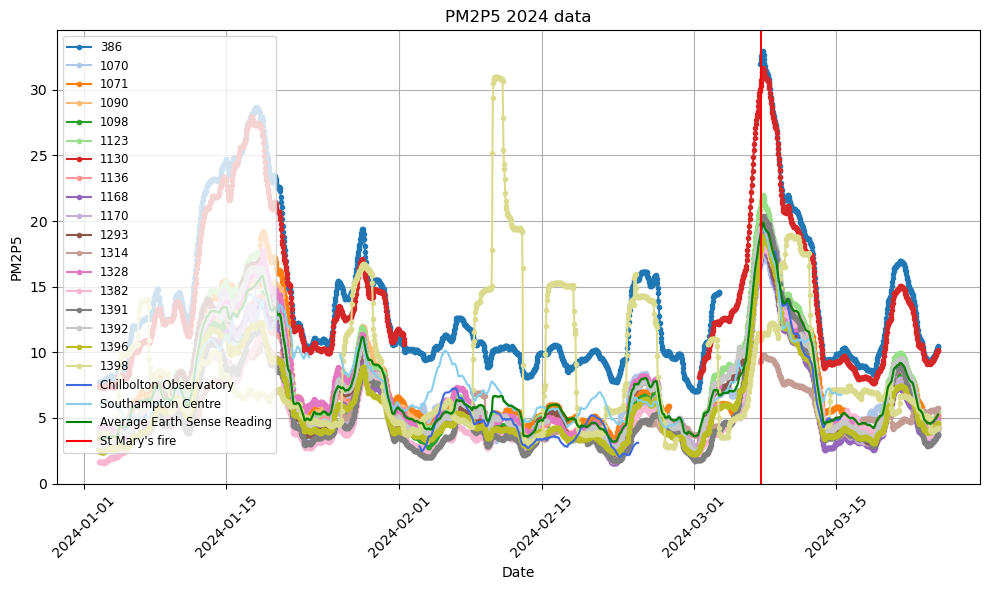

In [30]:
# This cell plots all of the 2024 data and marks the date where the St Marrys fire was

plt.figure(figsize=(10, 6))    

def get_date_24(date_str):
    try:
        date = datetime.strptime(date_str, "%Y-%m-%d %H:%M:%S")
    except ValueError:
        date = datetime.strptime(date_str, "%Y-%m-%d")
    return date

# Calculating the average of all the earth sense 24-hour data
all_dates_2024 = []
for date_str in data_1_24.iloc[:, 3]:
    date = get_date_24(date_str)
    all_dates_2024.append(date)
all_dates_2024 = sorted(list(set(all_dates_2024)))

date_values_2024 = defaultdict(list)
colors = cycle(plt.cm.tab20.colors)
for j in range(18):
    for index, row in all_splits_per_id_2024[1][j][1].iterrows():
        date_str = row[3]  
        date = get_date_24(date_str)
    
        date_values_2024[date].append(row[12])  
    
    color = next(colors)
    dates = []
    values = []

    for date_str in all_splits_per_id_2024[1][j][1].iloc[:, 3]:
        date = get_date_24(date_str)
        dates.append(date)

    values = all_splits_per_id_2024[1][j][1].iloc[:, 12]

    # Calculate the 15-point moving average
    ma = 72
    ma_half = int(ma/2) 
    moving_avg = np.convolve(values, np.ones(ma)/ma, mode='valid')
    # Adjust dates to match the length of the moving average
    dates = dates[ma_half:len(moving_avg)+ma_half] 
    
    plt.plot(dates, moving_avg, marker='.', linestyle='-', color=color, label=all_splits_per_id_2024[1][j][0])

dates = AURN_post_fire.iloc[10:1834, 0]
times = AURN_post_fire.iloc[10:1834, 1]
dates_AURN = []
for i in range(len(dates)):
    hour = str(int(times.iloc[i][:2])-1)
    date_and_time = dates.iloc[i]+" "+hour+times.iloc[i][2:]
    
    date_and_time = datetime.strptime(date_and_time, "%d/%m/%Y %H:%M:%S")
    dates_AURN.append(date_and_time)
    
values = AURN_post_fire.iloc[10:, 2]
values = pd.to_numeric(values, errors='coerce')
    
moving_avg = np.convolve(values, np.ones(ma)/ma, mode='valid')
dates = dates_AURN[ma_half:len(moving_avg)+ma_half] 

plt.plot(dates, moving_avg, color='royalblue', label='Chilbolton Observatory')

values = AURN_post_fire.iloc[10:, 4]
values = pd.to_numeric(values, errors='coerce')
    
moving_avg = np.convolve(values, np.ones(ma)/ma, mode='valid')

plt.plot(dates, moving_avg, color='skyblue', label='Southampton Centre')


average_values_2024 = {}
for date, values in date_values_2024.items():
    count = sum(1 for value in values if not np.isnan(value))
    if count >= 8:
        average_values_2024[date] = np.nanmean(values)

average_values_2024 = dict(sorted(average_values_2024.items()))

dates_to_plot_2024 = list(average_values_2024.keys())
average_values_to_plot_2024 = list(average_values_2024.values())

moving_avg_all_es_2024 = np.convolve(average_values_to_plot_2024, np.ones(ma)/ma, mode='valid')
dates_es_2024 = dates_to_plot_2024[ma_half:len(moving_avg_all_es_2024)+ma_half] 

   
plt.plot(dates_es_2024, moving_avg_all_es_2024, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')

plt.axvline(x=dates[1561], color='r', label = 'St Mary\'s fire')

plt.title('PM2P5 2024 data')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left', fontsize='small')  # Add legend
plt.tight_layout()
plt.show()



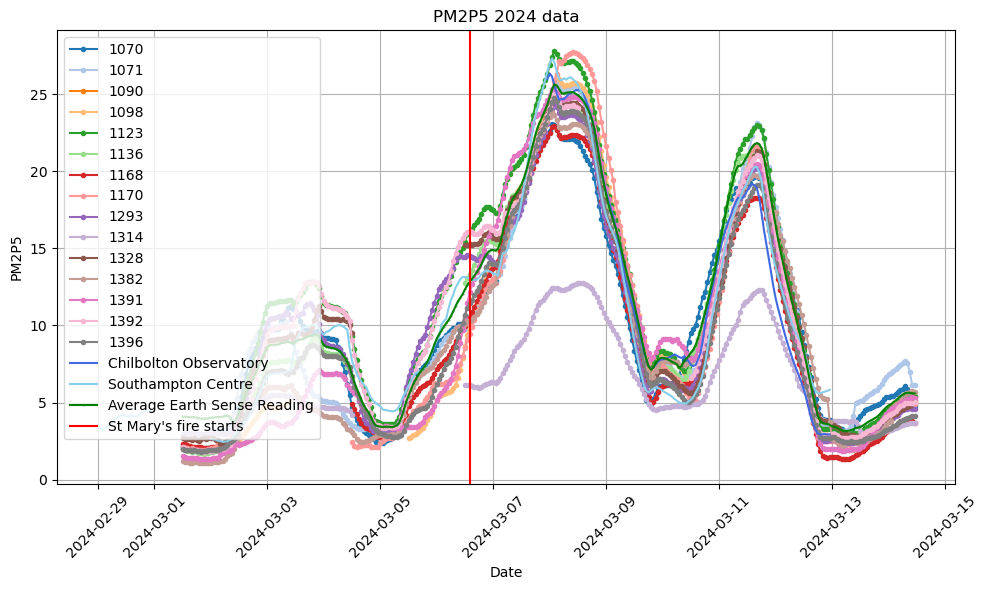

In [31]:
# Here we have a closer look at the timeframe arround the fire

plt.figure(figsize=(10, 6))    

colors = cycle(plt.cm.tab20.colors)
void = [0,6,17]
for j in range(18):
    if j not in void:
        color = next(colors)
        dates = []
        values = []

        for date_str in all_splits_per_id_2024[1][j][1].iloc[1441:1776, 3]:
            date = get_date_24(date_str)
            dates.append(date)

        values = all_splits_per_id_2024[1][j][1].iloc[1441:1776, 12]

        # Calculate the 15-point moving average
        ma = 24
        ma_half = int(ma/2) 
        moving_avg = np.convolve(values, np.ones(ma)/ma, mode='valid')
        # Adjust dates to match the length of the moving average
        dates = dates[ma_half:len(moving_avg)+ma_half] 

        plt.plot(dates, moving_avg, marker='.', linestyle='-', color=color, label=all_splits_per_id_2024[1][j][0])

dates = AURN_post_fire.iloc[10:1834, 0]
times = AURN_post_fire.iloc[10:1834, 1]
dates_AURN = []
for i in range(len(dates)):
    hour = str(int(times.iloc[i][:2])-1)
    date_and_time = dates.iloc[i]+" "+hour+times.iloc[i][2:]
    
    date_and_time = datetime.strptime(date_and_time, "%d/%m/%Y %H:%M:%S")
    dates_AURN.append(date_and_time)
    
values = AURN_post_fire.iloc[10:, 2]
values = pd.to_numeric(values, errors='coerce')
values = values[1404:1739]
dates_AURn_sub = dates_AURN[1404:1739]
moving_avg = np.convolve(values, np.ones(ma)/ma, mode='valid')
dates = dates_AURn_sub[ma_half:len(moving_avg)+ma_half] 

plt.plot(dates, moving_avg, color='royalblue', label='Chilbolton Observatory')

values = AURN_post_fire.iloc[10:, 4]
values = pd.to_numeric(values, errors='coerce')
values = values[1404:1739] 
moving_avg = np.convolve(values, np.ones(ma)/ma, mode='valid')
plt.plot(dates, moving_avg, color='skyblue', label='Southampton Centre')


moving_avg_all_es_2024 = np.convolve(average_values_to_plot_2024[1441:1776], np.ones(ma)/ma, mode='valid')
dates_es_2024 = dates_to_plot_2024[1441:1776][ma_half:len(moving_avg_all_es_2024)+ma_half] 

   
plt.plot(dates_es_2024, moving_avg_all_es_2024, marker='.', markersize=.5, linestyle='-', color='green', label = 'Average Earth Sense Reading')

plt.axvline(x=dates[1561-1403], color='r', label = 'St Mary\'s fire starts')

plt.title('PM2P5 2024 data')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()



IndexError: list assignment index out of range

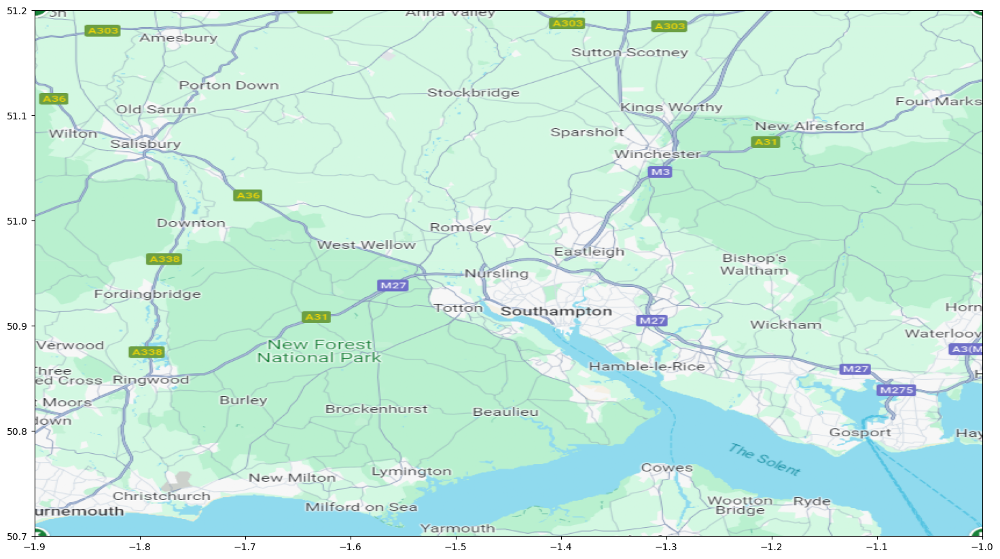

In [32]:
# Here we plot a map showing the the average impact to sensors around Hampshire after the forest fire
means_per_sensor = []
void = [0,3,6,11,17]
for j in range(18):
    if j not in void:
        values = all_splits_per_id_2024[1][j][1].iloc[1575:1647, 12]
        means_per_sensor.append(np.mean(values))
        
values = AURN_post_fire.iloc[10:, 2]
values = pd.to_numeric(values, errors='coerce')
values = values[1574:1646]
means_per_sensor.append(np.nanmean(values))

values = AURN_post_fire.iloc[10:, 4]
values = pd.to_numeric(values, errors='coerce')
values = values[1574:1646]
means_per_sensor.append(np.nanmean(values))


# percentage_hotspots_per_sensor = np.mean(H, axis=1)
plt.figure(figsize=(18, 12))
# Load the image
img = mpimg.imread('C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\map_2.png')

# Plot the image
plt.imshow(img, extent=[-1.9, -1, 50.7, 51.2])
location_list_rpca = full_list.copy()
location_list_rpca = sorted(location_list_rpca)
del location_list_rpca[17]
del location_list_rpca[11]
del location_list_rpca[6]
del location_list_rpca[3]
del location_list_rpca[0]

location_for_rpca_plot_x = []
location_for_rpca_plot_y = []
for sublist in location_list_rpca:
    if sublist[0] == 1391:
        x, y = -1.35, 51.07
        location_for_rpca_plot_x.append(x)
        location_for_rpca_plot_y.append(y)
    if sublist[1]:  # Check if sublist contains tuples
        x = [point[0] for point in sublist[1] if point[1]<52]
        y = [point[1] for point in sublist[1] if point[1]<52]
        
        if len(x) > 1:
            x = sum(x)/2
            y = sum(y)/2
        try:    
            x = x[0]
        except: x=x
        try:    
            y = y[0]
        except: y=y
        location_for_rpca_plot_x.append(x)
        location_for_rpca_plot_y.append(y)

location_for_rpca_plot_x.append(-1.438228)
location_for_rpca_plot_y.append(51.149617)
location_for_rpca_plot_x.append(-1.463484)
location_for_rpca_plot_y.append(50.920265)

scatter = plt.scatter(location_for_rpca_plot_x, location_for_rpca_plot_y, c=means_per_sensor, cmap='RdYlGn_r', s=100, edgecolor='k')

plt.scatter(-1.3901, 50.9058,  color='blue', marker='x', label = "Location of Fire")


# Plot wind direction vector
wind_direction = 277.5
x_direct = 0.1
y_direct = np.tan(np.radians(wind_direction-3*90))*x_direct
plt.quiver(-1.05, 50.75, -x_direct, y_direct, angles='xy', scale_units='xy', scale=1, color='r')
plt.text(-1.1, 50.78, 'Average Wind Direction', color='black', fontsize=14, ha='center')
plt.text(-1.06, 50.765, '(8.8mph)', color='black', fontsize=14, ha='center')

plt.colorbar(scatter, label='Percentage of hotspots')
plt.xlabel('Longnitude')
plt.ylabel('Latitude')
plt.legend()
plt.title('Sensor Readings during St Marry\'s Fire')
plt.grid(True)
plt.show()

The above concerns a high level view of the data. Now we are going to investigate hotspots using insipration from the Imperial paper.

In [ ]:
# First we create the matrix X
# The following takes a while to run so bits of it are commented out
# If this is the first time running on local device then uncomment to download X matrix to device
# After this it can be used as presented below

start_date = datetime(2022, 11, 28)
end_date = datetime(2024, 2, 8)

# Initialize an empty list to store dates and values
all_dates = []

# Iterate over each date between start_date and end_date
current_date = start_date
while current_date <= end_date:
    # For each date, iterate over each hour of the day (0 to 23)
    for hour in range(24):
        # Create a datetime object representing the current date and hour
        current_datetime = current_date + timedelta(hours=hour)
        # Append the datetime object to the list
        all_dates.append(current_datetime)
        
    # Move to the next date
    current_date += timedelta(days=1)
    
# list_of_rows = []
# for sensor in range(18):
#     # excluding sensor 1396
#     print(sensor)
#     if sensor != 16:
#         df = all_splits_per_id[1][sensor][1]
#         df.iloc[:, 3] = pd.to_datetime(df.iloc[:, 3], errors='coerce')
#         df.iloc[:, 3] = df.iloc[:, 3].dt.strftime('%Y-%m-%d %H:%M:%S')
        
#         new_row = []
#         for date in all_dates:
#             try:
#                 try:
#                     date = str(datetime.strptime(str(date), '%Y-%d-%m %H:%M:%S')) 
#                 except:
#                     date = str(datetime.strptime(str(date), '%Y-%m-%d %H:%M:%S')) 
#                 j = df.loc[df.iloc[:, 3] == date].iloc[0,12]
                
#             except:
#                 j = np.nan
#             new_row.append(j)
#         list_of_rows.append(new_row)
        
        
# X = np.array(list_of_rows)        

# X_df = pd.DataFrame(X)
# X_df.to_csv('X_matrix.csv', index=False)
X = pd.read_csv('X_matrix.csv')

print(np.matrix(X).shape)

In [ ]:
# Going to use delta t of 6 hours
def percentage_non_nan(row):
    non_nan_count = np.count_nonzero(~np.isnan(row))  # Count non-NaN values
    total_elements = len(row)  # Total number of elements
    return (non_nan_count / total_elements) * 100 

X_delta6 = []

for j in range(17):
    new_row = []
    for i in range(0, len(X.iloc[j, :]), 6):
        group = X.iloc[j,i:i+6]
        
        percentage_non_nan(group)
        average = np.mean(group)
        new_row.append(average)
    X_delta6.append(new_row)

X_delta6 = np.array(X_delta6) 

X_delta6_large_population = []
# rows which have less than 75% of data are removed from analysis
for j in range(17):
    val = percentage_non_nan(X_delta6[j])
    if val < 75:
        print(val)
    elif j!=6: 
        X_delta6_large_population.append(X_delta6[j])

# Sensors 386, 1314, 1398 are removed 
# I also remove sensor 1130 since its so high above

In [ ]:
# Now we do DFT
def power_spectrum_density(x):
    N = len(x)
    X = np.zeros(N, dtype=np.complex128)
    for k in range(N):
        not_nans = 0
        for n in range(N):
            if not np.isnan(x[n]):
                X[k] += x[n] * np.exp(-1j * 2 * np.pi * k * n / N)
            else:
                not_nans += 1
        X[k] = np.abs((1/math.sqrt(N-not_nans))*X[k])
    return X


# Hann window func
def hann_window(n, length):
    return 0.5 - 0.5 * np.cos(2 * np.pi * n / (length - 1))
def sig_centre(X):
    mean = np.mean(X)
    new_list = []
    for n in range(len(X)):
        new_val = hann_window(n, len(X))*X[n] - mean
        new_list.append(new_val)
    return new_list

In [ ]:
# Make normalised Z
X = np.matrix(X_delta6_large_population)
Xsd = np.nanstd(X)
Z = (X-np.nanmean(X))/Xsd
plt.figure(figsize=(8, 6))
plt.imshow(Z, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('Normalised matrix Z')
plt.show()

Z_pre_norm = Z.copy()

In [ ]:
# Now I fill gaps of Z
for i in range(Z.shape[1]):
    if np.isnan(Z[:, i]).any():
        mean_of_other_sensors = np.nanmean(Z[:, i])
        for j in range(13):
            if np.isnan(Z[j, i]):
                Z[j, i] = mean_of_other_sensors

plt.figure(figsize=(8, 6))
plt.imshow(Z, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('Normalised matrix Z, np.nan values filled')
plt.show()

In [ ]:
# Again, the following takes a while to run and will have to be uncomented if this file is being run for the first time

# # Define the variables
# Z = np.round(Z, 3)
# m, n = Z.shape
# S = cp.Variable((m, n))
# L = cp.Variable((m, n))
# ylambda = np.sqrt(1/max(m,n))

# # Define the objective function
# objective = cp.Minimize(cp.norm(L, "nuc") + ylambda*cp.sum(cp.abs(S)))

# # Define the constraints
# X = Z
# # X = np.random.randn(100, 30)
# constraints = [X == S + L]

# # Formulate the problem
# problem = cp.Problem(objective, constraints)



# # problem.solve()
# problem.solve(solver=cp.SCS, verbose=True)

# # Extract the optimal values
# optimal_S = S.value
# optimal_L = L.value

In [ ]:
# optimal_L = pd.DataFrame(optimal_L)
# optimal_L.to_csv('L_matrix.csv', index=False)
# optimal_S = pd.DataFrame(optimal_S)
# optimal_S.to_csv('S_matrix.csv', index=False)

L = pd.read_csv('L_matrix.csv')
S = pd.read_csv('S_matrix.csv')

In [ ]:
plt.figure(figsize=(8, 6))
plt.imshow(L, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('L')
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(S, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('S')
plt.show()

In [ ]:
alpha = 1
Zsd = np.nanstd(Z)
mask = S >= alpha*Zsd
H = mask.astype(int)

plt.figure(figsize=(8, 6))
plt.imshow(H, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('H')
plt.show()


In [ ]:
# Below we print identfy which dates this analysis identifies as hotspots
htospots=[]
for i in range(len(H)):
    sensor_hotspot = []
    for j in range(len(H.columns)):
        # Check if the element equals 1
        if H.iloc[i, j] == 1:
            sensor_hotspot.append((i, str(all_dates[2::6][j])))
#             print("Index (i, j) where H.iloc[i, j] = 1:", (i, j))
#             print(all_dates[2::6][j])
    htospots.append(sensor_hotspot)
print(htospots)

In [ ]:
# We can plot the frequency of hotspots by date
column_means = np.mean(H, axis=0)
plt.plot(all_dates[2::6], column_means)

# Customize your plot (if needed)
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.title('Hotspot frequency by date')
plt.grid(True)


In [ ]:
# Below simply prints out the dates with the highest number of hotspots
high_hotspot_index = [index for index, value in enumerate(column_means) if value > 0.5]
high_hotspot_days = [str(all_dates[2::6][i])[:10] for i in high_hotspot_index]
formatted_high_hotspot_dates = [datetime.strptime(date, '%Y-%m-%d').strftime('%d-%b-%y') for date in high_hotspot_days]
seen = set()
unique_formatted_high_hotspot_dates = [x for x in formatted_high_hotspot_dates if not (x in seen or seen.add(x))]
print(unique_formatted_high_hotspot_dates)

In [ ]:
# Looking at hotspot for sensor 1293 since this read the largest hotspot
Z_pre_norm
# Sensors 386, 1314, 1398 are removed 
# I also remove sensor 1130 since its so high above
removed = [386,1130,1314,1396,1398]
sensors_for_hotspot = []
for j in range(18):
    id = all_splits_per_id[2][j][0]
    if id not in removed:
        sensors_for_hotspot.append(id)

print(sensors_for_hotspot)
print(all_dates[3::6][40])
print(all_dates[3::6][90])
selected_dates = all_dates[3::6][40:90+1]

columns_to_plot = np.linspace(0, 50, 51)
for i, row in enumerate(Z):
    plt.plot(columns_to_plot, np.array(row)[0][40:91], label = sensors_for_hotspot[i])

# Customize your plot (if needed)
plt.xlabel('Column Index')
plt.legend()
plt.ylabel('Value')
plt.title('PM2.5 between dates of 8-Dec to 20-Dec 2022')
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
# Next we map out the sensors and mark how offten they recorded hotspots

location_list_rpca = full_list.copy()
del location_list_rpca[-2]
del location_list_rpca[-4]
del location_list_rpca[5]
del location_list_rpca[3]
del location_list_rpca[0]

location_list_rpca = sorted(location_list_rpca)
percentage_hotspots_per_sensor = np.mean(H, axis=1)

plt.figure(figsize=(18, 12))

# Load the map of hampshire
img = map_of_hants

# Define a list of 18 unique colors
colors = cycle(plt.cm.tab20.colors)

# Plot the image
plt.imshow(img, extent=[-1.9, -1, 50.7, 51.2])

location_for_rpca_plot_x = []
location_for_rpca_plot_y = []
for sublist in location_list_rpca:
    if sublist[0] == 1391:
        x, y = -1.35, 51.07
        location_for_rpca_plot_x.append(x)
        location_for_rpca_plot_y.append(y)
    if sublist[1]:  # Check if sublist contains tuples
        x = [point[0] for point in sublist[1] if point[1]<52]
        y = [point[1] for point in sublist[1] if point[1]<52]
        
        if len(x) > 1:
            x = sum(x)/2
            y = sum(y)/2
        try:    
            x = x[0]
        except: x=x
        try:    
            y = y[0]
        except: y=y
        location_for_rpca_plot_x.append(x)
        location_for_rpca_plot_y.append(y)

percentage_hotspots_per_sensor = np.array(percentage_hotspots_per_sensor)*100
scatter = plt.scatter(location_for_rpca_plot_x, location_for_rpca_plot_y, c=percentage_hotspots_per_sensor, cmap='RdYlGn_r', s=100, edgecolor='k')

# Show plot
plt.colorbar(scatter, label='Percentage of hotspots')
plt.xlabel('Longnitude')
plt.ylabel('Latitude')
plt.title('Sensors by percentage of hotspots')
plt.grid(True)
plt.show()

In [ ]:
# Now return to the 24 hour cycle to apply hotspot analysis. Because we are averageing over 
# the 24 hour cycle I think it's okay to use the aurn and wsg data
data = {
    1070: [8.106071429, 7.560286396, 7.24071599, 6.964210526, 6.565861244, 6.510071942, 6.481151079, 6.586682692, 6.415710843, 6.29964455, 6.158824885, 5.860091954, 5.532614679, 5.340821918, 5.291853547, 5.413340961, 5.990781609, 6.975638051, 8.078306265, 9.359209302, 10.08177156, 9.77969555, 9.398341232, 8.638309524],
    1071: [8.199458824, 7.832023529, 7.552941176, 7.377623529, 7.275341176, 7.226211765, 7.1608, 7.256564706, 7.342141176, 7.433788235, 7.311576471, 7.128705882, 6.830823529, 6.711458824, 6.664470588, 6.686776471, 7.085788235, 8.180705882, 8.874729412, 9.710682353, 9.752141176, 9.818517647, 9.524447059, 8.9276],
    1090: [8.802254902, 8.55729064, 8.337901235, 8.234554455, 8.157736318, 8.098004988, 8.034189526, 8.075112219, 7.944175, 7.753876543, 7.496122931, 6.973100233, 6.720254042, 6.504153132, 6.304511628, 6.191465116, 6.402960373, 6.987777778, 8.540690476, 9.514128878, 10.24896635, 10.46331719, 9.926715328, 9.138536585],
    1098: [7.232015707, 7.239057592, 7.079633508, 6.970942408, 6.942225131, 6.967225131, 7.014225722, 6.950524934, 6.820682415, 6.748802083, 6.680520833, 6.42671875, 6.210755208, 6.039322917, 5.929298701, 5.861558442, 5.928935065, 5.965116883, 6.200859375, 6.490598958, 6.806145833, 7.044895833, 7.076770833, 7.158177083],
    1123: [7.575041096, 7.377123288, 7.178846154, 6.972802198, 6.949203297, 6.951785714, 7.101291209, 7.036253444, 7.039834254, 6.810381471, 6.483638814, 6.504959569, 6.333101604, 6.049171123, 6.018981233, 6.084986595, 6.023458445, 6.205281501, 6.634432432, 7.081226158, 7.561448087, 7.79204918, 7.712896175, 7.775616438],
    1136: [8.011111111, 7.741725768, 7.517943262, 7.301489362, 7.203388626, 7.249928741, 7.312488152, 7.407030879, 7.389261905, 7.242529551, 6.99771028, 6.786162791, 6.45144186, 6.163781903, 6.019837963, 6.01855814, 6.198228438, 6.687470726, 7.404028103, 8.035469484, 8.816235294, 8.845294118, 8.568376471, 8.43787234],
    1168: [7.627751756, 7.174366197, 6.939929577, 6.800517647, 6.652541176, 6.628282353, 6.702169811, 6.759453682, 6.6385, 6.394504717, 6.144885321, 5.800297483, 5.543963554, 5.251571754, 5.111731207, 5.081070615, 5.20856492, 5.735802752, 6.428819444, 7.183125, 8.324570766, 9.005594406, 8.728111888, 8.142517483],
    1170: [6.983465116, 6.734918415, 6.636588785, 6.514379391, 6.47556338, 6.549764706, 6.485966981, 6.377028302, 6.426745283, 6.35212963, 6.174703196, 5.919840183, 5.618952164, 5.521298405, 5.447220957, 5.506241458, 5.758398169, 6.165091743, 6.873464203, 7.587598152, 7.963302326, 8.131302326, 7.937883721, 7.233976744],
    1293: [8.339548694, 7.746935867, 7.366674584, 7.161377672, 7.067703349, 7.039903614, 7.127142857, 7.210748792, 7.24326087, 7.016745843, 6.602079439, 6.353901869, 6.10255814, 5.888255814, 5.818321678, 5.890722611, 6.099042056, 6.728364486, 7.797441315, 9.025070423, 9.571482353, 9.690117925, 9.464704492, 8.774869359],
    1328: [8.521635071, 8.317582938, 7.989170616, 7.768720379, 7.681312649, 7.943866348, 8.152139423, 8.139495192, 7.975917874, 7.825829384, 7.476121495, 7.134162791, 6.693457077, 6.449095128, 6.289489559, 6.134046512, 6.142116279, 6.444439252, 6.970327103, 7.653691589, 8.093231132, 8.350141844, 8.574539007, 8.528199052],
    1382: [7.053154206, 6.862716628, 6.651995305, 6.448896714, 6.323270588, 6.289388235, 6.1892, 6.108329412, 6.121741176, 5.923808411, 7.702767442, 6.690979021, 6.733240093, 6.171906977, 6.669211137, 6.435986079, 7.407006961, 6.574733179, 7.758813953, 8.236302326, 8.879160839, 9.247016317, 8.488228438, 7.50296729],
    1391: [6.721186869, 6.745714286, 6.777582697, 6.818820513, 6.927369792, 6.852454308, 6.891968504, 6.823412073, 6.621157895, 6.447885117, 6.044914425, 5.699761905, 5.492141176, 5.241662763, 5.08588785, 5.067488263, 5.159740566, 5.496650718, 5.912397094, 6.488762136, 6.678875306, 6.867616708, 6.869207921, 6.797293233],
    1392: [8.391162791, 8.020186047, 7.784209302, 7.656627907, 7.504232558, 7.463232558, 7.553116279, 7.500604651, 7.459465116, 7.330651163, 7.006418605, 6.71937355, 6.335684455, 6.089651972, 5.959837587, 5.924976852, 6.006226852, 6.493781903, 7.140278422, 7.892459397, 8.463201856, 8.671415313, 8.642018561, 8.775046512],
    "Soton Centre": [10.11666297, 9.317895787, 8.957332594, 8.790949002, 8.58032816, 8.445691796, 8.478425721, 8.543895787, 8.579509978, 8.466455556, 8.423399554, 8.089150224, 7.75144, 7.405866962, 7.223441242, 7.159643016, 7.247046667, 7.721498891, 8.407720621, 9.350161863, 9.988126386, 10.18587361, 10.15755654, 10.49298448],
    "Chilbolton": [7.248281501, 7.295378016, 7.200879357, 7.065957105, 7.032631016, 7.125842246, 7.158657754, 7.097425134, 6.934657754, 6.85172118, 6.554487871, 6.239072193, 6.204895442, 6.185687166, 5.743639037, 5.82636828, 5.708595174, 5.932654155, 6.298903485, 6.596549598, 7.11822252, 7.242343164, 7.24752815, 7.17080429],
    "WSTS": [9.376164384, 8.929041096, 8.663013699, 8.437087912, 8.383287671, 8.533424658, 8.936164384, 9.104109589, 9.252328767, 9.12739726, 8.824793388, 8.631955923, 8.86630137, 8.727945205, 8.570136986, 8.431232877, 8.437260274, 9.180547945, 10.23315068, 11.50794521, 12.29890411, 11.77205479, 10.49452055, 9.92109589]
}
num_items = len(data)
list_length = len(next(iter(data.values())))
matrix = np.zeros((num_items, list_length))
for i, key in enumerate(data.keys()):
    matrix[i, :] = data[key]
    
X_24 = matrix
print(X_24.shape)

# Since the matrix is filled and is already an average, no pre-procesing is needed other than
# normalisation

Xsd_24 = np.std(X_24)
Z_24 = (X_24-np.nanmean(X_24))/Xsd_24
plt.figure(figsize=(8, 6))
plt.imshow(Z_24, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('Normalised matrix Z of 24 hour cycle')
plt.show()


In [ ]:
# Find L and S
Z_24 = np.round(Z_24, 3)
m, n = Z_24.shape
S = cp.Variable((m, n))
L = cp.Variable((m, n))
ylambda = np.sqrt(1/max(m,n))

# Define the objective function
objective = cp.Minimize(cp.norm(L, "nuc") + ylambda*cp.sum(cp.abs(S)))

# Define the constraints
X = Z_24
# X = np.random.randn(100, 30)
constraints = [X == S + L]

# Formulate the problem
problem = cp.Problem(objective, constraints)



# problem.solve()
problem.solve(solver=cp.SCS, verbose=True)

# Extract the optimal values
optimal_S = S.value
optimal_L = L.value

In [ ]:
plt.figure(figsize=(8, 6))
plt.imshow(optimal_L, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('L')
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(optimal_S, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('S')
plt.show()

In [ ]:
alpha = 0.1
Zsd = np.std(Z_24)
mask = optimal_S >= alpha*Zsd
H = mask.astype(int)

plt.figure(figsize=(8, 6))
plt.imshow(H, cmap='viridis', aspect='auto', interpolation='nearest')
plt.colorbar(label='Value')
plt.title('H')
plt.show()

In [ ]:
location_list_rpca = sorted(full_list.copy())

del location_list_rpca[-1]
del location_list_rpca[-1]
del location_list_rpca[11]
del location_list_rpca[6]
del location_list_rpca[0]


percentage_hotspots_per_sensor = np.mean(H, axis=1)

plt.figure(figsize=(18, 12))

# Plot the image
plt.imshow(img, extent=[-1.9, -1, 50.7, 51.2])

location_for_rpca_plot_x = []
location_for_rpca_plot_y = []
for sublist in location_list_rpca:
    if sublist[0] == 1391:
        x, y = -1.35, 51.07
        location_for_rpca_plot_x.append(x)
        location_for_rpca_plot_y.append(y)
    if sublist[1]:  # Check if sublist contains tuples
        x = [point[0] for point in sublist[1] if point[1]<52]
        y = [point[1] for point in sublist[1] if point[1]<52]
        
        if len(x) > 1:
            x = sum(x)/2
            y = sum(y)/2
        try:    
            x = x[0]
        except: x=x
        try:    
            y = y[0]
        except: y=y
        location_for_rpca_plot_x.append(x)
        location_for_rpca_plot_y.append(y)

location_for_rpca_plot_x.append(-1.463484)
location_for_rpca_plot_y.append(50.920265)
location_for_rpca_plot_x.append(-1.438228)
location_for_rpca_plot_y.append(51.149617)
location_for_rpca_plot_x.append(-1.314130)
location_for_rpca_plot_y.append(51.062940)

percentage_hotspots_per_sensor = np.array(percentage_hotspots_per_sensor)*100
scatter = plt.scatter(location_for_rpca_plot_x, location_for_rpca_plot_y, c=percentage_hotspots_per_sensor, cmap='RdYlGn_r', s=100, edgecolor='k')

# Show plot
plt.colorbar(scatter, label='Percentage of hotspots')
plt.xlabel('Longnitude')
plt.ylabel('Latitude')
plt.title('Sensors by percentage of hotspots')
plt.grid(True)
plt.show()

In [ ]:
# Now I again consider a 24 hour cycle but instead of taking an average for each sensors for 
# each hour I consider, for each hour, all the data from each sensor and repate the above 
# processe to see how the position of the hotspots change hour by hour.

X_for_24_splits = pd.read_csv('X_matrix.csv')

# As above, remove sensors 386, 1130, 1314, 1396 and 1398
indices_to_drop = [16,11,6,0]
X_for_24_splits = X_for_24_splits.drop(indices_to_drop)
X_for_24_splits = X_for_24_splits.reset_index(drop=True)

print(X_for_24_splits.shape)
the_24_matrices = []

num_columns = X_for_24_splits.shape[1]
for j in range(24):
    column_indices = [i for i in range(num_columns) if (i - j + 1) % 24 == 1]

    # Initialize an empty list to store new matrices
    new_matrices = []

    # Iterate over column indices to create new matrices
    for idx in column_indices:
        new_matrix = X_for_24_splits.iloc[:, [idx]]
        new_matrices.append(new_matrix)
        
    new_matrices = np.transpose(np.array(new_matrices).squeeze())
    
    the_24_matrices.append(new_matrices)

In [ ]:
# # Now I have 24 matrices in the list the_24_matrices to perfrom RPCA on
# # I am to start with, not goint to apply any smothing on the data
# def apply_rpca(matrix, hour):
#     X = np.matrix(matrix)
#     Xsd = np.nanstd(X)
#     Z = (X-np.nanmean(X))/Xsd
    
#     # Now I fill gaps of Z
#     for i in range(Z.shape[1]):
#         if np.isnan(Z[:, i]).any():
#             mean_of_other_sensors = np.nanmean(Z[:, i])
#             for j in range(13):
#                 if np.isnan(Z[j, i]):
#                     Z[j, i] = mean_of_other_sensors
                    
#     # Define the variables
#     Z = np.round(Z, 3)
#     m, n = Z.shape
#     S = cp.Variable((m, n))
#     L = cp.Variable((m, n))
#     ylambda = np.sqrt(1/max(m,n))

#     # Define the objective function
#     objective = cp.Minimize(cp.norm(L, "nuc") + ylambda*cp.sum(cp.abs(S)))

#     # Define the constraints
#     X = Z
#     constraints = [X == S + L]

#     # Formulate the problem
#     problem = cp.Problem(objective, constraints)

#     # problem.solve()
#     problem.solve(solver=cp.SCS, verbose=True)

#     # Extract the optimal values
#     optimal_S = S.value
#     optimal_L = L.value
         
# #     plt.figure(figsize=(8, 6))
# #     plt.imshow(optimal_L, cmap='viridis', aspect='auto', interpolation='nearest')
# #     plt.colorbar(label='Value')
# #     plt.title('L')
# #     plt.show()

# #     plt.figure(figsize=(8, 6))
# #     plt.imshow(optimal_S, cmap='viridis', aspect='auto', interpolation='nearest')
# #     plt.colorbar(label='Value')
# #     plt.title('S')
# #     plt.show()  
    
#     alpha = 1
#     Zsd = np.nanstd(Z)
#     mask = optimal_S >= alpha*Zsd
#     H = mask.astype(int)

#     plt.figure(figsize=(8, 6))
#     plt.imshow(H, cmap='viridis', aspect='auto', interpolation='nearest')
#     plt.colorbar(label='Value')
#     plt.title(f'H for hour {"{:02d}:00".format(hour)}')
#     plt.show()
    
#     return H

# LSH_list = []
# for j in range(len(the_24_matrices)):
#     LSH_list.append(apply_rpca(the_24_matrices[j], j))

In [ ]:
# flattened_array = np.array(LSH_list).reshape(-1, np.array(LSH_list).shape[-1])
# flattened_array = pd.DataFrame(flattened_array)
# flattened_array.to_csv('LSH_list.csv', index=False)
# LSH_list_og = LSH_list.copy() 

In [ ]:
flattened_array = pd.read_csv('LSH_list.csv')
original_shape = (24, 13, 438)
original_array = np.array(flattened_array).reshape(original_shape)
LSH_list = original_array

In [ ]:
# Make a funbction to plot the maps
def plot_H(H, hour):
    percentage_hotspots_per_sensor = np.mean(H, axis=1)
    plt.figure(figsize=(18, 12))
    
    img = mpimg.imread('C:\\Users\\olive\\OneDrive\\Documents\\Soton\\Air Quality\\map_2.png')

    # Plot the image
    plt.imshow(img, extent=[-1.9, -1, 50.7, 51.2])

    location_for_rpca_plot_x = []
    location_for_rpca_plot_y = []
    for sublist in location_list_rpca:
        if sublist[0] == 1391:
            x, y = -1.35, 51.07
            location_for_rpca_plot_x.append(x)
            location_for_rpca_plot_y.append(y)
        if sublist[1]:  # Check if sublist contains tuples
            x = [point[0] for point in sublist[1] if point[1]<52]
            y = [point[1] for point in sublist[1] if point[1]<52]

            if len(x) > 1:
                x = sum(x)/2
                y = sum(y)/2
            try:    
                x = x[0]
            except: x=x
            try:    
                y = y[0]
            except: y=y
            location_for_rpca_plot_x.append(x)
            location_for_rpca_plot_y.append(y)


    percentage_hotspots_per_sensor = np.array(percentage_hotspots_per_sensor)*100
    scatter = plt.scatter(location_for_rpca_plot_x, location_for_rpca_plot_y, c=percentage_hotspots_per_sensor, cmap='RdYlGn_r', s=100, edgecolor='k')
    
    # Show plot
    plt.colorbar(scatter, label='Percentage of hotspots')
    plt.clim(0, 10)
    plt.xlabel('Longnitude')
    plt.ylabel('Latitude')
    plt.title(f'Sensors by percentage of hotspots for hour {hour}')
    plt.grid(True)
    plt.show()
    
    return None


for hour in range(24):
    plot_H(LSH_list[hour], hour)

In [ ]:
# Ploting graphs above on timeline
plt.figure(figsize=(10, 6))    
colors = ['gold', 'green', 'royalblue', 'LimeGreen', 'red', 'Crimson', 'cornflowerblue', 'ForestGreen', 'Firebrick', 'DarkRed', 'yellow', 'deepskyblue', 'IndianRed']
x_values = range(24)
labels = ['1070', '1071', '1090', '1098', '1123', '1136', '1168', '1170', '1293', '1328', '1382', '1391', '1392']

for j in range(LSH_list.shape[1]):
    
    data = []
    for h in range(24):
        data.append(np.mean(LSH_list[h], axis=1)[j])
    plt.plot(x_values, data, marker='.', linestyle='-', color=colors[j], label=labels[j])

plt.title('Average number of hotspots per hour per sensor timeseries')
plt.xlabel('Hour')
plt.ylabel('Percentage of hotspots')

plt.text(2.5, .124, 'East', fontsize=12, bbox=dict(facecolor='yellow', alpha=0.5))
plt.text(2.5, .114, 'Southampton', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))
plt.text(2.5, .104, 'New Forest', fontsize=12, bbox=dict(facecolor='green', alpha=0.5))
plt.text(2.5, .094, 'Winchester', fontsize=12, bbox=dict(facecolor='blue', alpha=0.5))

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()



In [ ]:
# Below we build a model for PM2.5 prediction using PM10 values
# Just a simple linear regression works really well

def run_pm25_predict(time_int, test_sens):
    ids_of_intrest = [1070, 1071, 1098, 1123, 1136, 1168, 1170, 1293, 1328, 1382, 1391, 1392]
    
    if all_splits_per_id[time_int][test_sens][0] in ids_of_intrest:
        ids_of_intrest.remove(all_splits_per_id[time_int][test_sens][0])
        
    X_values = []
    y_values = []
    data = np.array(mega_earth_sense_data[time_int])

    for check_id in range(len(data[:, 4])):
        if data[check_id, 4] in ids_of_intrest:
            potential_x = data[check_id, 13]
            potential_y = data[check_id, 12]
            if not np.isnan(potential_x) and not np.isnan(potential_y):
                X_values.append(potential_x)
                y_values.append(potential_y)
                
    X_values = np.array(X_values).reshape(-1, 1)
    y_values = np.array(y_values)
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_values, y_values, test_size=0.2, random_state=42)
    
    # Initialize and train the model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r_squared = model.score(X_test, y_test)

    print(f'Mean Absolute Error: {mae}')
    print(f'Root Mean Squared Error: {rmse}')
    print(f'R-squared: {r_squared}')
    
    return model

def test_model(time_int, test_sens):
    model = run_pm25_predict(time_int, test_sens)
    
    dates = np.array(all_splits_per_id[time_int][test_sens][1])[:,1]
    true_pm25 = np.array(all_splits_per_id[time_int][test_sens][1])[:,12]

    predicted_pm25 = []
    X_values = np.array(all_splits_per_id[time_int][test_sens][1])[:,13].reshape(-1, 1)
    for x in X_values:
        try:
            predicted_pm25.append(model.predict(x.reshape(-1, 1))[0])
        except:
            predicted_pm25.append(np.nan)

    time_interval = ['15 min', '1 hour', '24 hour']
    plt.figure(figsize=(15, 5))
    plt.plot(dates, true_pm25, label='True PM2.5', color='blue')
    plt.plot(dates, predicted_pm25, label='Predicted PM2.5', color='red', linestyle='--')
    plt.xlabel('Date')
    plt.ylabel('PM2.5')
    plt.title(f'True vs Predicted PM2.5 for sensor {all_splits_per_id[time_int][test_sens][0]} with {time_interval[time_int]} readings')
    plt.legend()
    plt.show()
    

for t in range(3):
    for s in range(18):
        test_model(t, s)

In [ ]:
# We hypothesised that the sensors for 386 and 1130 may have been reading PM10
# Hence lets update the original time series to see if this seems true

plt.figure(figsize=(10, 6))    

colors = cycle(plt.cm.tab20.colors)
for j in range(18):
    color = next(colors)
    dates = []
    values = []
    if j == 0 or j == 6:
        model = run_pm25_predict(2, j)
        
        for date_str in all_splits_per_id[2][j][1].iloc[:, 1]:
            date = get_date(date_str)
            dates.append(date)
            
        true_pm25 = np.array(all_splits_per_id[2][j][1])[:,12]

        X_values = np.array(all_splits_per_id[2][j][1])[:,13].reshape(-1, 1)
        for x in X_values:
            try:
                values.append(model.predict(x.reshape(-1, 1))[0])
            except:
                values.append(np.nan)
    elif j != 16:
        for date_str in all_splits_per_id[2][j][1].iloc[:, 1]:
            date = get_date(date_str)
            dates.append(date)
        values = all_splits_per_id[2][j][1].iloc[:, 12]
    else:
        date_strs = list(all_splits_per_id[2][j][1].iloc[:, 1])
        for d in range(len(date_strs)):
            date = get_date(date_strs[d])
            if date.year == 2023 and (date.month == 5 or date.month == 6):
                    continue
            dates.append(date)
            values.append(all_splits_per_id[2][j][1].iloc[d, 12])

    moving_avg = np.convolve(values, np.ones(15)/15, mode='valid')
    # Adjust dates to match the length of the moving average
    dates = dates[7:len(moving_avg)+7]

    if j == 0 or j == 6:
        plt.plot(dates, moving_avg, marker='o', linestyle='-', color=color, label=f'{all_splits_per_id[2][j][0]} predicted PM2.5')
    else:
        plt.plot(dates, moving_avg, marker='o', linestyle='-', color=color, label=all_splits_per_id[2][j][0])


plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')


plt.title('PM2P5 per 24 Hours')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.legend(loc='upper left')  # Add legend
plt.tight_layout()
plt.show()



In [ ]:
# Now we do the same for the AURN data to try and predict the PM2.5 for Soton A33

def run_pm25_predict_aurn(sens):
        
    X_values = []
    y_values = []
    data = np.array(data_aurn)[10:10834,:]
    if sens == 0 or 2:
        for ind in range(len(data[10:10834, 1])):
            try:
                potential_x = float(data[ind, 2])
                potential_y = float(data[ind, 4])
                if not np.isnan(potential_x) and not np.isnan(potential_y):
                    X_values.append(potential_x)
                    y_values.append(potential_y)
            except:
                pass
            
    if sens == 0 or 1:
        for ind in range(len(data[10:10834, 1])):
            try:
                potential_x = data[ind, 12]
                potential_y = data[ind, 14]
                if not np.isnan(potential_x) and not np.isnan(potential_y):
                    X_values.append(potential_x)
                    y_values.append(potential_y)      
            except:
                pass
                
    X_values = np.array(X_values).reshape(-1, 1)
    y_values = np.array(y_values)
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_values, y_values, test_size=0.2, random_state=42)
    
    # Initialize and train the model
    model = LinearRegression()
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r_squared = model.score(X_test, y_test)

    print(f'Mean Absolute Error: {mae}')
    print(f'Root Mean Squared Error: {rmse}')
    print(f'R-squared: {r_squared}')
    
    return model

def test_model_aurn(sens):
    model = run_pm25_predict_aurn(sens)
    
    data = np.array(data_aurn)
    
    dates = []
    for date_str in data_aurn.iloc[10:10834, 0]:
        date = datetime.strptime(date_str, "%d/%m/%Y")
        dates.append(date)
        
    adjusted_dates = []
    for i in range(0, len(dates), 24):
        for hour in range(24):
            new_date = dates[i] + timedelta(hours=hour)
            adjusted_dates.append(new_date)
      
    dates = adjusted_dates
    
    if sens == 1:
        values = data_aurn.iloc[10:10834, 4]
        values = pd.to_numeric(values, errors='coerce')
        predicted_pm25 = []
        X_values = np.array(data[10:10834:, 2]).reshape(-1, 1)
        for x in X_values:
            try:
                predicted_pm25.append(model.predict(x.reshape(-1, 1))[0])
            except:
                predicted_pm25.append(np.nan)
        
        plt.figure(figsize=(15, 5))
        plt.plot(dates, values, label='True PM2.5', color='blue')
        plt.plot(dates, predicted_pm25, label='Predicted PM2.5', color='red', linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('PM2.5')
        plt.title(f'True vs Predicted PM2.5 for Chilbolton sensor')
        plt.legend()
        plt.show()
    
    if sens == 2:
        values = data_aurn.iloc[10:10834, 4]
        values = pd.to_numeric(values, errors='coerce')
        predicted_pm25 = []
        X_values = np.array(data[10:10834:, 12]).reshape(-1, 1)
        for x in X_values:
            try:
                predicted_pm25.append(model.predict(x.reshape(-1, 1))[0])
            except:
                predicted_pm25.append(np.nan)

        plt.figure(figsize=(15, 5))
        plt.plot(dates, values, label='True PM2.5', color='blue')
        plt.plot(dates, predicted_pm25, label='Predicted PM2.5', color='red', linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('PM2.5')
        plt.title(f'True vs Predicted PM2.5 for Soton Centre sensor')
        plt.legend()
        plt.show()
    

for t in range(2):
    test_model_aurn(t+1)

In [ ]:
# Now we plot all sensors including the predicted ones
# There doesn't seem to be very many data points from the A33 sensor so the prediction wasn't that effective

plt.figure(figsize=(10, 6))    

# We hypothesised that the sensors for 386 and 1130 may have been reading PM10
# Hence lets update the original time series to see if this seems true

plt.figure(figsize=(10, 6))    

colors = cycle(plt.cm.tab20.colors)
for j in range(18):
    color = next(colors)
    dates = []
    values = []
    if j == 0 or j == 6:
        model = run_pm25_predict(2, j)
        
        for date_str in all_splits_per_id[2][j][1].iloc[:, 1]:
            date = get_date(date_str)
            dates.append(date)
            
        true_pm25 = np.array(all_splits_per_id[2][j][1])[:,12]

        X_values = np.array(all_splits_per_id[2][j][1])[:,13].reshape(-1, 1)
        for x in X_values:
            try:
                values.append(model.predict(x.reshape(-1, 1))[0])
            except:
                values.append(np.nan)
    elif j != 16:
        for date_str in all_splits_per_id[2][j][1].iloc[:, 1]:
            date = get_date(date_str)
            dates.append(date)
        values = all_splits_per_id[2][j][1].iloc[:, 12]
    else:
        date_strs = list(all_splits_per_id[2][j][1].iloc[:, 1])
        for d in range(len(date_strs)):
            date = get_date(date_strs[d])
            if date.year == 2023 and (date.month == 5 or date.month == 6):
                    continue
            dates.append(date)
            values.append(all_splits_per_id[2][j][1].iloc[d, 12])

    moving_avg = np.convolve(values, np.ones(15)/15, mode='valid')
    # Adjust dates to match the length of the moving average
    dates = dates[7:len(moving_avg)+7]

    if j == 0 or j == 6:
        plt.plot(dates, moving_avg, marker='o', linestyle='-', color=color, label=f'{all_splits_per_id[2][j][0]} predicted PM2.5')
    else:
        plt.plot(dates, moving_avg, marker='o', linestyle='-', color=color, label=all_splits_per_id[2][j][0])

# Winch st george data
dates = []
for date_str in data_wst.iloc[3:, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
    
values = data_wst.iloc[3:, 10]
values = pd.to_numeric(values, errors='coerce')

# Calculate the 1440-point moving average (15 day average)
moving_avg = np.convolve(values, np.ones(1440)/1440, mode='valid')
# Adjust dates to match the length of the moving average
dates = dates[719:len(moving_avg)+719] 

plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='red', label='Winch St George\'s St')

# Eastleigh Southampton Road
dates = []
for date_str in data_Eastleigh_Southampton_Road.iloc[1:, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
    
values = data_Eastleigh_Southampton_Road.iloc[1:, 4]
values = pd.to_numeric(values, errors='coerce')

# Calculate the 360-point moving average (15 day average)
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
# Adjust dates to match the length of the moving average
dates = dates[179:len(moving_avg)+179] 

plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='purple', label='Eastleigh Southampton Road')


# Aurn data
dates = []
for date_str in data_aurn.iloc[10:10834, 0]:
    date = datetime.strptime(date_str, "%d/%m/%Y")
    dates.append(date)
    
values = data_aurn.iloc[10:10834, 4]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
dates = dates[179:len(moving_avg)+179] 
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='royalblue', label='Chilbolton Observatory')

values = data_aurn.iloc[10:10834, 14]
values = pd.to_numeric(values, errors='coerce')
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='skyblue', label='Southampton Centre')

model = run_pm25_predict_aurn(0)
data = np.array(data_aurn)
predicted_pm25 = []
X_values = np.array(data[10:10834, 8]).reshape(-1, 1)
for x in X_values:
    try:
        predicted_pm25.append(model.predict(x.reshape(-1, 1))[0])
    except:
        predicted_pm25.append(np.nan)
values = predicted_pm25
moving_avg = np.convolve(values, np.ones(360)/360, mode='valid')
plt.plot(dates, moving_avg, marker='.', markersize=.1, linestyle='-', color='black', label='Southampton A33 predicted PM2.5')

plt.plot(dates_es, moving_avg_all_es, marker='.', markersize=.1, linestyle='-', color='green', label = 'Average Earth Sense Reading')

# Plots line on dates of forest fire
plt.axvline(x=dates[4664], color='r', linestyle=':', label = 'Forest fire')
plt.axvline(x=dates[6684], color='r', linestyle='--', label = 'Sahara desert dust event')


plt.title('PM2P5 per 24 Hours')
plt.xlabel('Date')
plt.ylabel('PM2P5')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.subplots_adjust(right=0.7)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

